Here we are going to use traditional time series methods like ARIMA, SARIMA and machine learning approaches like DecisionTreeRegressor  from scikit-learn and Xgboost ensemble methods

In [1]:
#importing modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings(action='ignore') 
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from math import sqrt

In [2]:
#reading the data
data = pd.read_csv("modelling_data.csv")
data.head()

,facility_name,ParkID,zone_id,total_parking_spots,occupancy_total,day_of_week,date,time,parking_availability,time_category,z_score
0,Edmondson Park South Car Park,1,1,1429,28,Friday,2023-12-01,00:09:20,1401,Night,2.535373
1,Edmondson Park South Car Park,1,1,1429,27,Friday,2023-12-01,00:12:57,1402,Night,2.537913
2,Edmondson Park South Car Park,1,1,1429,26,Friday,2023-12-01,00:13:45,1403,Night,2.540453
3,Edmondson Park South Car Park,1,1,1429,25,Friday,2023-12-01,00:17:43,1404,Night,2.542992
4,Edmondson Park South Car Park,1,1,1429,25,Friday,2023-12-01,00:27:43,1404,Night,2.542992


In [3]:
dddata= data.copy()

Joining date and time together to create a timestamp

In [4]:
def g(df):
    df["time"] = df["time"].astype("str")
    df["timestamp"] = pd.to_datetime(df['date'] + ' ' + df['time'], format='%Y-%m-%d %H:%M:%S')
    return df

modelling_data = g(data)
#setting timestamp as the index
modelling_data.set_index("timestamp",  inplace=True)

In [5]:
#dropping columns we dont need
modelling_data.drop(["ParkID", "zone_id", "date", "time"], axis= 1,inplace= True)
modelling_data

,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
timestamp,,,,,,,
2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
...,...,...,...,...,...,...,...
2023-12-31 23:21:38,Campbelltown Hurley Street South Car Park,118,62,Sunday,56,Night,-0.880331
2023-12-31 23:31:38,Campbelltown Hurley Street South Car Park,118,62,Sunday,56,Night,-0.880331
2023-12-31 23:39:15,Campbelltown Hurley Street South Car Park,118,61,Sunday,57,Night,-0.877792


In [6]:
modelling_data.columns

Index(['facility_name', 'total_parking_spots', 'occupancy_total',
       'day_of_week', 'parking_availability', 'time_category', 'z_score'],
      dtype='object')

1. ARIMA model analysis
#
Doing analysis of trends using rolling means of different sizes

In [7]:
# from sklearn.pipeline import Pipeline
# from sklearn.preprocessing import OneHotEncoder, StandardScaler
# from sklearn.compose  import ColumnTransformer
# from sklearn.model_selection import train_test_split

# # Define the columns to be one-hot encoded
# categorical_columns = ['facility_name', 'day_of_week', 'time_category']

# # Define the remaining columns
# remaining_columns = modelling_data.columns.difference(categorical_columns)

# # Create a ColumnTransformer
# ohe_pipeline = Pipeline(steps=[
#     ('enc', OneHotEncoder(drop="first", dense_output =False))
# ])

# transformer = ColumnTransformer(transformers=[
#         ("ohe", ohe_pipeline, categorical_columns)], remainder="passthrough")

# # Fitting and transforming the data
# transformed_data = transformer.fit_transform(modelling_data)

# # Get the column names after transformation
# feature_names = (
#     transformer.named_transformers_["ohe"]
#     .named_steps["enc"]
#     .get_feature_names_out(input_features=categorical_columns)
# )

# # Combine column names for the transformed data
# column_names = list(feature_names) + list(remaining_columns)

# # Create a DataFrame with appropriate column names
# preprocessed_data = pd.DataFrame(data=transformed_data, columns=column_names, index=modelling_data.index)


In [8]:
# preprocessed_data.head()



In [9]:
plotting_data = modelling_data.copy()
plotting_data.drop(columns=['facility_name', 'total_parking_spots', 'occupancy_total',
    'day_of_week', 'time_category', 'z_score'], inplace=True, axis=1)


In [10]:
plotting_data

,parking_availability
timestamp,
2023-12-01 00:09:20,1401
2023-12-01 00:12:57,1402
2023-12-01 00:13:45,1403
2023-12-01 00:17:43,1404
2023-12-01 00:27:43,1404
...,...
2023-12-31 23:21:38,56
2023-12-31 23:31:38,56
2023-12-31 23:39:15,57


Plotting the total parking availability for time and day of the week

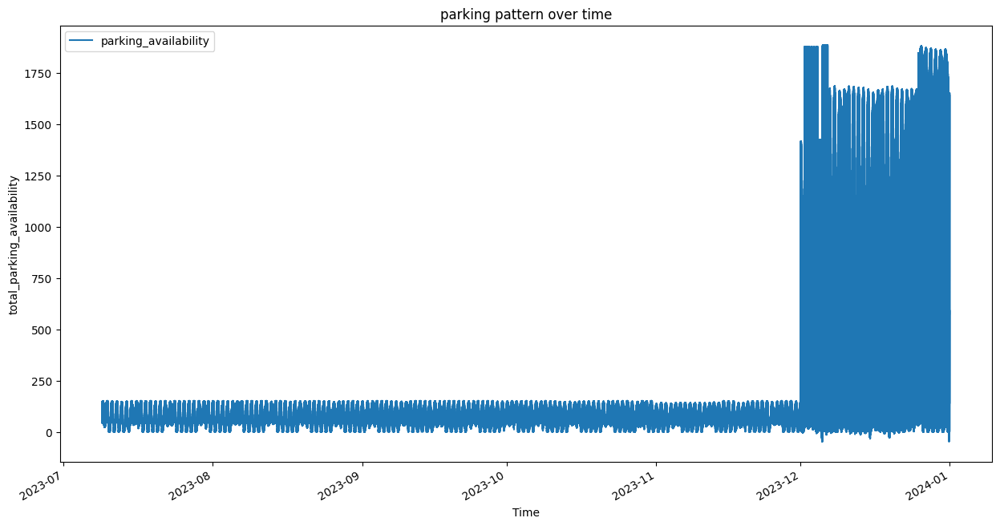

In [11]:
#plotting the parking availability trend
plotting_data.plot(figsize = (15, 8))
plt.title("parking pattern over time")
plt.xlabel('Time')
plt.ylabel("total_parking_availability")
plt.show()

Our time series data has high frequency or irregular time intervals, we considered resampling to a lower frequency to obtain a more meaningful plot. Resampling allows you to aggregate data over specified time intervals, in our case we shall resample the data down to day, week and month
#
We wrote a function to help us plot the patterns

In [12]:
#helper function for plotting patterns
def parking_pattern(data, size):
    data.plot(figsize = (15, 8))
    plt.title(f"parking pattern on a {size} basis")
    plt.xlabel('Time')
    plt.ylabel("total_parking_availability")
    plt.show()

1. Daily pattern of parking availability

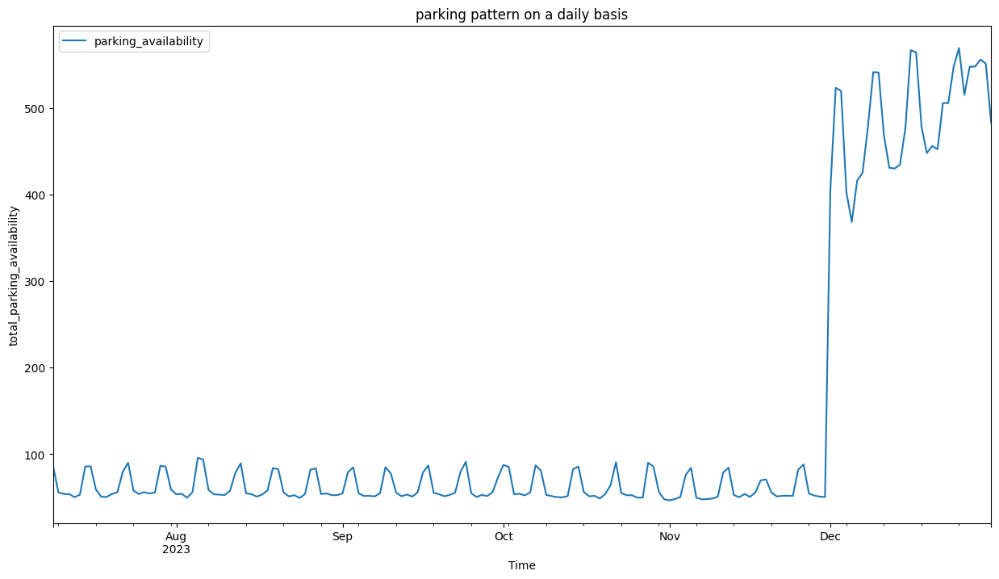

In [13]:
daily_pattern = plotting_data.resample("D").mean()
parking_pattern(daily_pattern, "daily")

2. Weekly pattern

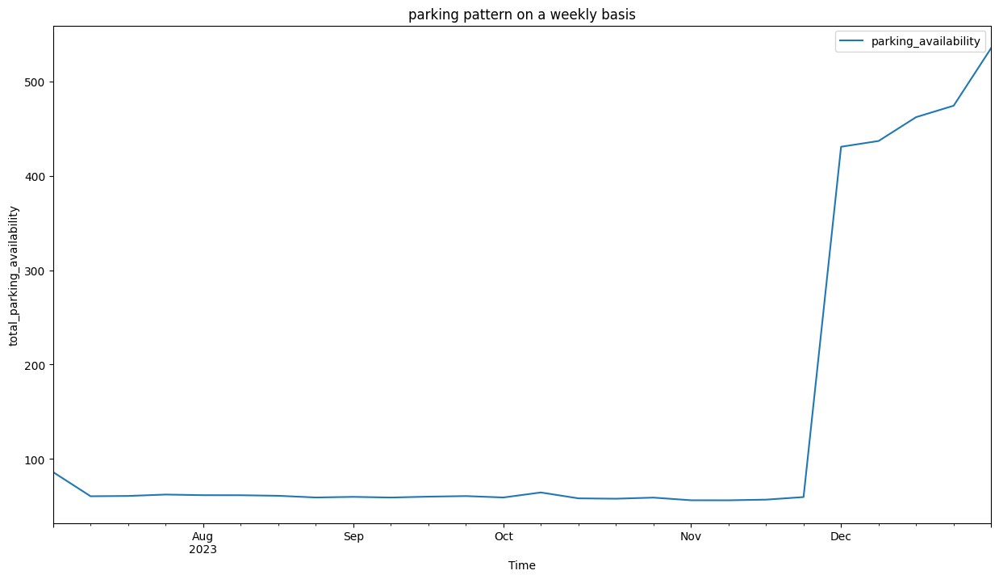

In [14]:
weekly_pattern = plotting_data.resample("W").mean()
parking_pattern(weekly_pattern, "weekly")

Monthly parking pattern

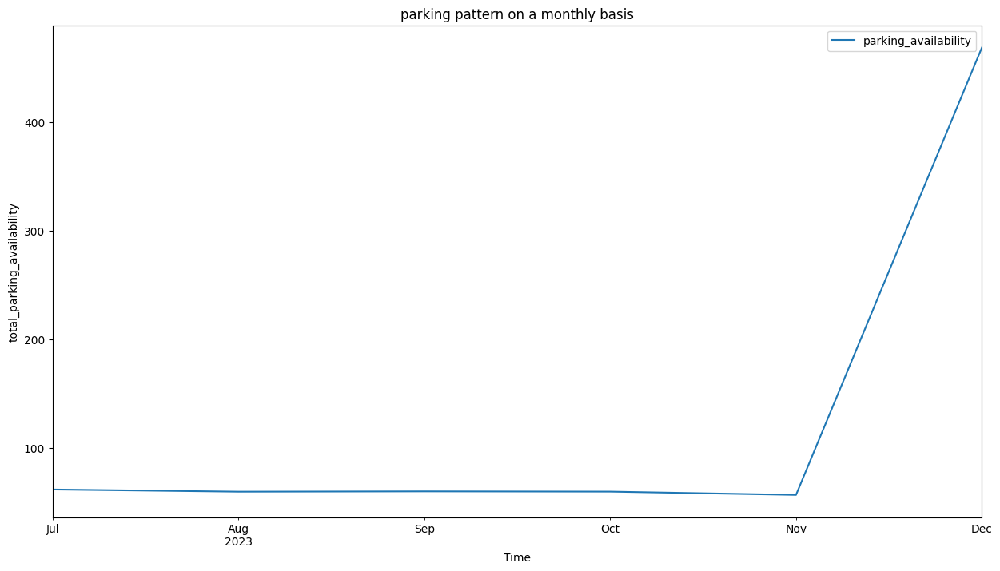

In [15]:
monthly_pattern = plotting_data.resample("M").mean()
parking_pattern(monthly_pattern, "monthly")

Checking for stationarity. A time series is considered stationary if its statistical properties, such as mean, variance, and autocorrelation, do not change over time. In simple words, the time series data shows consistent behavior and does not exhibit trends or seasonality.

In [16]:
#importing adfuller test from statsmodels
from statsmodels.tsa.stattools import adfuller
def stationarity_test(dataset):
    ad_test = adfuller(dataset, autolag = "AIC")
    print("1. ADF: ",ad_test[0])
    print("2. p-value: ",ad_test[1])
    print("3. Number of lags: ", ad_test[2])
    print("4. Number of obeservations used for ADF regression and critical values calculation: ", ad_test[3])
    print("5. Critical values: ")
    

In [17]:
# stationarity_test(plotting_data["total_parking_spots"])

instantiating the `autoarima model` for our time series problem

In [18]:
# from pmdarima import auto_arima
# from sklearn.metrics import mean_squared_error, mean_absolute_error
# #fitting the model
# auto_arima_model = auto_arima(plotting_data["parking_availability"], trace= True, suppress_warnings= True)

In [19]:
daily_pattern

,parking_availability
timestamp,
2023-07-09,86.091106
2023-07-10,55.566964
2023-07-11,53.878049
2023-07-12,53.682893
2023-07-13,50.186798
...,...
2023-12-27,547.711993
2023-12-28,547.839515
2023-12-29,555.895052


Now that we already know the behavior of our data, the model to use and and the order to specify we will go ahead and train a model and make some few predictions. We are also going to split our data into train, test and validation

In [20]:
#importing arima model
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
#splitting data
train_data, test_data = train_test_split(daily_pattern, test_size= 0.3, random_state= 42)

In [21]:
#instantiating ARIMA model
arima_model = ARIMA(train_data, order = (2, 1, 2))
arima_model = arima_model.fit()
arima_model.summary()

/home/ezra_analytics/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/ezra_analytics/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/ezra_analytics/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/ezra_analytics/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._in

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:     parking_availability   No. Observations:                  123
Model:                   ARIMA(2, 1, 2)   Log Likelihood                -799.475
Date:                  Sun, 11 Feb 2024   AIC                           1608.950
Time:                          16:25:21   BIC                           1622.970
Sample:                               0   HQIC                          1614.644
                                  - 123                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5834      0.808     -0.722      0.470      -2.167       1.001
ar.L2         -0.1243      0.109     -1.145      0.252      -0.337       0.089
ma.L1         -0.4754      2.494     -0.191      0.849      -5.364       4.413
ma.L2         -0.5243      1.734     -0.302      0.762      -3.922       2.874
sigma2      2.769e+04   6.96e+04      0.398      0.691   -1.09e+05    1.64e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                56.43
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               1.99   Skew:                             1.59
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

We will also do a prediction to see how well our model has learnt. For the predict method, you need to pass in the start and end parameters for the period you want to predict

In [22]:
#specifying start and end
start = len(train_data)
end = len(train_data) + len(test_data)-1
predictions = arima_model.predict(start = start, end= end, type = "level")
predictions.index = plotting_data.index[start:end+1]
print(round(predictions, 2))


timestamp
2023-12-01 06:20:02    154.40
2023-12-01 06:21:02    143.76
2023-12-01 06:21:42    136.82
2023-12-01 06:24:01    142.19
2023-12-01 06:24:06    139.92
2023-12-01 06:24:13    140.58
2023-12-01 06:24:19    140.48
2023-12-01 06:25:38    140.45
2023-12-01 06:25:43    140.48
2023-12-01 06:28:24    140.47
2023-12-01 06:28:30    140.47
2023-12-01 06:29:01    140.47
2023-12-01 06:29:20    140.47
2023-12-01 06:31:51    140.47
2023-12-01 06:33:01    140.47
2023-12-01 06:33:46    140.47
2023-12-01 06:33:55    140.47
2023-12-01 06:34:03    140.47
2023-12-01 06:34:27    140.47
2023-12-01 06:34:55    140.47
2023-12-01 06:35:13    140.47
2023-12-01 06:35:56    140.47
2023-12-01 06:36:12    140.47
2023-12-01 06:37:26    140.47
2023-12-01 06:37:47    140.47
2023-12-01 06:38:00    140.47
2023-12-01 06:38:06    140.47
2023-12-01 06:38:12    140.47
2023-12-01 06:38:56    140.47
2023-12-01 06:39:04    140.47
2023-12-01 06:39:21    140.47
2023-12-01 06:39:27    140.47
2023-12-01 06:39:59    140.47


/home/ezra_analytics/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


Plotting prediction against  actual for a given time series to see how the model behaves visually

<Axes: xlabel='timestamp'>

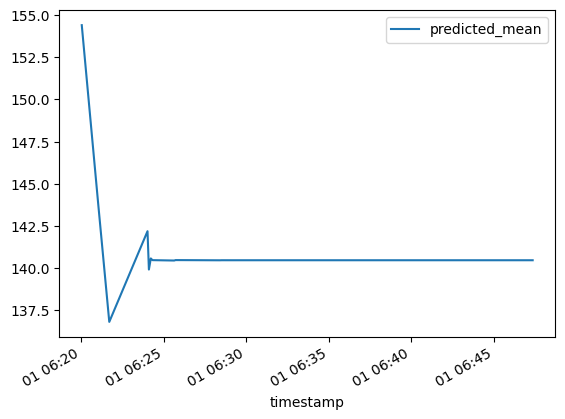

In [23]:
predictions.plot(legend =True)
# daily_pattern["parking_availability"].plot(legend= True)


If you want to see exactly how good or bad it is we can check the `mae` and the `rmse` of our train and test data then compare it to the mean of our dataset

In [24]:
print(daily_pattern.mean())

parking_availability    136.861683
dtype: float64


In [25]:
#getting the mse and rmse
pred_rmse = sqrt(mean_squared_error(predictions, test_data))
print(pred_rmse)

160.19892446636382


The rmse range is greater than the mean of the data, meaning that for every prediction we make we are  getting a value 160.2 further away from the actual result. This means that our model is not performing well and needs improvement
#
#### Making future predictions
For this to take place effectively we will train the model on the whole dataset

In [26]:
# arima_model2 = ARIMA(plotting_data, order= (2,1,2))
# arima_model2 = arima_model2.fit()

In [27]:
# #setting up future dates 
# future_dates = pd.date_range(start= "2024-01-01", end = "2024-01-31")
# #making prediction
# future_preds = arima_model2.predict(start = len(plotting_data), end = len(plotting_data)+ 30, type = "levels")
# future_preds.index = future_dates
# print(future_preds)

Viewing the predictions from the `ARIMA` model, we can see there is similarity in the values except for the decimal values. This indicates our model  has not captured most of the seasonality and trend component.Our model maybe also overfitting  to the training data or it may be that the series does not have a strong enough seasonal component.

Having also many facilities makes it hard to interpret the prediction for each facility. To overcome this problem, we are going to group our data using facility name and then model time series for each facility in our dataset. This will ease prediction of a parking availability for a given facility, date and time

In [28]:
grouped_data = dddata.copy()
grouped_data.drop(columns=["ParkID", "zone_id"], axis= 1,inplace= True)

In [29]:
grouped_data

,facility_name,total_parking_spots,occupancy_total,day_of_week,date,time,parking_availability,time_category,z_score
0,Edmondson Park South Car Park,1429,28,Friday,2023-12-01,00:09:20,1401,Night,2.535373
1,Edmondson Park South Car Park,1429,27,Friday,2023-12-01,00:12:57,1402,Night,2.537913
2,Edmondson Park South Car Park,1429,26,Friday,2023-12-01,00:13:45,1403,Night,2.540453
3,Edmondson Park South Car Park,1429,25,Friday,2023-12-01,00:17:43,1404,Night,2.542992
4,Edmondson Park South Car Park,1429,25,Friday,2023-12-01,00:27:43,1404,Night,2.542992
...,...,...,...,...,...,...,...,...,...
599280,Campbelltown Hurley Street South Car Park,118,62,Sunday,2023-12-31,23:21:38,56,Night,-0.880331
599281,Campbelltown Hurley Street South Car Park,118,62,Sunday,2023-12-31,23:31:38,56,Night,-0.880331
599282,Campbelltown Hurley Street South Car Park,118,61,Sunday,2023-12-31,23:39:15,57,Night,-0.877792
599283,Campbelltown Hurley Street South Car Park,118,61,Sunday,2023-12-31,23:49:15,57,Night,-0.877792


In [30]:
# import prophet
# # Create the ColumnTransformer
# ohe_pipeline = Pipeline(steps=[('enc', OneHotEncoder(drop="first", sparse=False))])
# transformer = ColumnTransformer(transformers=[("ohe", ohe_pipeline, categorical_columns)], remainder="passthrough")

# # Group data by facility_name
# grouped_data = modelling_data.groupby("facility_name")

# # Loop through each facility until the last one
# for facility, facility_data in grouped_data:
#     # Apply OHE within this facility's data
#     transformed_data = transformer.fit_transform(facility_data)

#     # Reconstruct DataFrame with encoded columns
#     transformed_df = pd.DataFrame(transformed_data, columns=transformer.get_feature_names_out())

#     # Select columns for Prophet (assuming 'ds' for datetime, 'occupancy_total' for target)
#     model_data = transformed_df[['ohe__day_of_week_Monday', 'ohe__day_of_week_Saturday',
#     'ohe__day_of_week_Sunday', 'ohe__day_of_week_Thursday',
#     'ohe__day_of_week_Tuesday', 'ohe__day_of_week_Wednesday',
#     'ohe__time_category_Early Morning', 'ohe__time_category_Evening',
#     'ohe__time_category_Late Afternoon', 'ohe__time_category_Morning',
#     'ohe__time_category_Night', 'remainder__total_parking_spots',
#     'remainder__occupancy_total', 'remainder__parking_availability',
#     'remainder__z_score', 'date', 'time']] 

#     # Create and fit Prophet model
#     model = prophet.Prophet()
#     model.fit(model_data)

#     # Make predictions for a specified future period (e.g., next week)
#     future = model.make_future_dataframe(periods=prediction_period)
#     forecast = model.predict(future)

#     # Analyze and store results for this facility (optional)
#     # ...

#     # Check if this is the last facility
#     if next(iter(grouped_data), None) is None:  # Check if there are no more facilities
#         print("Processed predictions for all facilities")
#         break

# # Further analysis or visualization using predictions/models for each facility (optional)
# # ...



We will create a class for the `Prophet` that iterates over grouped data does time series using given columns and allows us to make predictions  on future data. 

First lets preprocess our categorical/string dtype columns

In [31]:
from datetime import datetime
#function to conver to datetime
def to_datetime(x):
    return datetime.strptime(x,  "%Y-%m-%d %H:%M:%S")

pprophet_data = pd.read_csv("modelling_data.csv", parse_dates= [["date", "time"]], date_parser= to_datetime)

In [32]:
#setting datetime as index
prophet_data = pprophet_data.drop(["day_of_week", "time_category", "ParkID", "zone_id", "z_score"], axis= 1)
prophet_data = prophet_data.set_index("date_time").groupby("facility_name").resample("D").mean()
#inspecting our data
prophet_data.head()

total_parking_spots  occupancy_total  \
facility_name        date_time                                          
Bella Vista Car Park 2023-12-01                777.0       332.854559   
                     2023-12-02                777.0       197.873521   
                     2023-12-03                777.0       137.133550   
                     2023-12-04                777.0       346.532401   
                     2023-12-05                777.0       409.501304   

                                 parking_availability  
facility_name        date_time                         
Bella Vista Car Park 2023-12-01            444.145441  
                     2023-12-02            579.126479  
                     2023-12-03            639.866450  
                     2023-12-04            430.467599  
                     2023-12-05            367.498696

We have two index columns in our grouped dataframe, we will reset the index, return `date_time` as the index and plot  and do some visualizations on our facilities

In [33]:
#resetting index
prophet_data = prophet_data.reset_index()


Plotting all trends in one plot

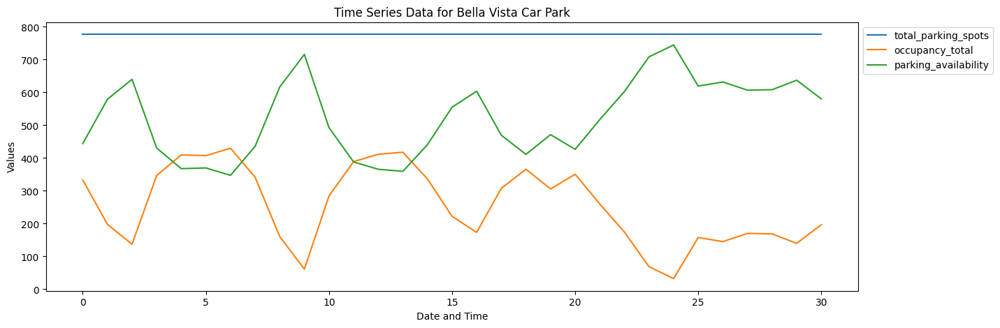

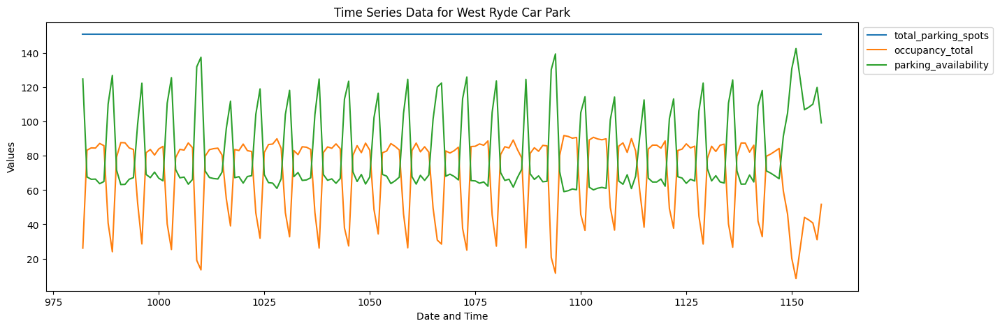

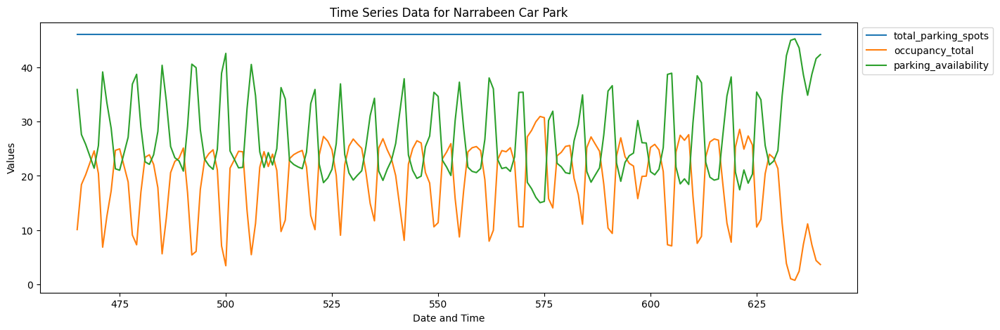

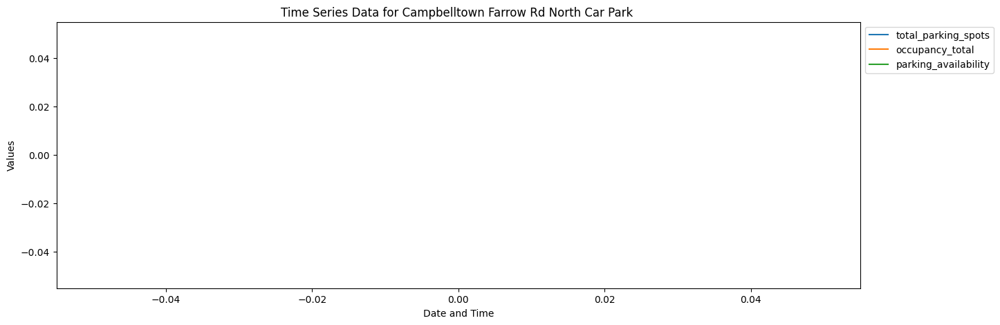

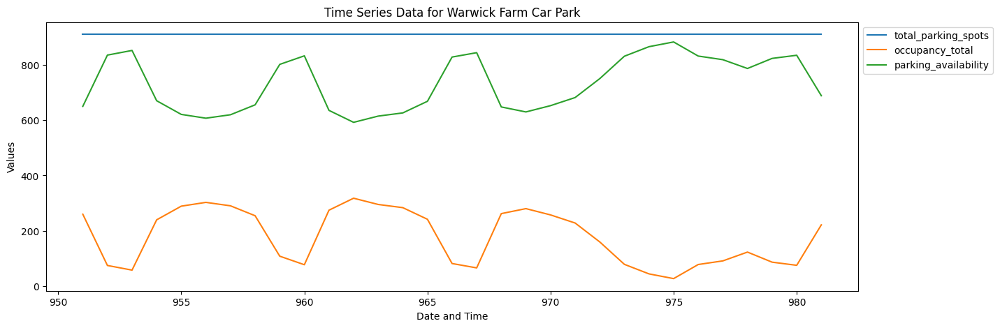

...

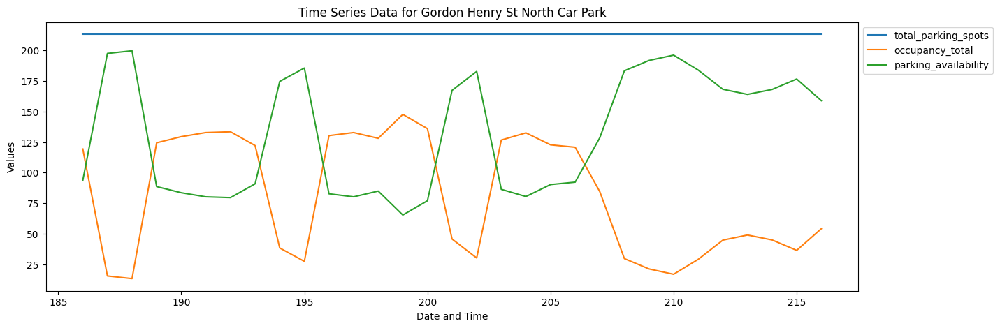

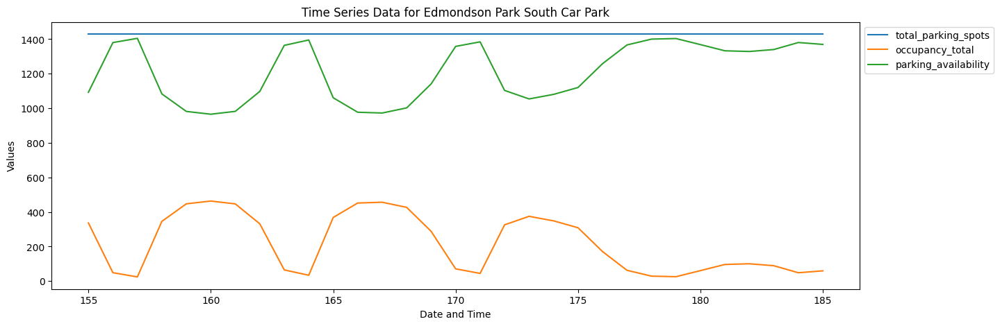

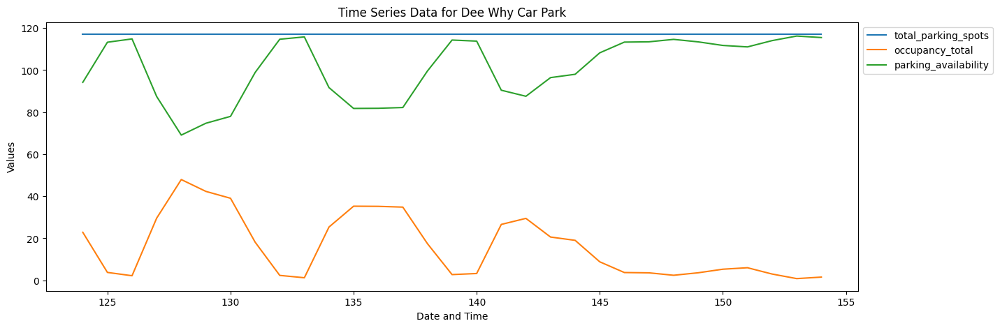

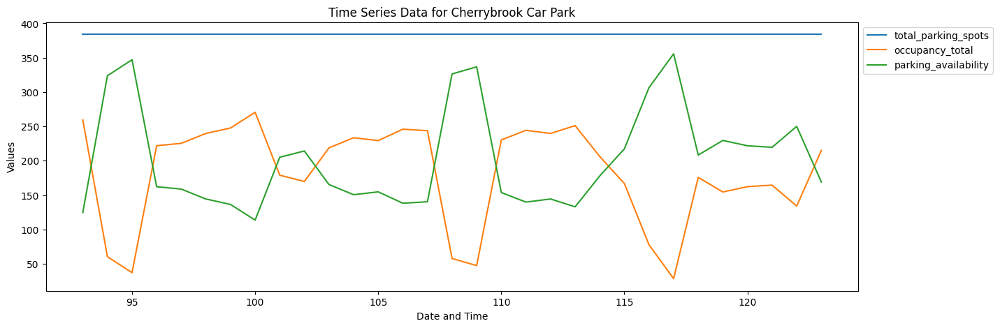

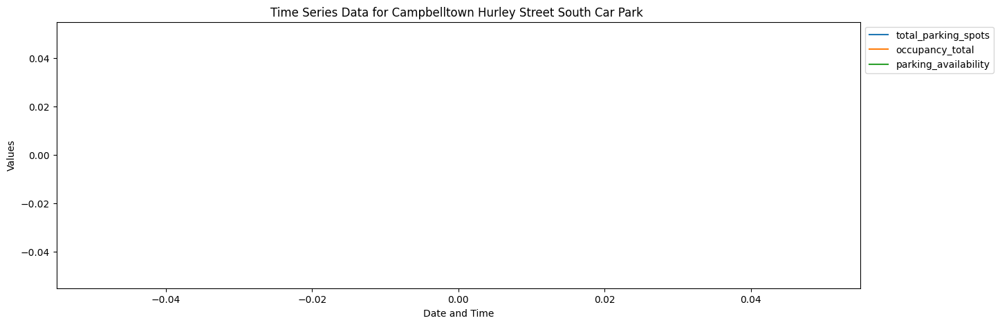

In [34]:
import matplotlib.pyplot as plt

def plot_facilities(data, facilities, columns=["total_parking_spots", "occupancy_total", "parking_availability"], figsize=(15, 5)):
    # Set the 'date_time' column as the index
    data.set_index("date_time")

    # Filter data for the specified facilities
    filtered_data = data[data['facility_name'].isin(facilities)]

    for facility in facilities:
        facility_data = filtered_data.query(f"facility_name == '{facility}'")

        # Create a new figure for each facility
        fig, ax = plt.subplots(figsize=figsize)
        
        # Plot the data for the current facility
        facility_data[columns].plot(ax=ax, label=facility)

        # Set title, labels, and legend
        ax.set_title(f"Time Series Data for {facility}")
        ax.set_xlabel("Date and Time")
        ax.set_ylabel("Values")
        ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

        plt.show()

# Example usage
facilities_to_plot = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park", "Campbelltown Farrow Rd North Car Park " ,
                    "Warwick Farm Car Park", "Warriewood Car Park", "Tallawong P3 Car Park ", "Tallawong P3 Car Park", "Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Schofields Car Park ", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park", "Kiama Car Park ",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park", "Gosford Car Park ",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park", "Campbelltown Hurley Street South Car Park "]
plot_facilities(prophet_data, facilities_to_plot, figsize=(15, 5))




Voila! We can see our parking facilities have different seasonalities and trends. We can not generalize this and build one time series model. What we will do is to create separate models for each of the facility, which will allow us to make accurate predictions and forecasting.

In [35]:
prophet_data

,facility_name,date_time,total_parking_spots,occupancy_total,parking_availability
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696
...,...,...,...,...,...
1153,West Ryde Car Park,2023-12-27,151.0,44.062500,106.937500
1154,West Ryde Car Park,2023-12-28,151.0,42.627692,108.372308
1155,West Ryde Car Park,2023-12-29,151.0,40.794304,110.205696
1156,West Ryde Car Park,2023-12-30,151.0,31.003378,119.996622


#### 1. Prophet model
Prophet is a time series forecasting tool developed by Facebook that utilizes an additive model to capture seasonality, trends, and holidays, providing a user-friendly approach for accurate and efficient predictions.
#
We will create a final dataframe that has the date_time column and the columns we will need for our analysis. Prophet model expects data in a particular format; it expects the name of date column to be "ds" and the target variable as y
#
Before everything we will create a prophet pipeline

In [36]:
#importin
from sklearn.pipeline import Pipeline
import prophet
#creating a pipeline
prophet_pipeline = Pipeline(steps=[
    ("prophet", prophet.Prophet(interval_width = 0.95))
])

In [37]:
final_prophet_data = prophet_data[["facility_name", "date_time", "total_parking_spots",
                    "occupancy_total", "parking_availability"]].rename({"date_time": "ds", "parking_availability": "y"}, axis = "columns")
final_prophet_data

,facility_name,ds,total_parking_spots,occupancy_total,y
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696
...,...,...,...,...,...
1153,West Ryde Car Park,2023-12-27,151.0,44.062500,106.937500
1154,West Ryde Car Park,2023-12-28,151.0,42.627692,108.372308
1155,West Ryde Car Park,2023-12-29,151.0,40.794304,110.205696
1156,West Ryde Car Park,2023-12-30,151.0,31.003378,119.996622


Grouping by facility names to allow us to know all the stations and model different time series

In [38]:
facility_names = final_prophet_data.groupby("facility_name")
facility_names.head()

,facility_name,ds,total_parking_spots,occupancy_total,y
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696
...,...,...,...,...,...
982,West Ryde Car Park,2023-07-09,151.0,26.096154,124.903846
983,West Ryde Car Park,2023-07-10,151.0,83.332623,67.667377
984,West Ryde Car Park,2023-07-11,151.0,84.679089,66.320911
985,West Ryde Car Park,2023-07-12,151.0,84.564356,66.435644


Splitting our data into train, test and  validation sets

In [39]:
# for facility in facility_names.groups:
#     group = facility_names.get_group(facility)
#     #train data
#     train = group[(group["ds"]>= "2023-12-01") & (group["ds"]<= "2023-12-16")]
#     #test_data
#     test = group[(group["ds"]>= "2023-12-17") & (group["ds"]<= "2023-12-31")]
    
# print(train.shape)
# print(test.shape)

Creating an empty dataframe so we can build a forecast for the whole 28 facilities

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1


INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start 

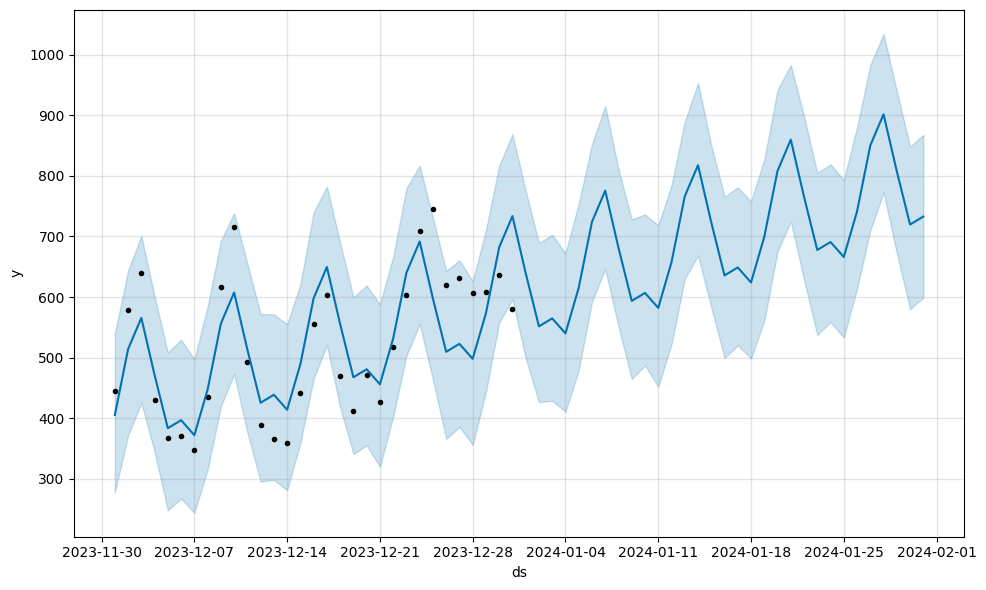

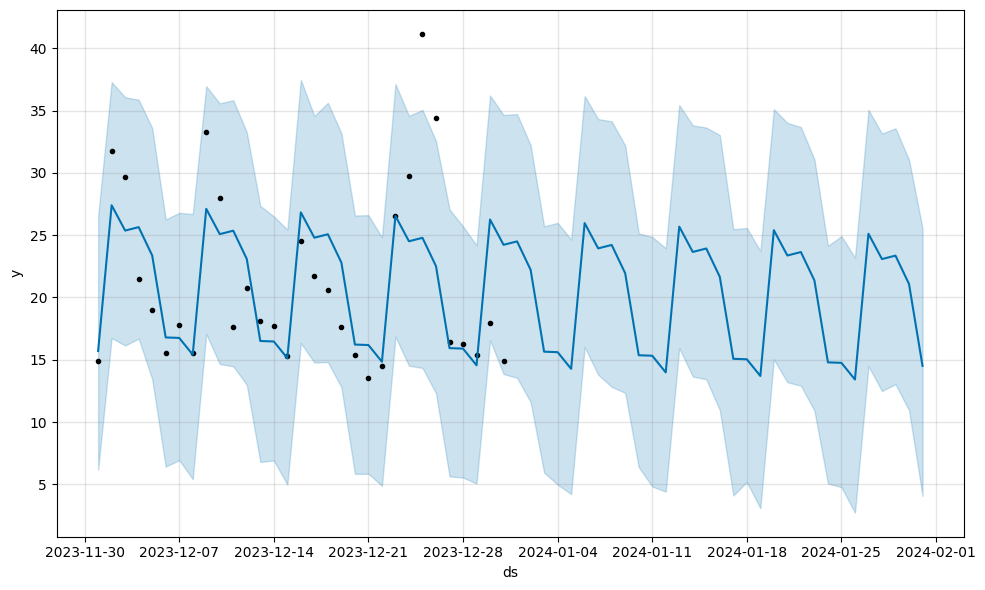

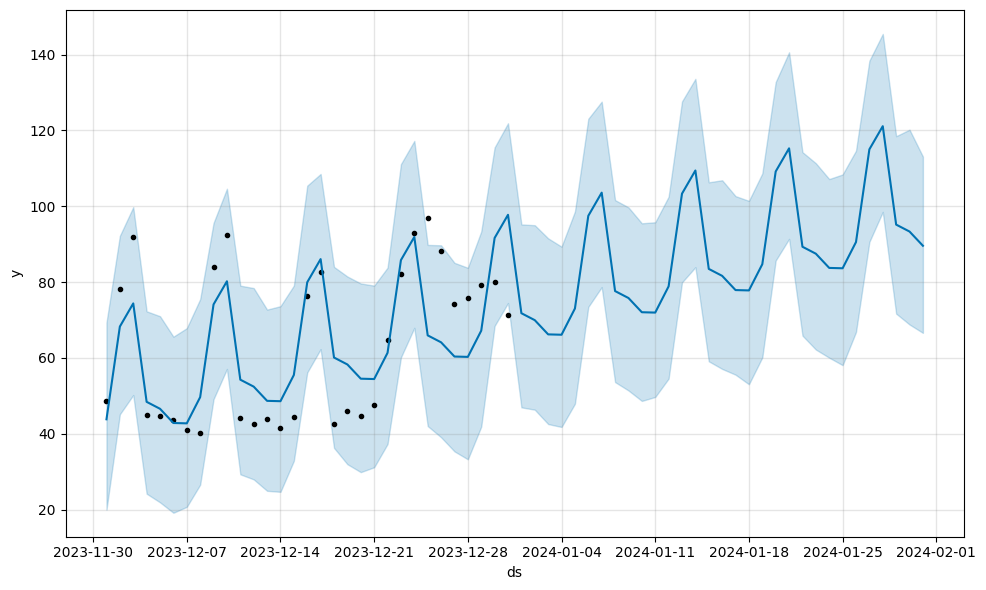

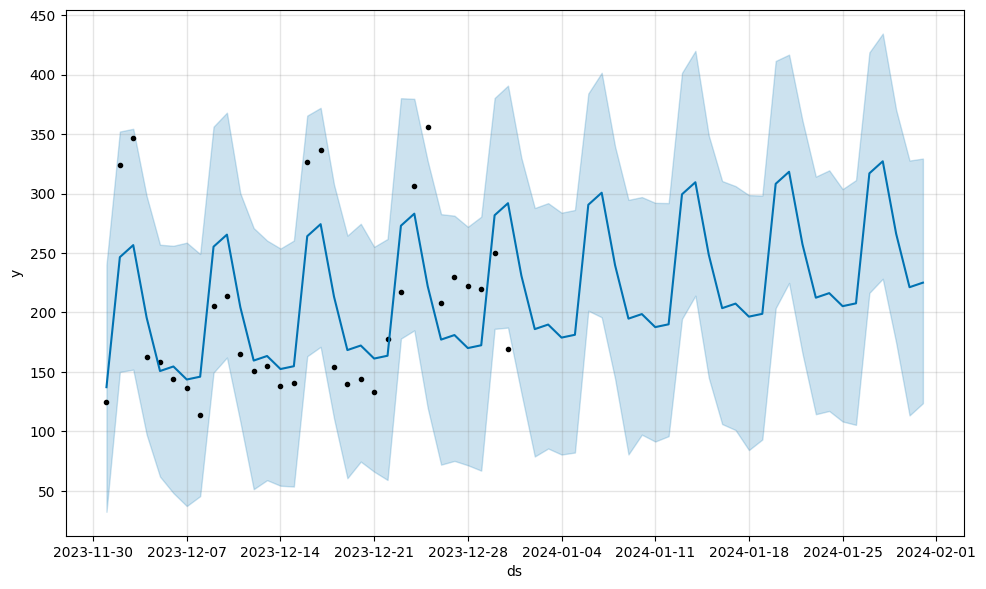

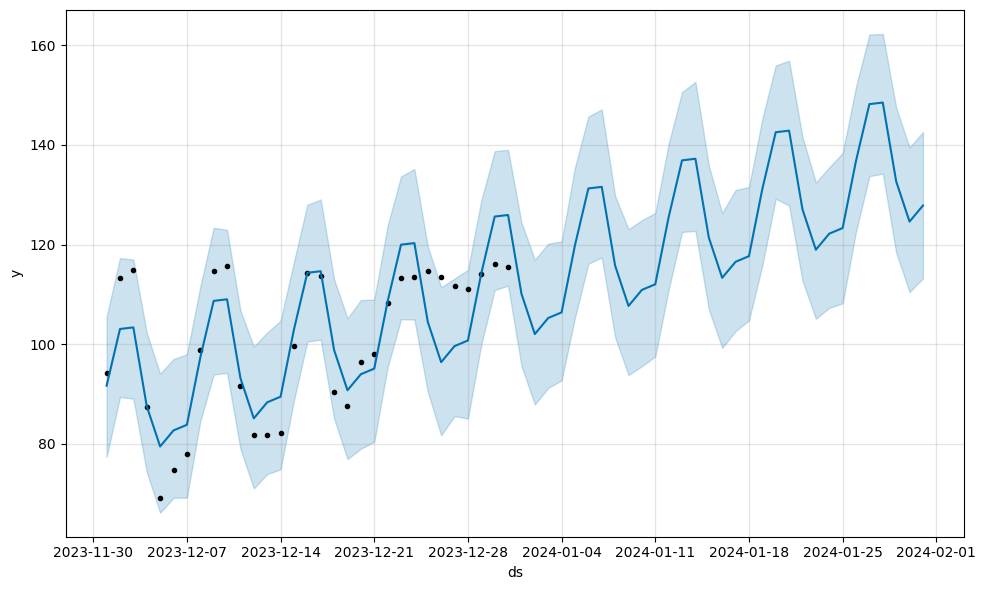

...

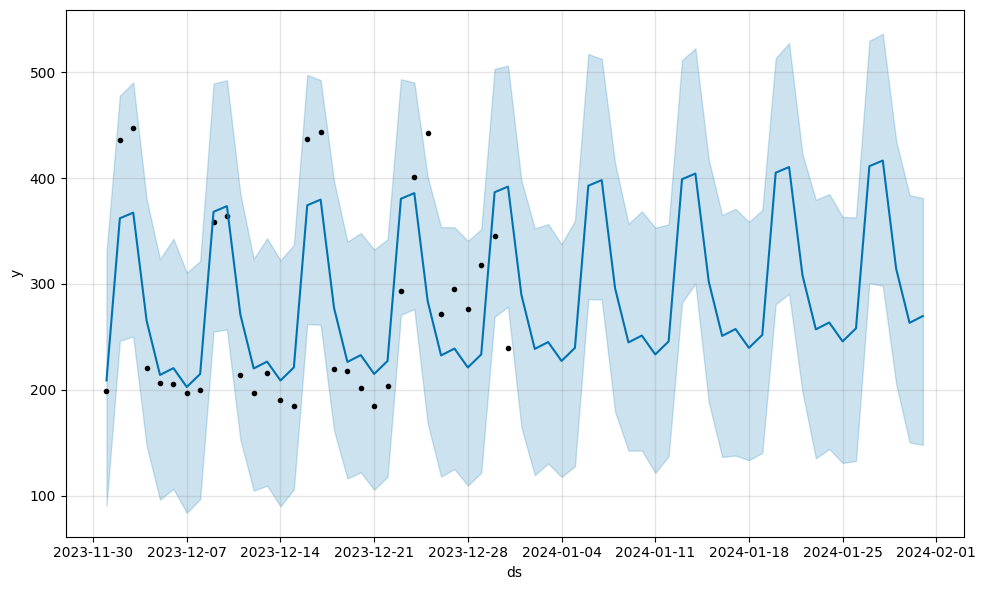

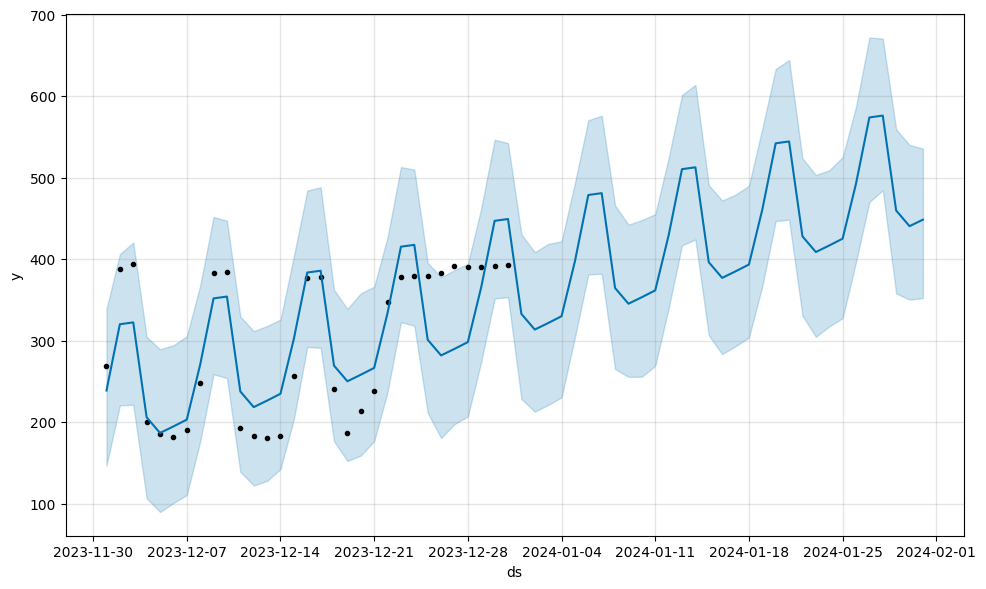

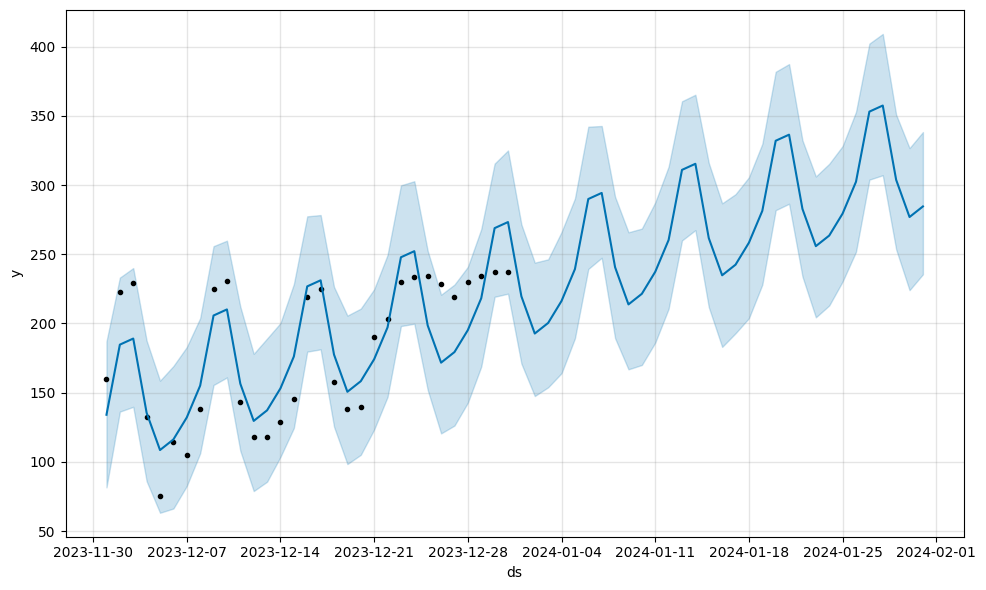

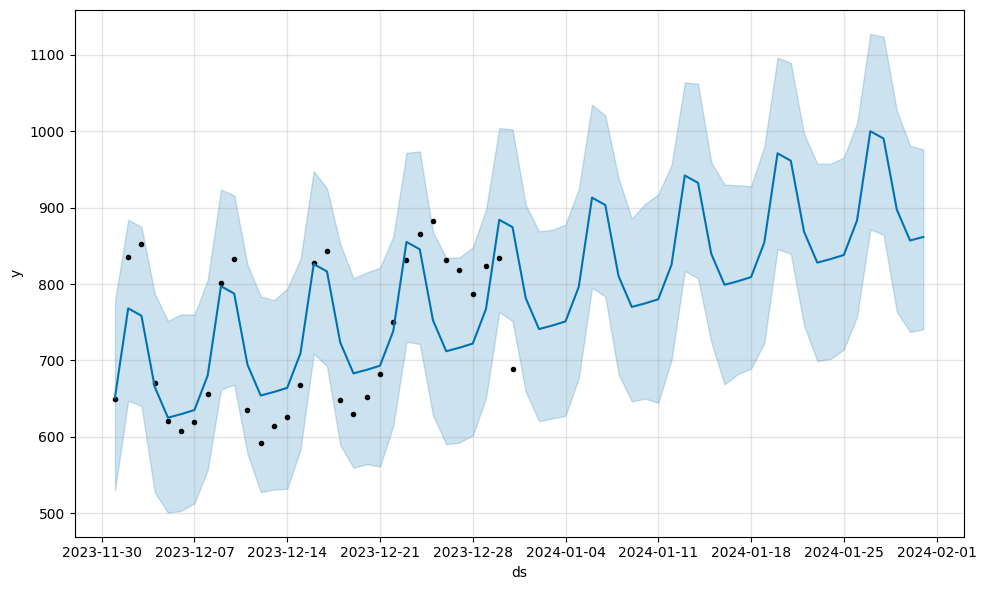

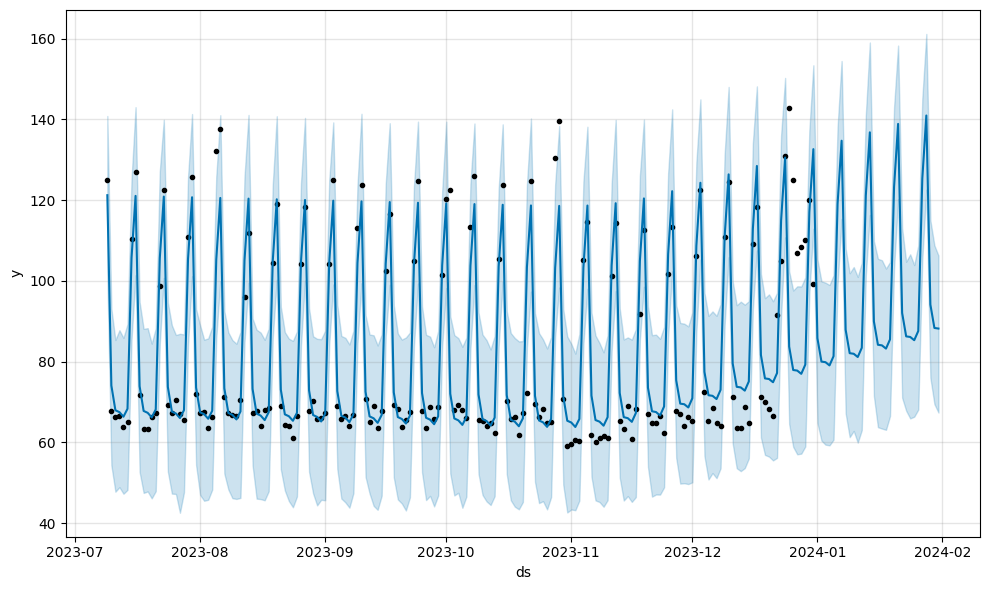

In [40]:
#creating an empty dataframe
target = pd.DataFrame()
# Looping over facilities to perform forecasting
for facility in facility_names.groups:
    group = facility_names.get_group(facility)
    model = prophet.Prophet(interval_width=0.95)
    
    # Fit the model to the data
    model.fit(group)
    
    # Create a future DataFrame
    future = model.make_future_dataframe(periods=31)
    
    # Generate forecasts
    forecast = model.predict(future)
    
    # Plot the forecast
    model.plot(forecast)
    
    # Rename columns in the forecast DataFrame
    forecast = forecast.rename(columns={"yhat": f"yhat_{facility}", "ds": "ds_forecast"})
    
    # Drop unnecessary columns before merging
    forecast = forecast[["ds_forecast", f"yhat_{facility}"]]
    
    # Merge with updated column names
    target = pd.merge(target, forecast.set_index("ds_forecast"), how="outer", left_index=True, right_index=True)

The blackpoints on the plots are the actual `parking_availability` and the blue points  are the predicted values. The light blue background  represents the confidence interval which in our case is set to 95%

In [41]:
target

,yhat_Bella Vista Car Park,yhat_Campbelltown Farrow Rd North Car Park,yhat_Campbelltown Hurley Street South Car Park,yhat_Cherrybrook Car Park,yhat_Dee Why Car Park,yhat_Edmondson Park South Car Park,yhat_Gordon Henry St North Car Park,yhat_Gosford Car Park,yhat_Hills Showground Car Park,yhat_Hornsby Jersey St Car Park,...,yhat_Revesby Car Park,yhat_Schofields Car Park,yhat_St Marys Car Park,yhat_Sutherland East Parade Car Park,yhat_Tallawong P1 Car Park,yhat_Tallawong P2 Car Park,yhat_Tallawong P3 Car Park,yhat_Warriewood Car Park,yhat_Warwick Farm Car Park,yhat_West Ryde Car Park
ds_forecast,,,,,,,,,,,,,,,,,,,,,
2023-07-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.211025
2023-07-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.065768
2023-07-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.948113
2023-07-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.478311
2023-07-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.354069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-27,850.280608,25.117970,115.017591,316.972048,148.180972,1718.104147,259.480880,862.056939,621.848349,182.299561,...,1129.064498,983.147223,808.113853,406.124197,33.233944,411.248272,573.794503,353.081523,1000.118881,125.336983
2024-01-28,901.856527,23.085449,121.126013,327.100760,148.499615,1739.050323,263.334312,816.683174,645.489261,187.552456,...,1144.751205,979.271140,819.198907,443.351361,41.717933,416.585208,576.059214,357.481969,990.469801,140.950021
2024-01-29,807.615586,23.361785,95.169455,266.141896,132.697331,1539.982404,199.741139,732.428990,500.141202,157.553414,...,1035.721816,824.527581,715.574747,367.545182,35.632049,314.364275,459.621799,303.797086,897.449311,94.126436


In [42]:
final_target = target[["yhat_"+facility for facility in facility_names.groups.keys()]]

In [43]:
final_target

,yhat_Bella Vista Car Park,yhat_Campbelltown Farrow Rd North Car Park,yhat_Campbelltown Hurley Street South Car Park,yhat_Cherrybrook Car Park,yhat_Dee Why Car Park,yhat_Edmondson Park South Car Park,yhat_Gordon Henry St North Car Park,yhat_Gosford Car Park,yhat_Hills Showground Car Park,yhat_Hornsby Jersey St Car Park,...,yhat_Revesby Car Park,yhat_Schofields Car Park,yhat_St Marys Car Park,yhat_Sutherland East Parade Car Park,yhat_Tallawong P1 Car Park,yhat_Tallawong P2 Car Park,yhat_Tallawong P3 Car Park,yhat_Warriewood Car Park,yhat_Warwick Farm Car Park,yhat_West Ryde Car Park
ds_forecast,,,,,,,,,,,,,,,,,,,,,
2023-07-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.211025
2023-07-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.065768
2023-07-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.948113
2023-07-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.478311
2023-07-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.354069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-27,850.280608,25.117970,115.017591,316.972048,148.180972,1718.104147,259.480880,862.056939,621.848349,182.299561,...,1129.064498,983.147223,808.113853,406.124197,33.233944,411.248272,573.794503,353.081523,1000.118881,125.336983
2024-01-28,901.856527,23.085449,121.126013,327.100760,148.499615,1739.050323,263.334312,816.683174,645.489261,187.552456,...,1144.751205,979.271140,819.198907,443.351361,41.717933,416.585208,576.059214,357.481969,990.469801,140.950021
2024-01-29,807.615586,23.361785,95.169455,266.141896,132.697331,1539.982404,199.741139,732.428990,500.141202,157.553414,...,1035.721816,824.527581,715.574747,367.545182,35.632049,314.364275,459.621799,303.797086,897.449311,94.126436


The dataframe above contains the forecast of the next 1 month based on the previous data the model has learned. We will plot the actual values versus the predicted values to see how  well our model is performing.

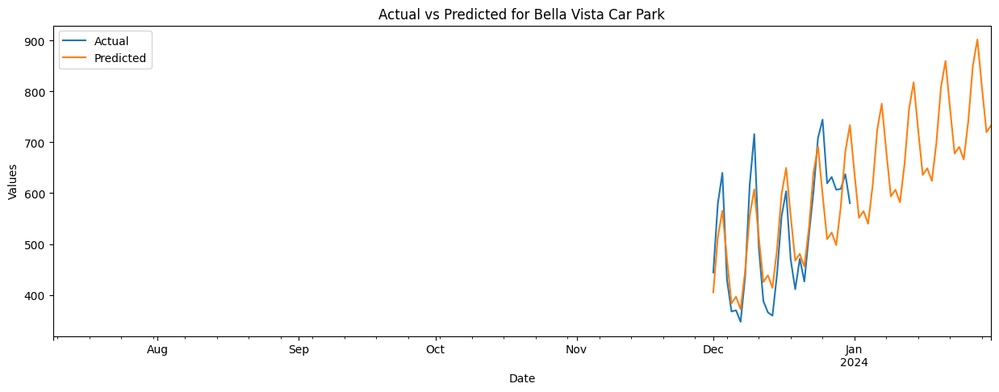

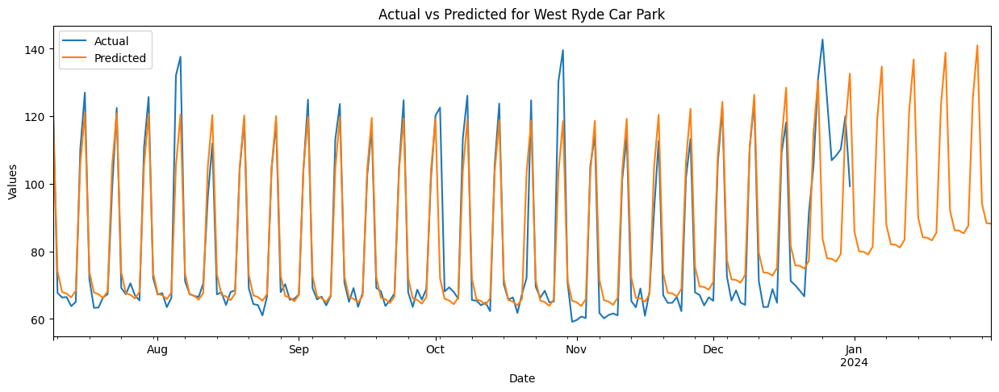

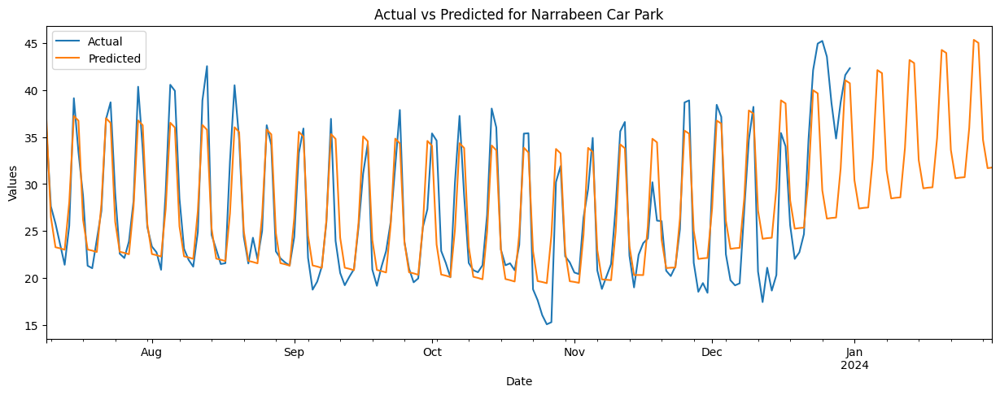

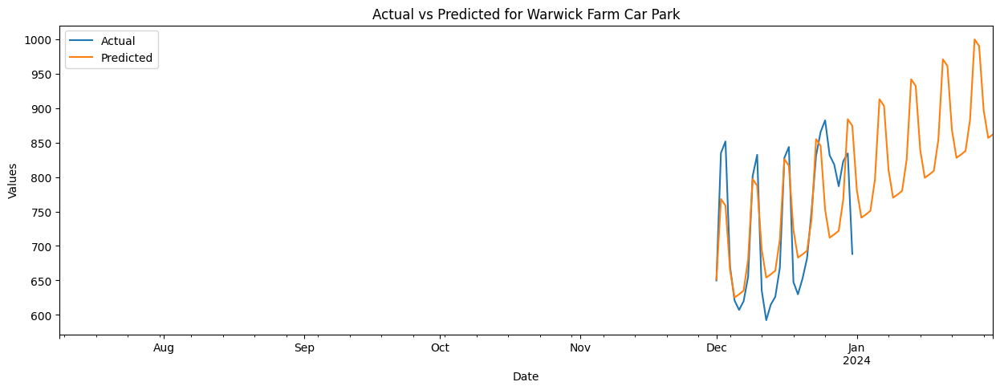

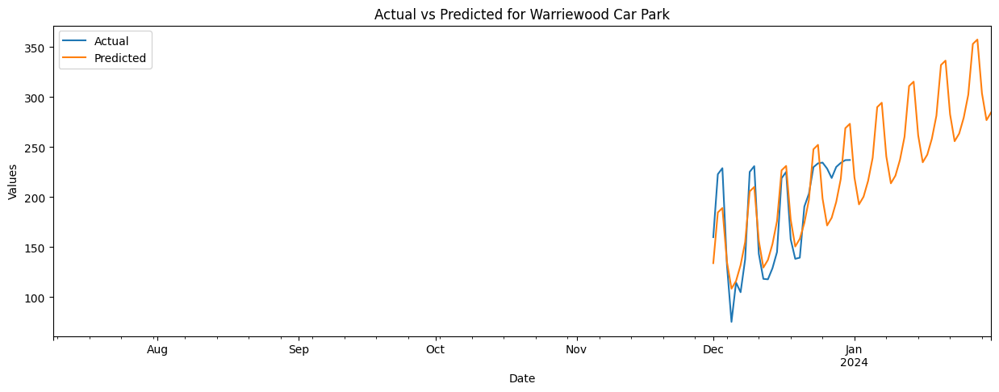

...

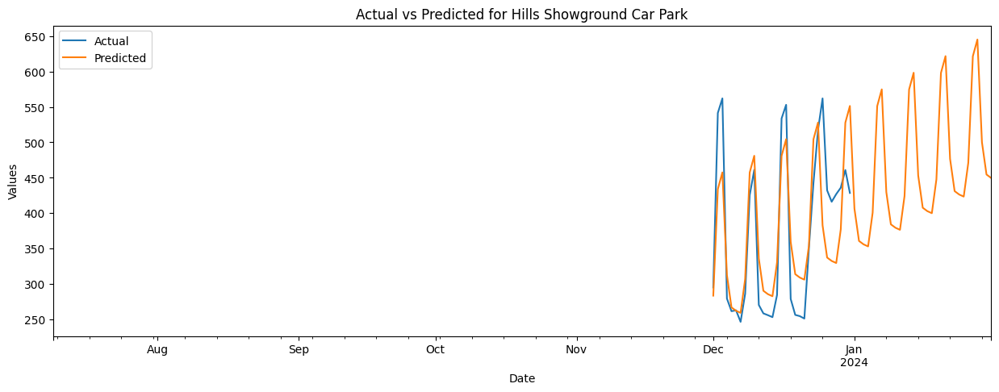

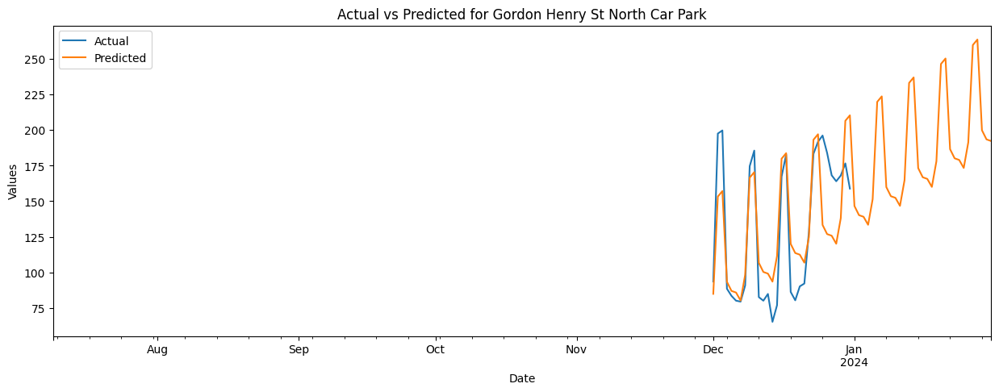

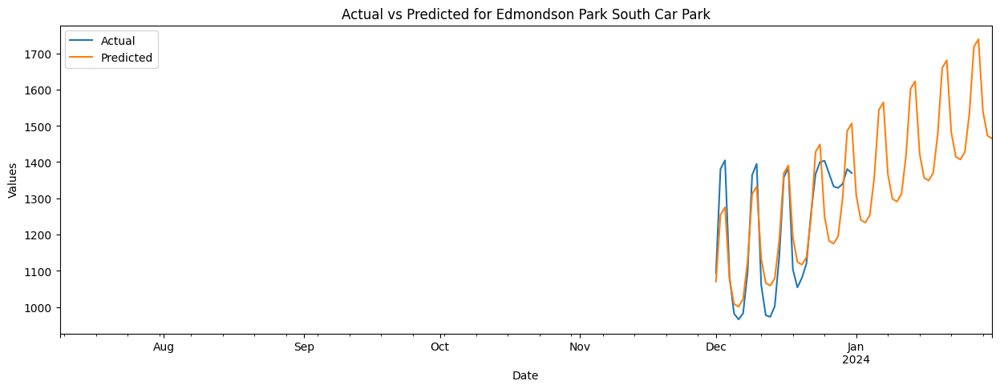

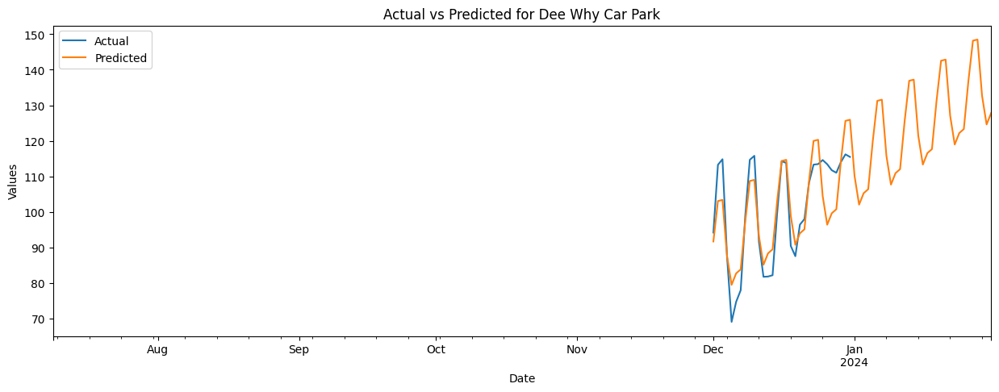

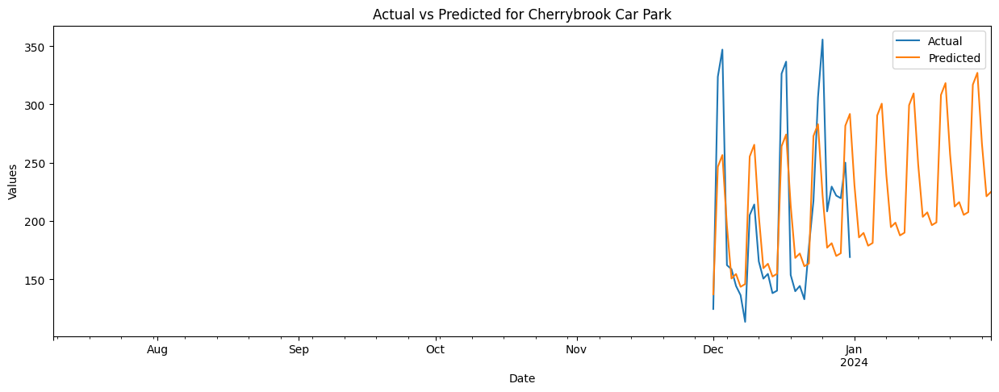

In [44]:
#facilities names
facility_names = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park",
                    "Warwick Farm Car Park", "Warriewood Car Park","Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park"]

# Loop through facility names
for facility in facility_names:
    # Get actual data for the facility from the original dataset
    actual_data = final_prophet_data.set_index("ds").query(f"facility_name == '{facility}'")["y"]

    # Get predicted data for the facility from the target DataFrame
    predicted_data = target[f"yhat_{facility}"]

    # Concatenate actual and predicted data
    combined_data = pd.concat([actual_data, predicted_data], axis=1)

    # Plot the actual vs predicted data 
    fig, ax = plt.subplots(figsize=(15, 5))
    combined_data.plot(ax=ax, title=f"Actual vs Predicted for {facility}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Values")
    ax.legend(["Actual", "Predicted"])


From the plots we can see our model recognizes the seasonality of our data although it doesn't recognize the peaks and this can suggest doing a multivariate analysis to incorporate other exogenous(external)  variables such as holidays and weather to see if our model will recognize the peaks
#### Evaluating the model
The metrics used to evaluate timeseries  forecasting models are: MAE (Mean Absolute Error), RMSE (Root Mean Squared Error) and MAPE (Mean Absolute Percentage Error). We will use these metrics to evaluate our model

#### Multivariate Prophet modelling
As we saw in our initial model that the peaks couldn't be recognized when making predictions, we will go ahead and build another model that incorporates other external variables to see if the model will improve on realising the points it didn't recognize earlier 

In [45]:
#our original dataframe
pprophet_data

,date_time,facility_name,ParkID,zone_id,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1,1,1429,28,Friday,1401,Night,2.535373
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1,1,1429,27,Friday,1402,Night,2.537913
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1,1,1429,26,Friday,1403,Night,2.540453
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1,1,1429,25,Friday,1404,Night,2.542992
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1,1,1429,25,Friday,1404,Night,2.542992
...,...,...,...,...,...,...,...,...,...,...
599280,2023-12-31 23:21:38,Campbelltown Hurley Street South Car Park,1,1,118,62,Sunday,56,Night,-0.880331
599281,2023-12-31 23:31:38,Campbelltown Hurley Street South Car Park,1,1,118,62,Sunday,56,Night,-0.880331
599282,2023-12-31 23:39:15,Campbelltown Hurley Street South Car Park,1,1,118,61,Sunday,57,Night,-0.877792
599283,2023-12-31 23:49:15,Campbelltown Hurley Street South Car Park,1,1,118,61,Sunday,57,Night,-0.877792


In [46]:
#setting datetime as index
second_prophet_data = pprophet_data.drop(["ParkID", "zone_id", "z_score", "time_category"], axis= 1)
#getting dummies
dummies_df = pd.get_dummies(second_prophet_data[['day_of_week']],
                            columns=["day_of_week"], prefix= ["day"])
#converting dummies to numerical
dummies_df = dummies_df.astype(int)
#joining the dummies and original df
final_df = pd.concat( [second_prophet_data, dummies_df] ,axis=1)
#dropping cat columns
final_df.drop( columns = "day_of_week", axis= 1, inplace = True)

In [47]:

#inspecting our final df
final_df.head()


,date_time,facility_name,total_parking_spots,occupancy_total,parking_availability,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,1401,1,0,0,0,0,0,0
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,1402,1,0,0,0,0,0,0
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,1403,1,0,0,0,0,0,0
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,1404,1,0,0,0,0,0,0
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,1404,1,0,0,0,0,0,0


Now we have all columns in a format we can work with in machine learning. 

Lets resample the data into daily observations for easy handling

In [48]:
#setting date to datetime
final_df['date_time'] = pd.to_datetime(final_df['date_time'])

# Set the datetime as index
final_df.set_index('date_time', inplace=True)
#resampling our data
final_data = final_df.groupby("facility_name").resample("D").mean()
#reset index
final_data = final_data.reset_index()

Renaming our columns in order to fit the prophet model

In [49]:
#renaming columns
col_mapper  = {"date_time": "ds", "parking_availability": "y"}
#rename
final_data.rename(columns=col_mapper, inplace=True)
#inspecting
final_data.head()

,facility_name,ds,total_parking_spots,occupancy_total,y,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Splitting our data into train and test

In [50]:
# train= final_data[(final_data['ds'] >= '2023-06-01') & (final_data['ds'] <= '2023-09-31')] 
# test= final_data[(final_data['ds'] > '2023-09-31')]

Instantiating prophet model so we can start modelling 

In [51]:

#grouping by facility in order to get predictions for each
parking_lots = final_data.groupby("facility_name")


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet w

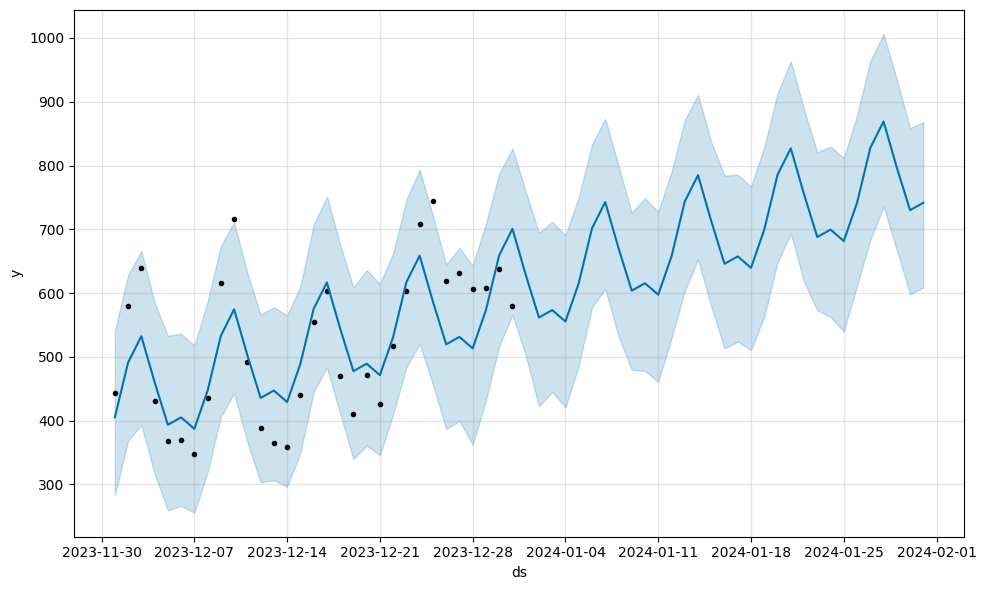

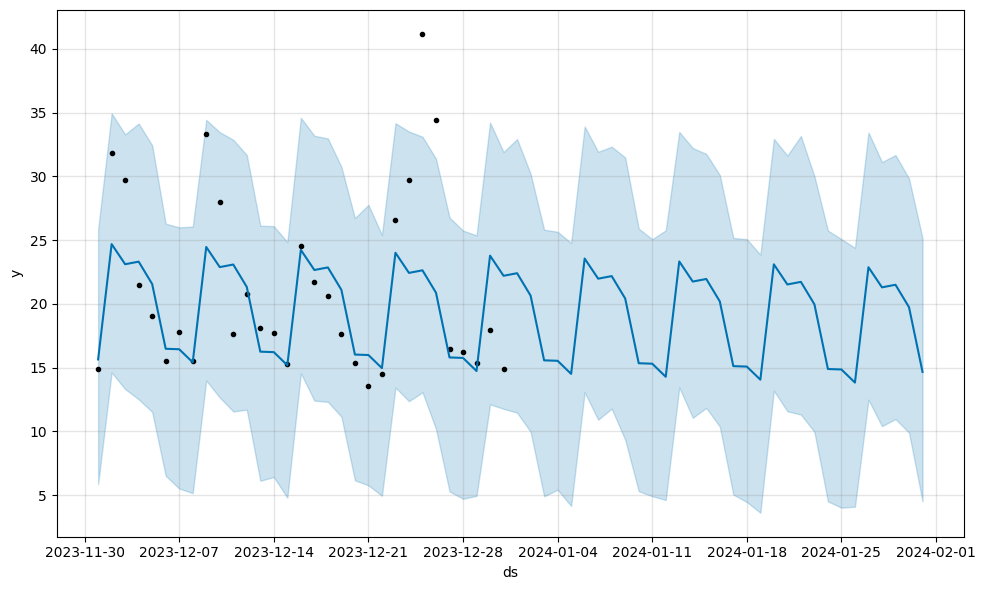

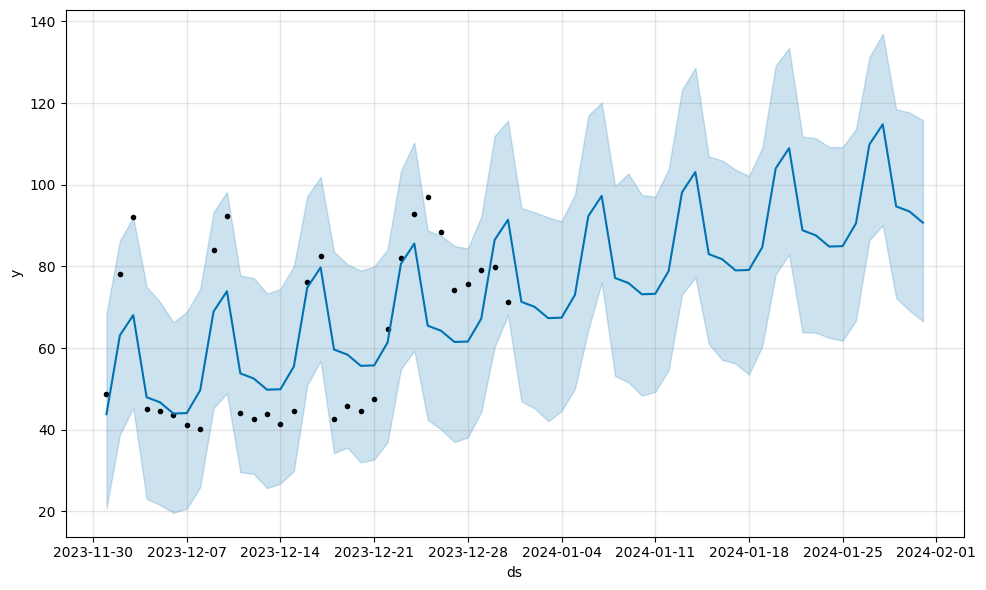

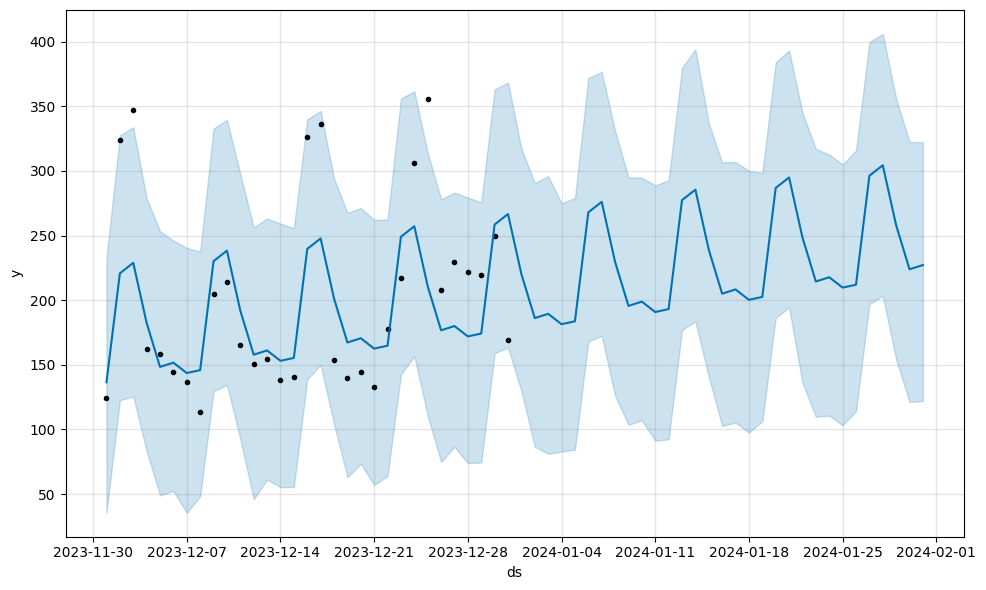

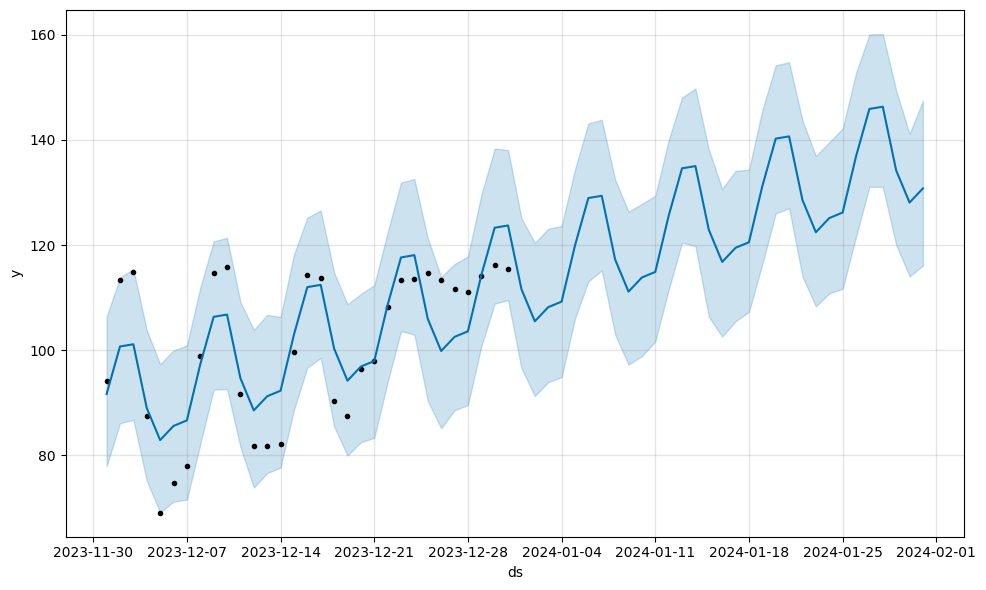

...

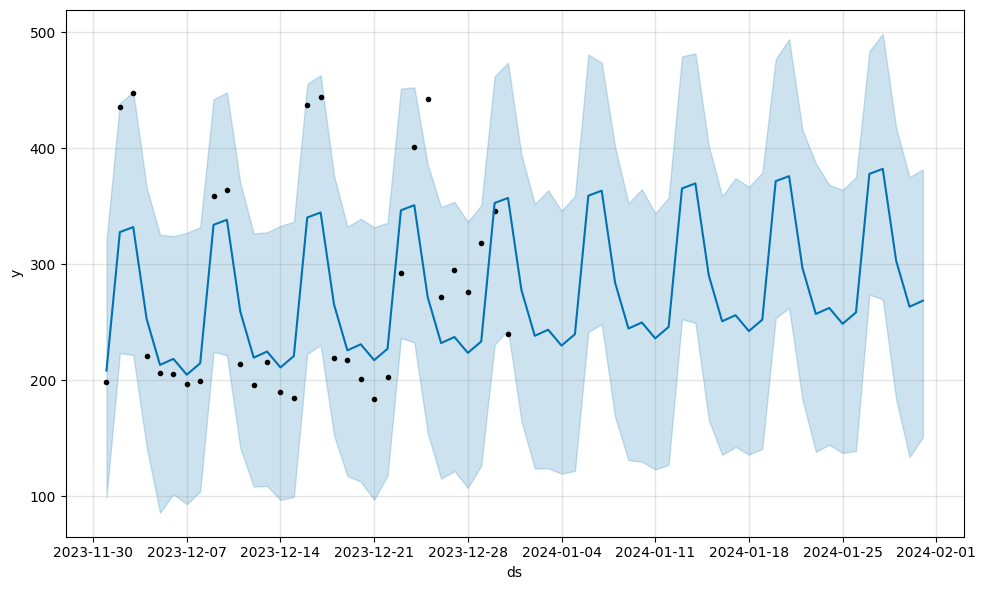

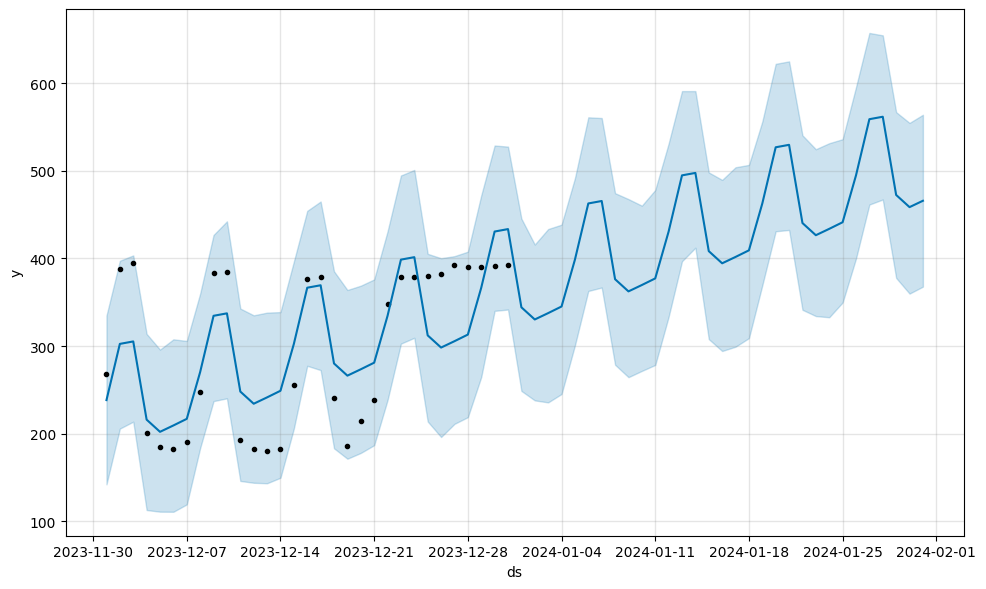

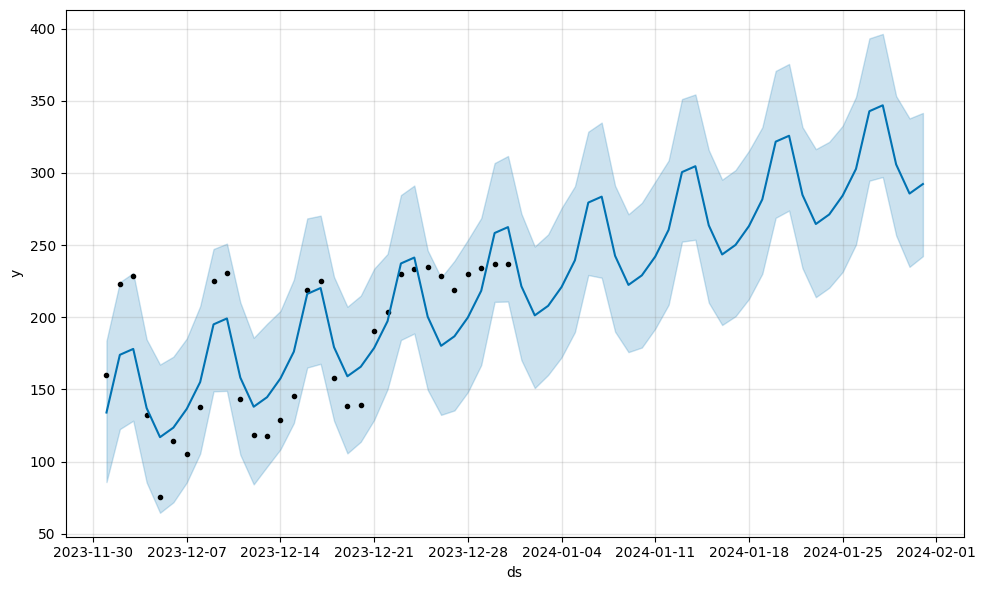

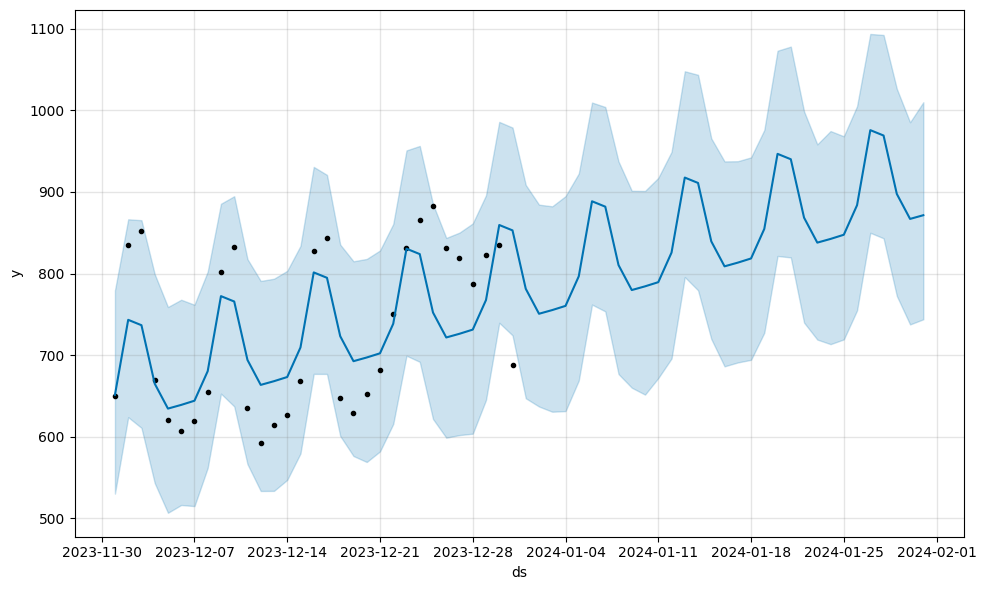

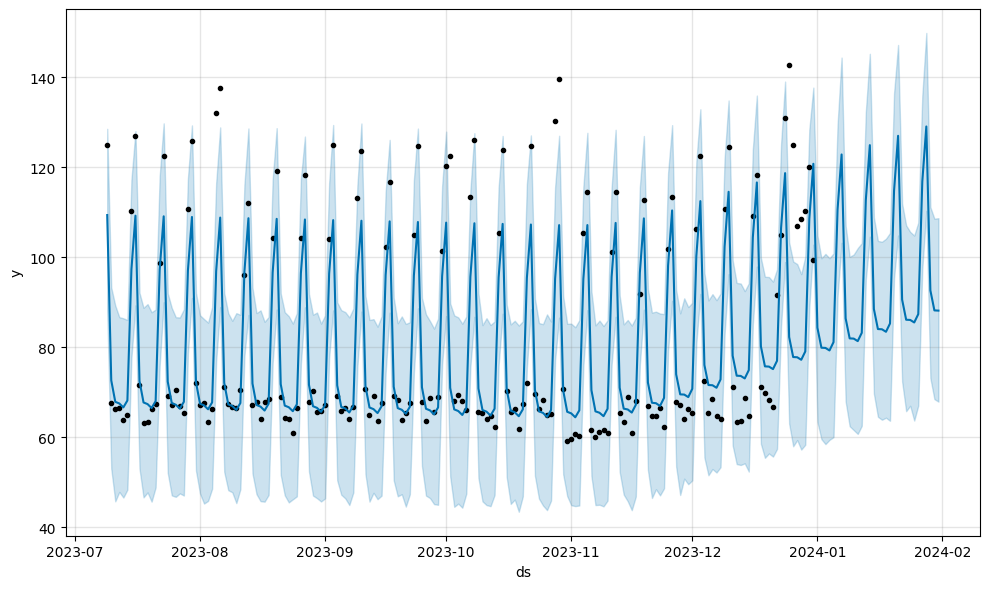

In [52]:
# Creating an empty dataframe
second_target = pd.DataFrame()

# Looping over facilities to perform forecasting
for facility in parking_lots.groups:
    group = parking_lots.get_group(facility)
    
    # Instantiate the model
    prophet_model = prophet.Prophet(interval_width=0.95, daily_seasonality= False)
    
    #Adding regressors to the model
    for col in dummies_df.columns:
        prophet_model.add_regressor(col)
    
    # Fit the model to the data
    prophet_model.fit(group)
    
    # Create a future DataFrame with regressors
    future = prophet_model.make_future_dataframe(periods=31)
    
    for col in dummies_df.columns:
        future[col] = dummies_df[col]
    
    # Generate forecasts
    forecast = prophet_model.predict(future)
    final_data
    # Plot the forecast
    prophet_model.plot(forecast)
    
    # Rename columns in the forecast DataFrame
    forecast = forecast.rename(columns={"yhat": f"yhat_{facility}", "ds": "ds_forecast"})
    
    # Drop unnecessary columns before merging
    forecast = forecast[["ds_forecast", f"yhat_{facility}"]]
    
    # Merge with updated column names
    second_target = pd.merge(second_target, forecast.set_index("ds_forecast"), how="outer", left_index=True, right_index=True)


Plotting actual versus predicted

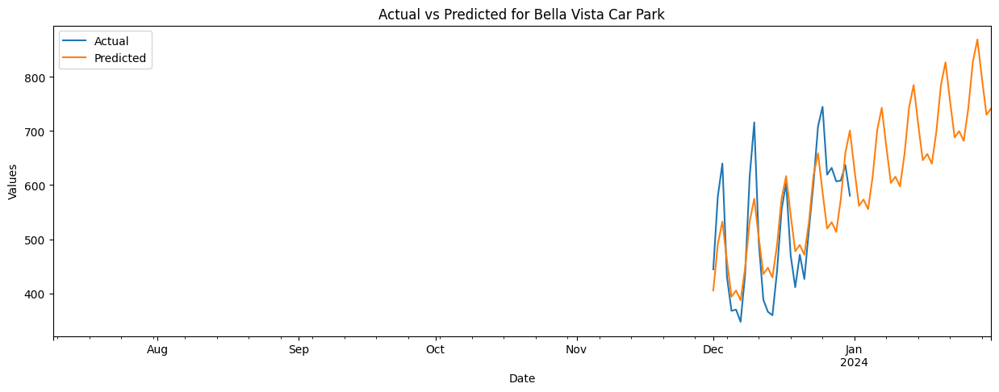

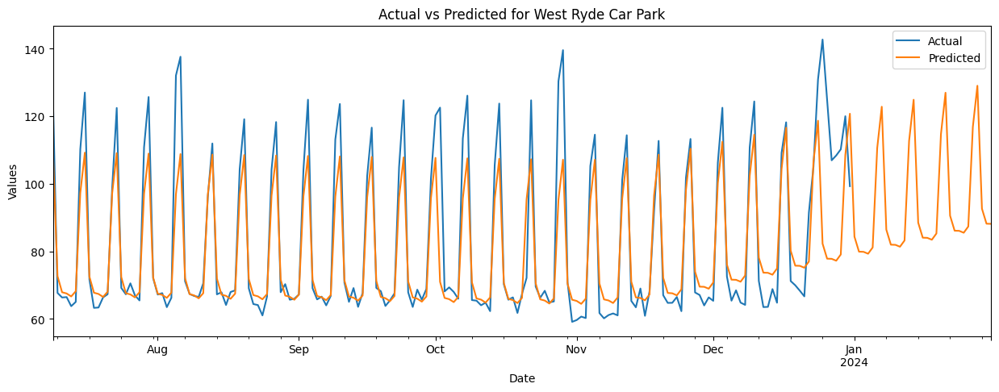

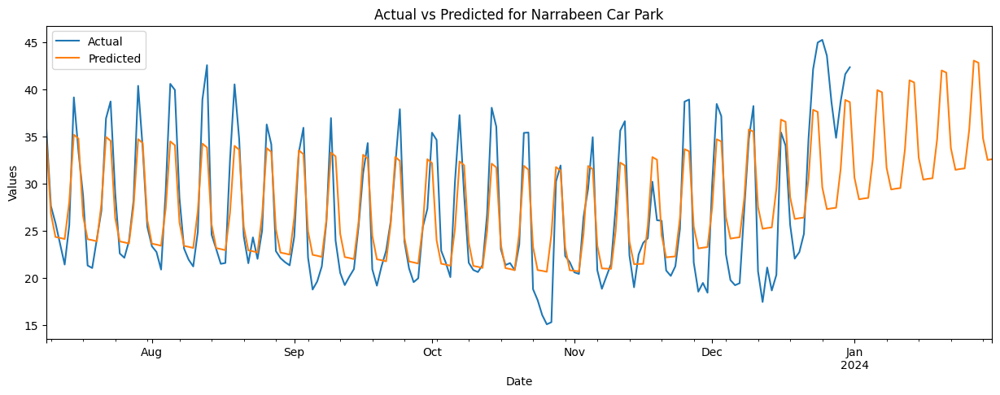

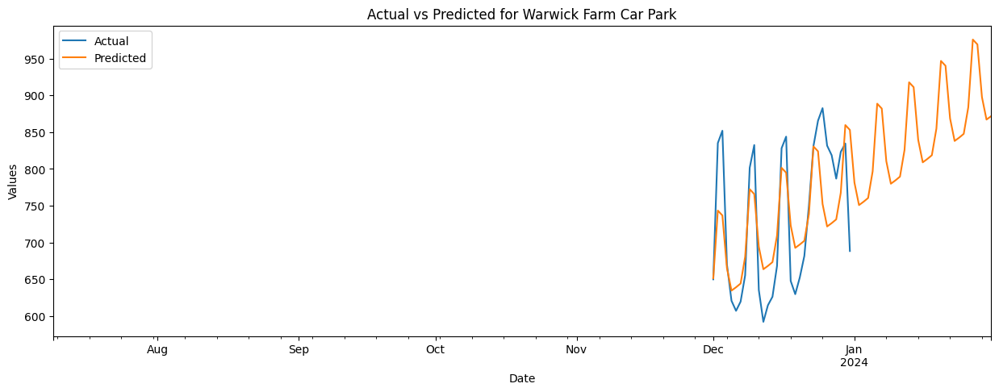

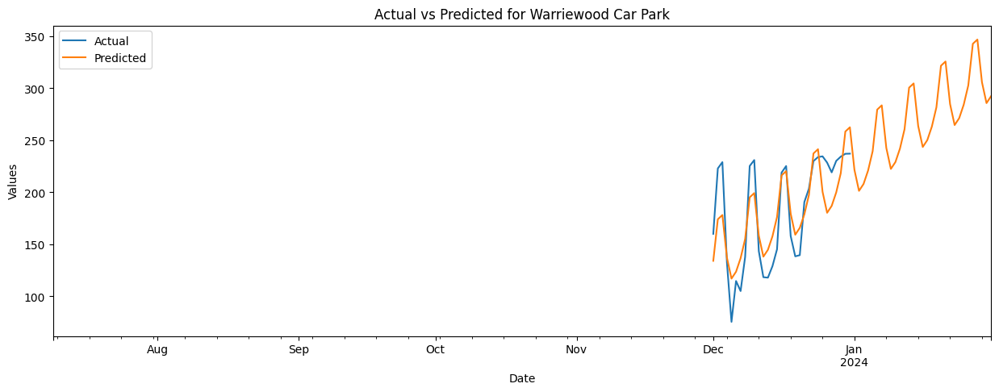

...

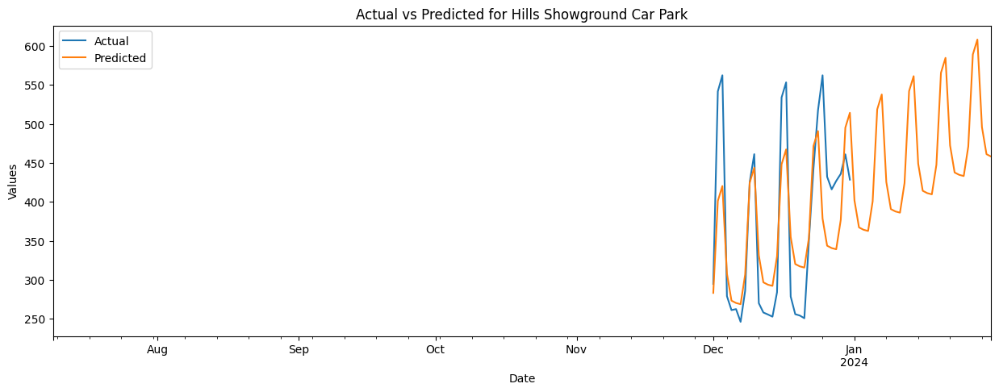

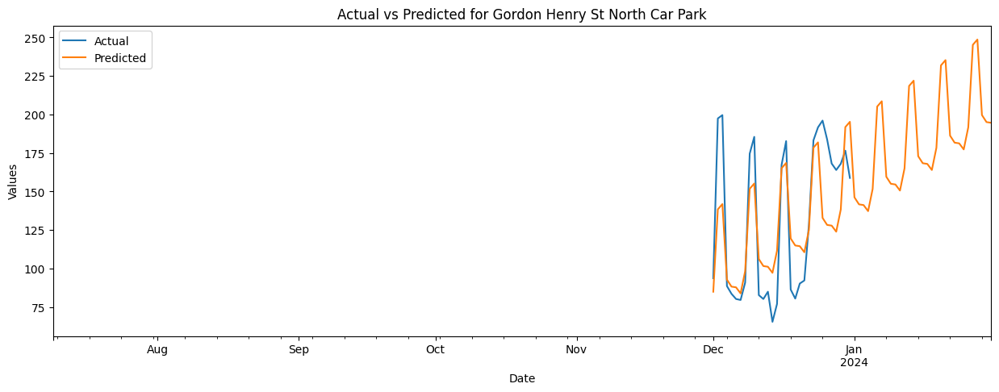

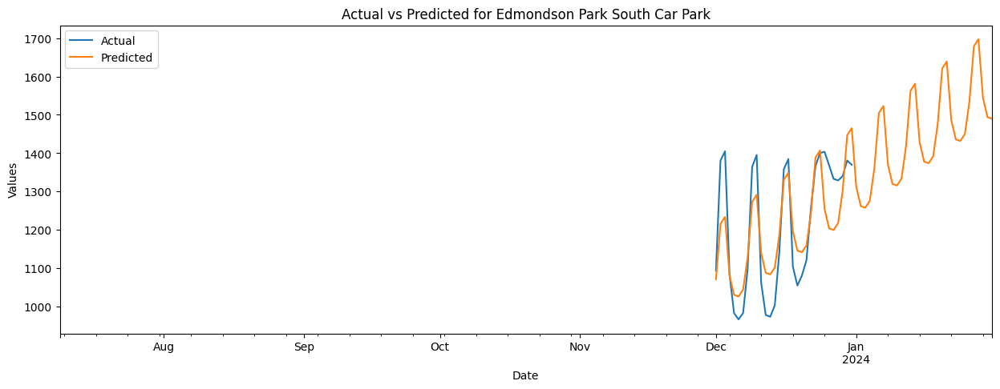

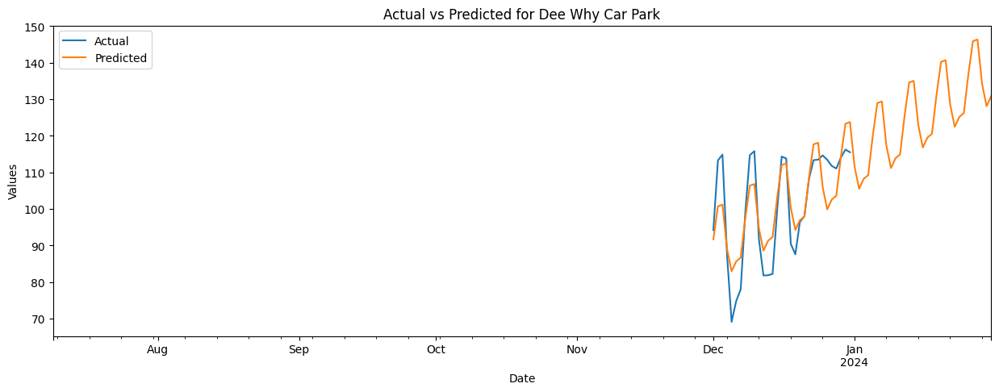

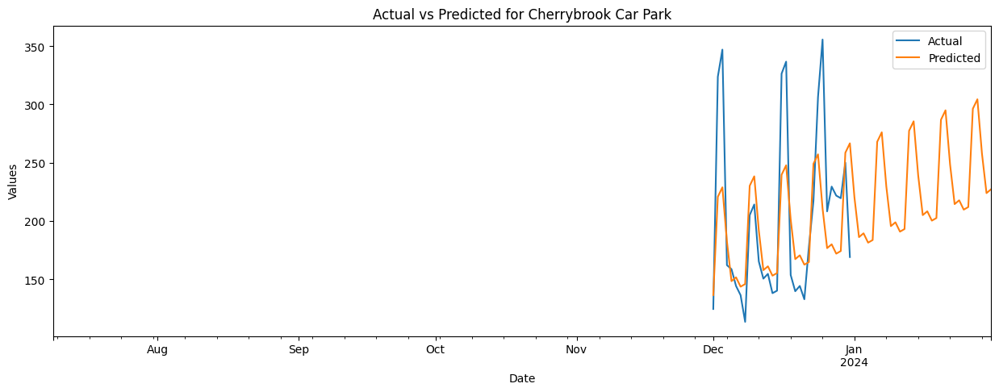

In [53]:
#facilities names
facility_names = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park",
                    "Warwick Farm Car Park", "Warriewood Car Park","Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park"]

# Loop through facility names
for facility in facility_names:
    # Get actual data for the facility from the original dataset
    actual_data = final_data.set_index("ds").query(f"facility_name == '{facility}'")["y"]

    # Get predicted data for the facility from the target DataFrame
    predicted_data = second_target[f"yhat_{facility}"]

    # Concatenate actual and predicted data
    combined_data = pd.concat([actual_data, predicted_data], axis=1)

    # Plot the actual vs predicted data 
    fig, ax = plt.subplots(figsize=(15, 5))
    combined_data.plot(ax=ax, title=f"Actual vs Predicted for {facility}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Values")
    ax.legend(["Actual", "Predicted"])

Evaluating the model using metrics

In [54]:
# mse = mean_squared_error(final_data['y'], forecast["yhat"][-len(actual_data):])
# rmse = np.sqrt(mse)
# mae = mean_absolute_error()

## LSTM

In [55]:
#variables
sequence_length = 5
features = 5
epochs = 15
batch_size = 32
# to scale
columns_to_scale = ['total_parking_spots', 'occupancy_total', 'y']
#Extract columns to scale
to_scale = final_data[columns_to_scale]
#MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
# Fit and transform 
scaled_data = scaler.fit_transform(to_scale)
# Create a DataFrame 
scaled_df = pd.DataFrame(scaled_data, columns=columns_to_scale)
# Add scaled columns back to the original DataFrame
final_data[columns_to_scale] = scaled_df

# Display the result
final_data.head()

,facility_name,ds,total_parking_spots,occupancy_total,y,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,Bella Vista Car Park,2023-12-01,0.399023,0.412126,0.231078,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Bella Vista Car Park,2023-12-02,0.399023,0.244744,0.303513,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,Bella Vista Car Park,2023-12-03,0.399023,0.169423,0.336109,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Bella Vista Car Park,2023-12-04,0.399023,0.429087,0.223738,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,Bella Vista Car Park,2023-12-05,0.399023,0.507172,0.189946,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Now our data is ready for Neural Networks training. First we are going to set the datetime as the index.


In [56]:
#setting ds as index
final_data.set_index("ds", inplace= True)

In [57]:
final_data

,facility_name,total_parking_spots,occupancy_total,y,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
ds,,,,,,,,,,,
2023-12-01,Bella Vista Car Park,0.399023,0.412126,0.231078,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-02,Bella Vista Car Park,0.399023,0.244744,0.303513,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2023-12-03,Bella Vista Car Park,0.399023,0.169423,0.336109,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2023-12-04,Bella Vista Car Park,0.399023,0.429087,0.223738,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2023-12-05,Bella Vista Car Park,0.399023,0.507172,0.189946,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,West Ryde Car Park,0.059175,0.054011,0.050119,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2023-12-28,West Ryde Car Park,0.059175,0.052232,0.050889,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2023-12-29,West Ryde Car Park,0.059175,0.049958,0.051873,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### XGBOOST for Time Series
XGBoost for time series involves transforming time-related features and historical observations into a structured input for the model. Incorporating relevant temporal information can enhance its ability to capture patterns, trends, and seasonality, improving forecasting accuracy. Experimentation with feature engineering and model parameters is crucial for optimizing performance in time series applications.

In [59]:
#our initial dataframe
modelling_data.head()

,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
timestamp,,,,,,,
2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992


Since XGBOOST enjoys working with incorporated relevant temporal features, we are going to feature engineer our `timestamp`  column by creating new columns that capture the day of the week the hour of the day and minute

In [60]:
#resetting index
xgboost_data = modelling_data.reset_index()
#inspecting the df
xgboost_data.head()

,timestamp,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992


In [61]:
#confirming timestamp dtype
print(xgboost_data["timestamp"].dtype)

datetime64[ns]


In [62]:
#feature engineering timestamp
xgboost_data["year"] = xgboost_data["timestamp"].dt.year
xgboost_data["month"] = xgboost_data["timestamp"].dt.month
xgboost_data["hour"] = xgboost_data["timestamp"].dt.hour
xgboost_data["minute"] = xgboost_data["timestamp"].dt.minute
#inspecting df
xgboost_data.head()

,timestamp,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score,year,month,hour,minute
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373,2023,12,0,9
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913,2023,12,0,12
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453,2023,12,0,13
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992,2023,12,0,17
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992,2023,12,0,27


In [63]:
vanilla_data =  xgboost_data.drop(["day_of_week", "time_category", "z_score"], axis= 1)
vanilla_data = vanilla_data.set_index("timestamp")


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 599285 entries, 2023-12-01 00:09:20 to 2023-12-31 23:59:17
Data columns (total 8 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   facility_name         599285 non-null  object
 1   total_parking_spots   599285 non-null  int64 
 2   occupancy_total       599285 non-null  int64 
 3   parking_availability  599285 non-null  int64 
 4   year                  599285 non-null  int32 
 5   month                 599285 non-null  int32 
 6   hour                  599285 non-null  int32 
 7   minute                599285 non-null  int32 
dtypes: int32(4), int64(3), object(1)
memory usage: 32.0+ MB


In [64]:
xg_dummies = pd.get_dummies(xgboost_data[['day_of_week', 'time_category']],
                            columns=["day_of_week", "time_category"], prefix= ["day_of_the_week", "time_period"],
                            sparse= False, drop_first= True)
#converting dummies to numerical
xg_dummies = xg_dummies.astype(int)
#joining the dummies and original df
xg_encoded = pd.concat( [xgboost_data, xg_dummies] ,axis=1)
#dropping cat columns
xg_encode = xg_encoded.drop(["time_category", "day_of_week", "z_score"], axis= 1)
xg_encoded = xg_encoded.set_index("timestamp")

Mean Squared Error for Bella Vista Car Park: 0.8017233281169308
Root Mean Squared Error for Bella Vista Car Park: 0.8953900424490607
Mean Absolute Error for Bella Vista Car Park: 0.6950080720411888


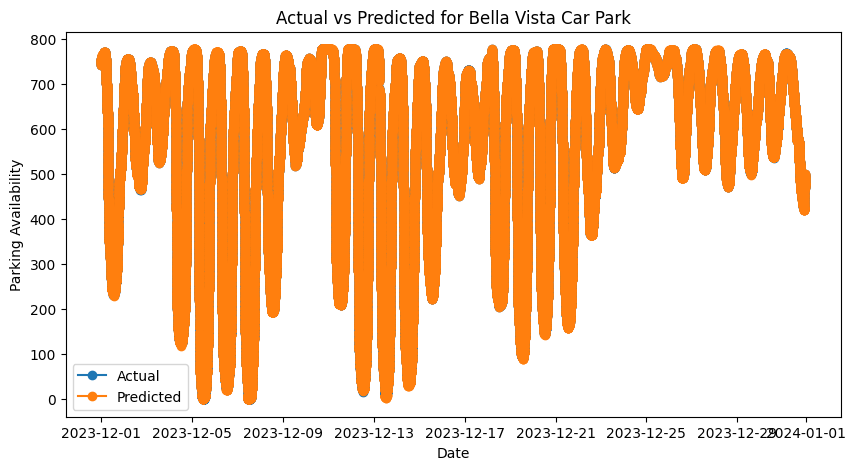

Mean Squared Error for Campbelltown Farrow Rd North Car Park: 8.773004197215277e-09
Root Mean Squared Error for Campbelltown Farrow Rd North Car Park: 9.366431656300747e-05
Mean Absolute Error for Campbelltown Farrow Rd North Car Park: 5.301955544854016e-05


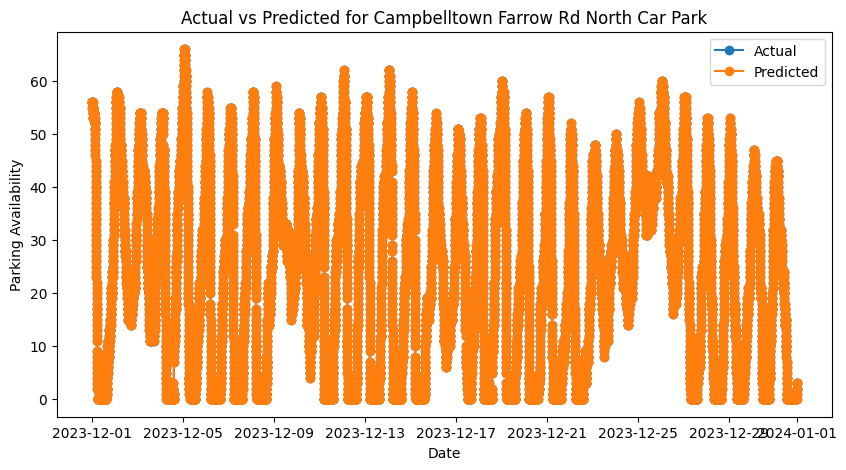

Mean Squared Error for Campbelltown Hurley Street South Car Park: 7.871259312502774e-08
Root Mean Squared Error for Campbelltown Hurley Street South Car Park: 0.00028055764670567747
Mean Absolute Error for Campbelltown Hurley Street South Car Park: 0.00018815494734341297


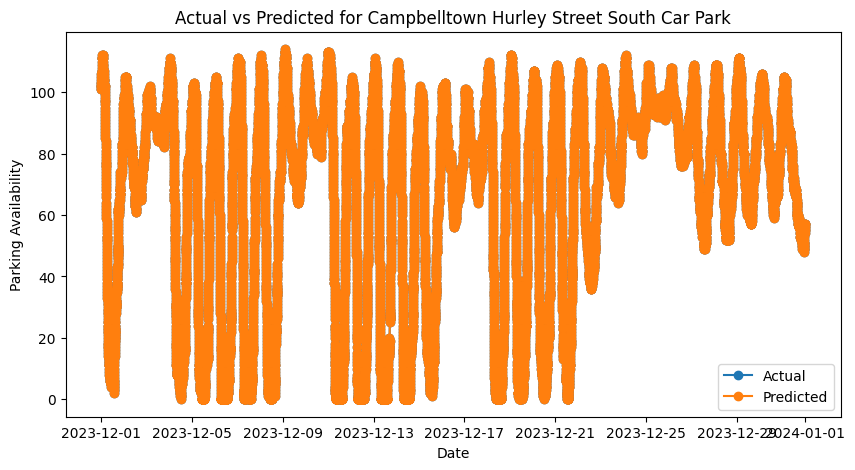

Mean Squared Error for Cherrybrook Car Park: 0.13770781835280638
Root Mean Squared Error for Cherrybrook Car Park: 0.3710900407620856
Mean Absolute Error for Cherrybrook Car Park: 0.2824799842709479


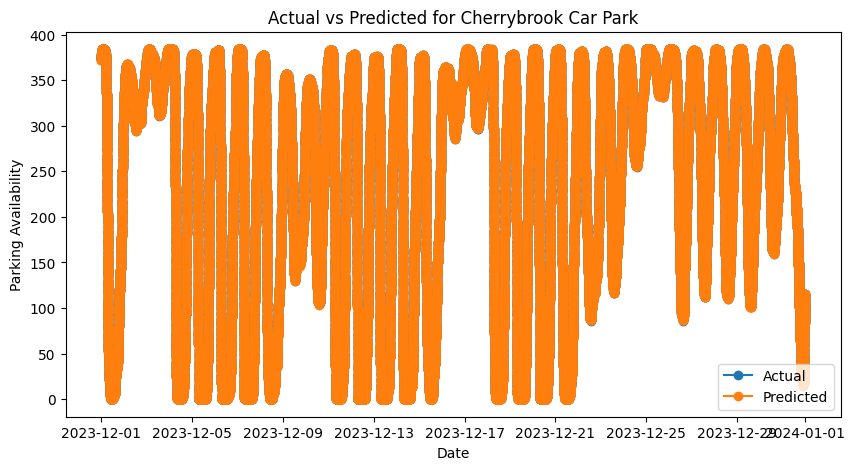

Mean Squared Error for Dee Why Car Park: 1.2870218575018724e-07
Root Mean Squared Error for Dee Why Car Park: 0.00035875086864032435
Mean Absolute Error for Dee Why Car Park: 0.00014099372411917696


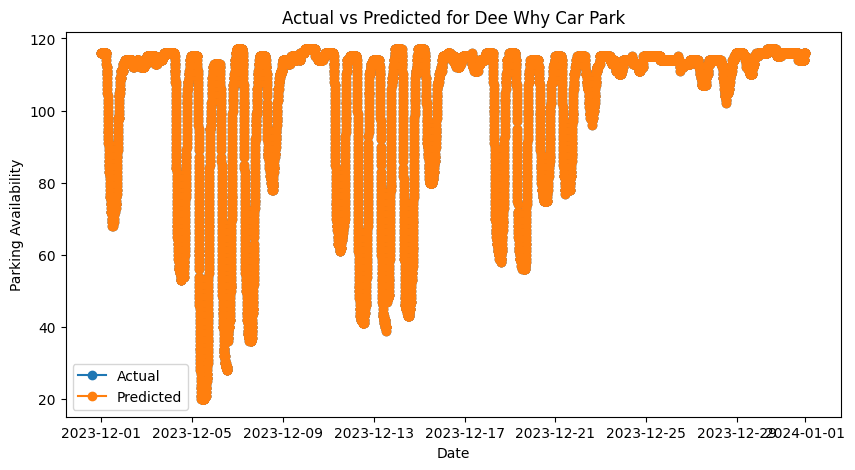

Mean Squared Error for Edmondson Park South Car Park: 0.9615439237011026
Root Mean Squared Error for Edmondson Park South Car Park: 0.9805834608543541
Mean Absolute Error for Edmondson Park South Car Park: 0.7461376458133223


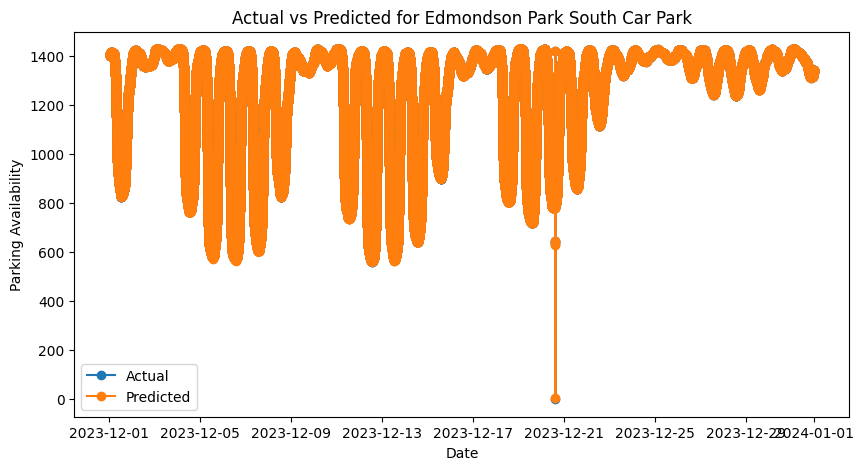

Mean Squared Error for Gordon Henry St North Car Park: 0.00041282334917543714
Root Mean Squared Error for Gordon Henry St North Car Park: 0.020318054758648455
Mean Absolute Error for Gordon Henry St North Car Park: 0.01490926714249583


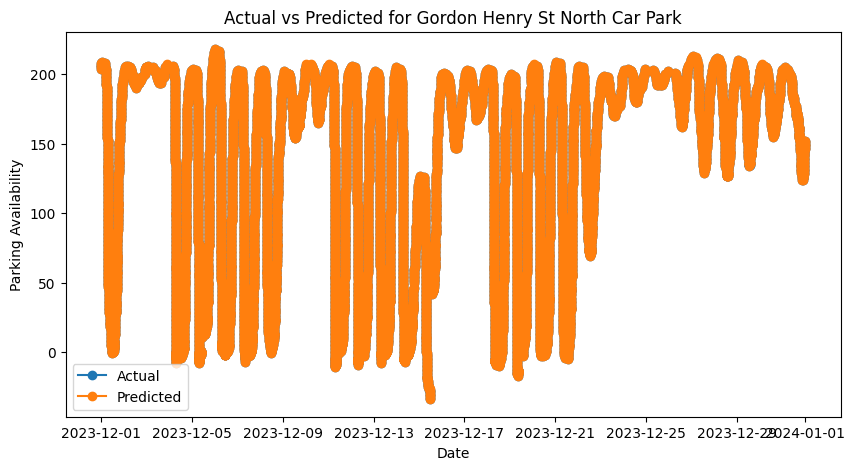

Mean Squared Error for Gosford Car Park: 1.0629261925435187
Root Mean Squared Error for Gosford Car Park: 1.030983119427044
Mean Absolute Error for Gosford Car Park: 0.824299960493915


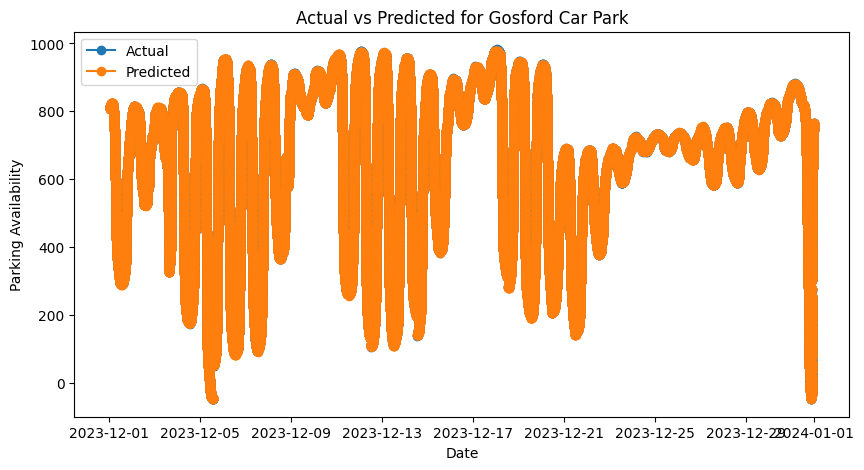

Mean Squared Error for Hills Showground Car Park: 0.41470050041945455
Root Mean Squared Error for Hills Showground Car Park: 0.643972437624045
Mean Absolute Error for Hills Showground Car Park: 0.5067349482358747


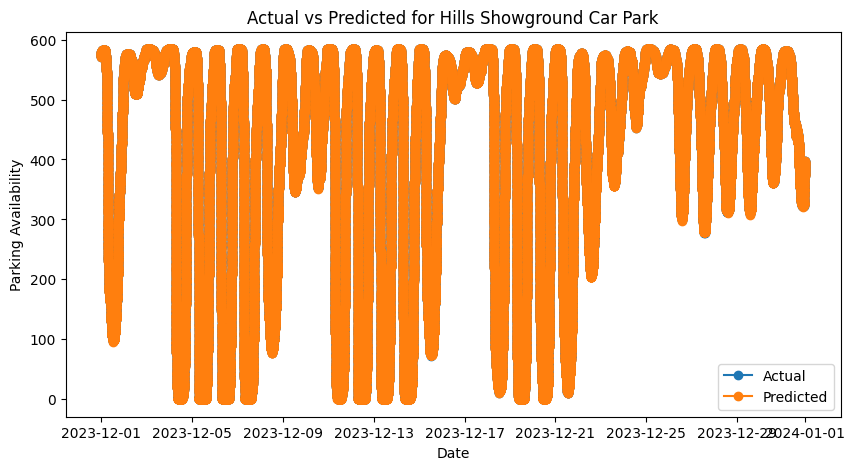

Mean Squared Error for Hornsby Jersey St Car Park: 1.0781471304806382e-06
Root Mean Squared Error for Hornsby Jersey St Car Park: 0.0010383386395972358
Mean Absolute Error for Hornsby Jersey St Car Park: 0.0007160092847347271


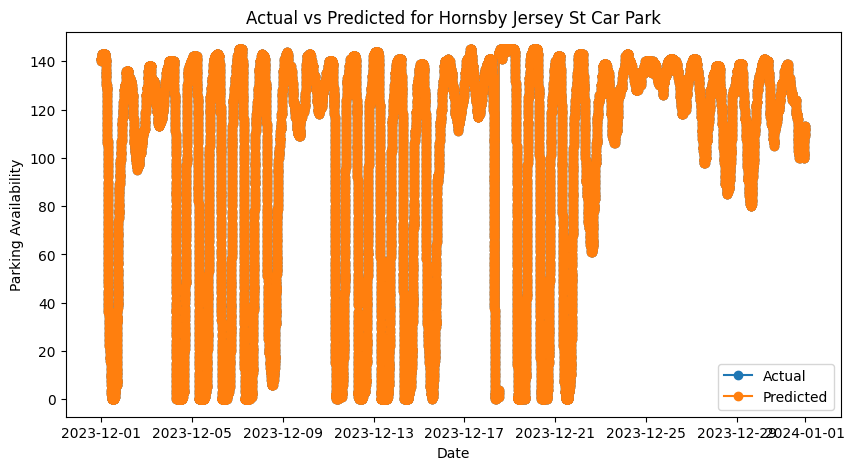

Mean Squared Error for Kellyville North Car Park: 0.13665957900305087
Root Mean Squared Error for Kellyville North Car Park: 0.36967496399276334
Mean Absolute Error for Kellyville North Car Park: 0.22728512309684168


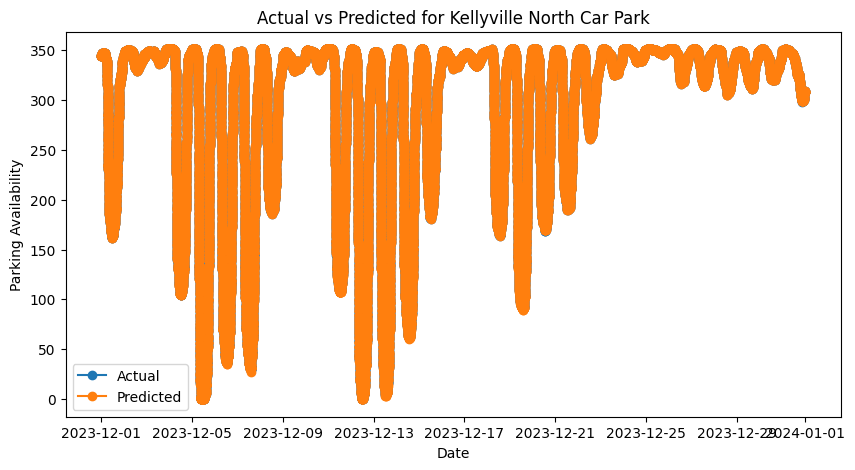

Mean Squared Error for Kellyville South Car Park: 1.218517077379677
Root Mean Squared Error for Kellyville South Car Park: 1.1038646100766512
Mean Absolute Error for Kellyville South Car Park: 0.8709515271555941


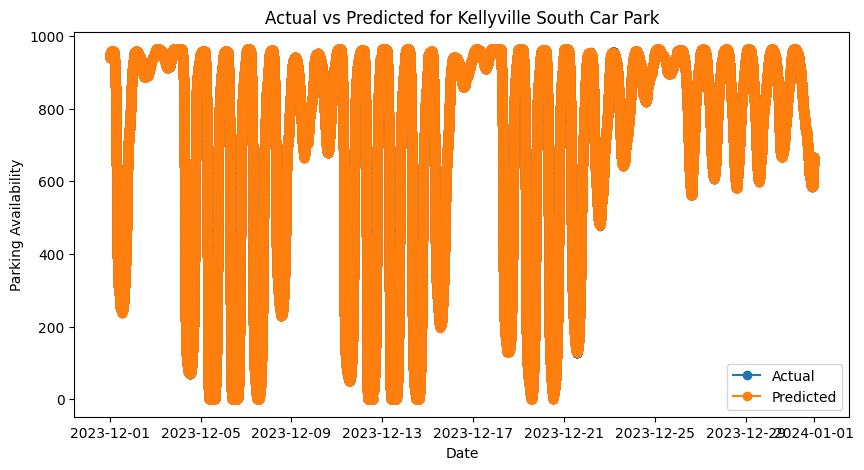

Mean Squared Error for Kiama Car Park: 1.833118043250439e-07
Root Mean Squared Error for Kiama Car Park: 0.0004281492780853938
Mean Absolute Error for Kiama Car Park: 0.00024479732962233533


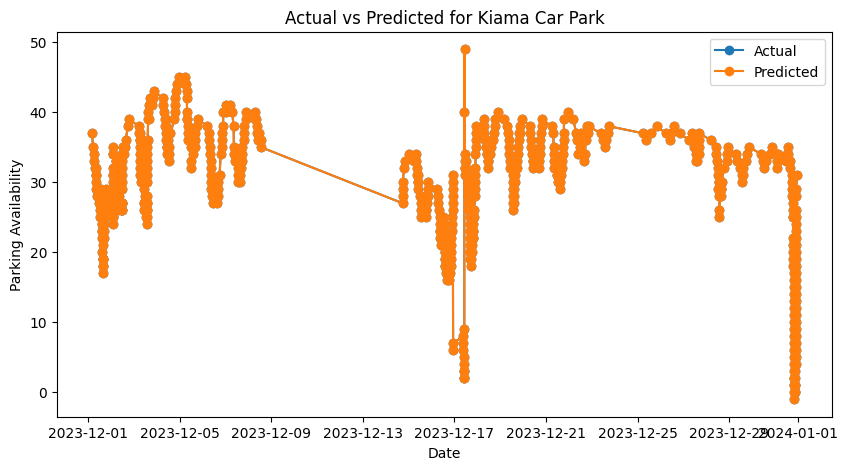

Mean Squared Error for Leppington Car Park: 2.1205200250168446
Root Mean Squared Error for Leppington Car Park: 1.4562005442303765
Mean Absolute Error for Leppington Car Park: 1.1578250472800151


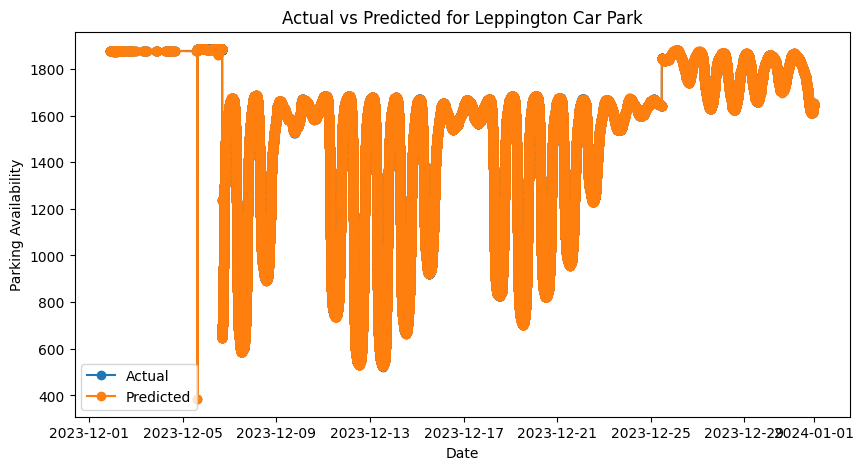

Mean Squared Error for Mona Vale Car Park: 3.281824436817325e-08
Root Mean Squared Error for Mona Vale Car Park: 0.00018115806459601308
Mean Absolute Error for Mona Vale Car Park: 0.0001325291272480805


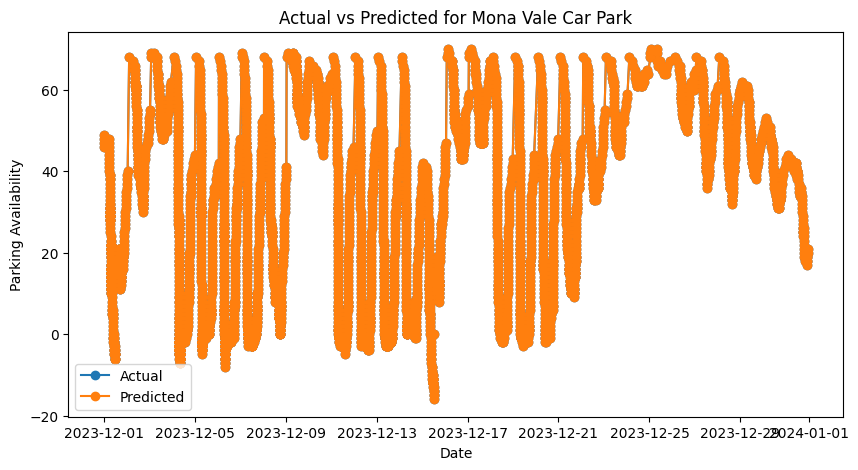

Mean Squared Error for Narrabeen Car Park: 3.551279810509899e-11
Root Mean Squared Error for Narrabeen Car Park: 5.95926154024968e-06
Mean Absolute Error for Narrabeen Car Park: 4.3204385155615644e-06


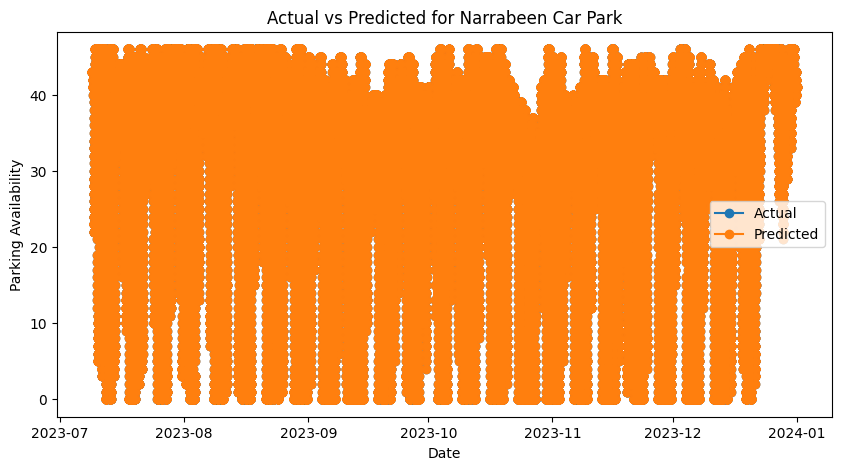

Mean Squared Error for Penrith Combewood At-Grade Car Park: 2.0911484654651852e-07
Root Mean Squared Error for Penrith Combewood At-Grade Car Park: 0.00045729076805301735
Mean Absolute Error for Penrith Combewood At-Grade Car Park: 0.0002427452054374662


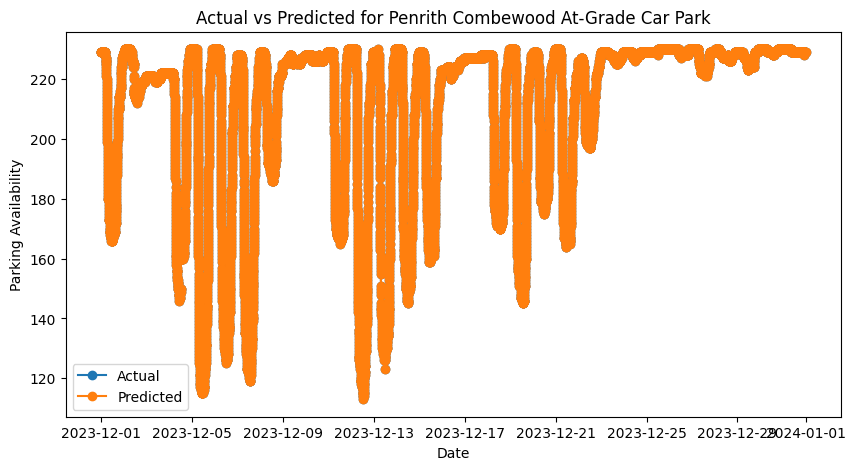

Mean Squared Error for Penrith Combewood Multi-Level Car Park: 0.6817176601492785
Root Mean Squared Error for Penrith Combewood Multi-Level Car Park: 0.8256619527078128
Mean Absolute Error for Penrith Combewood Multi-Level Car Park: 0.6097201881037227


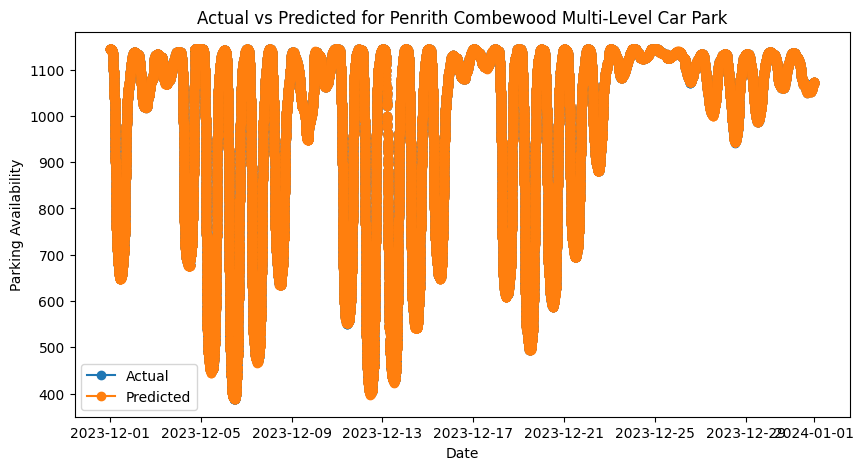

Mean Squared Error for Revesby Car Park: 0.30013368771586946
Root Mean Squared Error for Revesby Car Park: 0.5478445835416003
Mean Absolute Error for Revesby Car Park: 0.4144223827417346


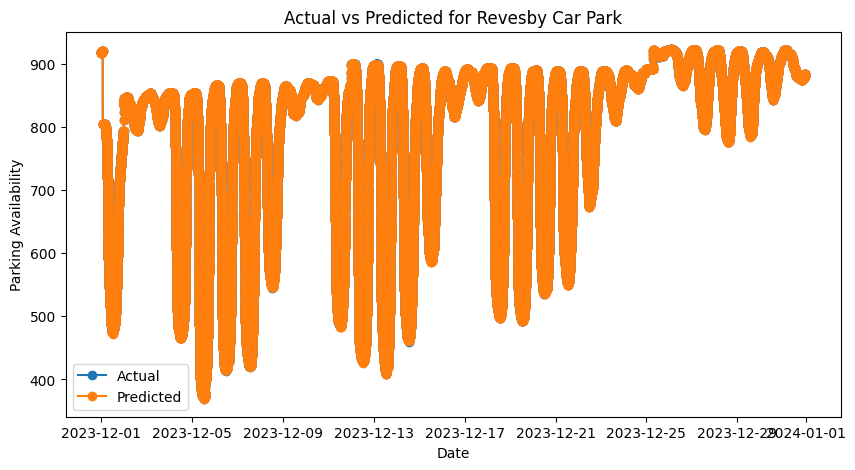

Mean Squared Error for Schofields Car Park: 0.6368478849484344
Root Mean Squared Error for Schofields Car Park: 0.7980274963611431
Mean Absolute Error for Schofields Car Park: 0.560405469932125


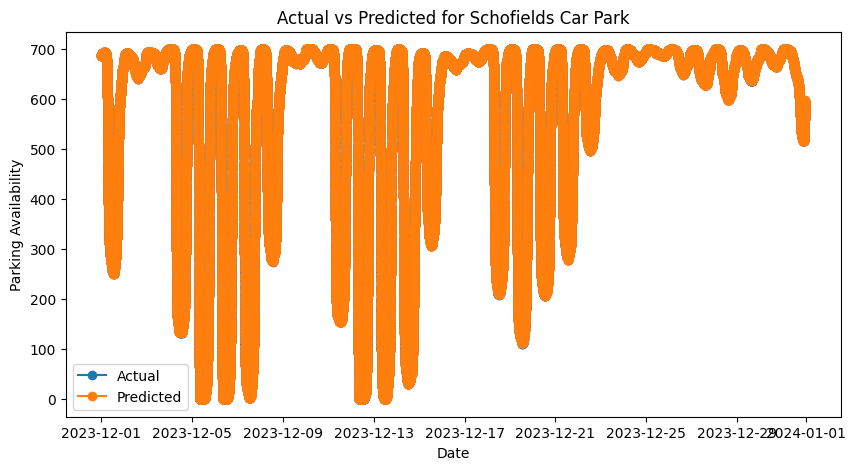

Mean Squared Error for St Marys Car Park: 0.2518736946229383
Root Mean Squared Error for St Marys Car Park: 0.5018701969861712
Mean Absolute Error for St Marys Car Park: 0.36905376714273785


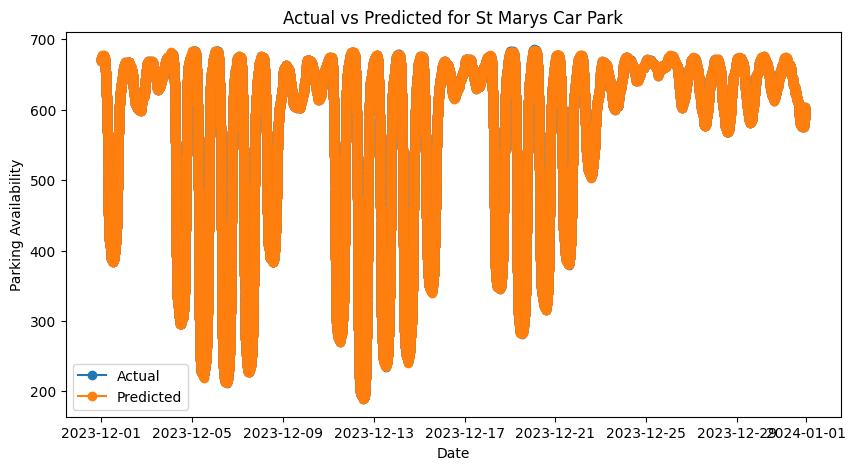

Mean Squared Error for Sutherland East Parade Car Park: 0.14773334445731687
Root Mean Squared Error for Sutherland East Parade Car Park: 0.38436095594807346
Mean Absolute Error for Sutherland East Parade Car Park: 0.26922584087342144


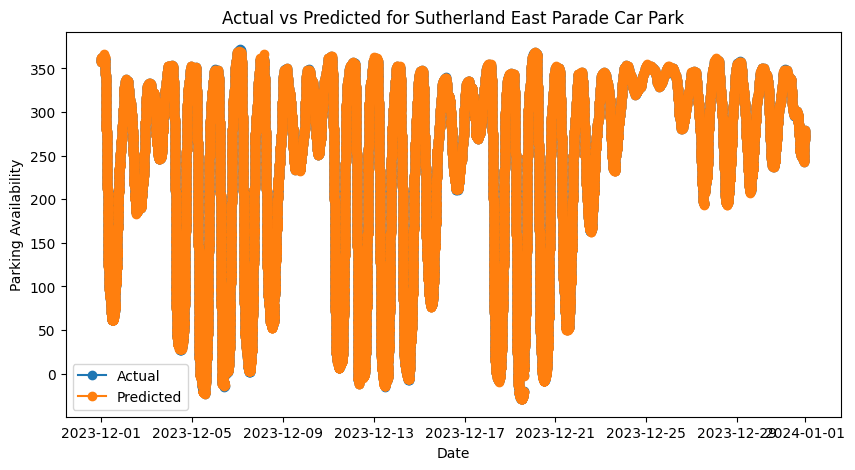

Mean Squared Error for Tallawong P1 Car Park: 4.2007409764994234e-08
Root Mean Squared Error for Tallawong P1 Car Park: 0.00020495709249741576
Mean Absolute Error for Tallawong P1 Car Park: 0.000144051177030416


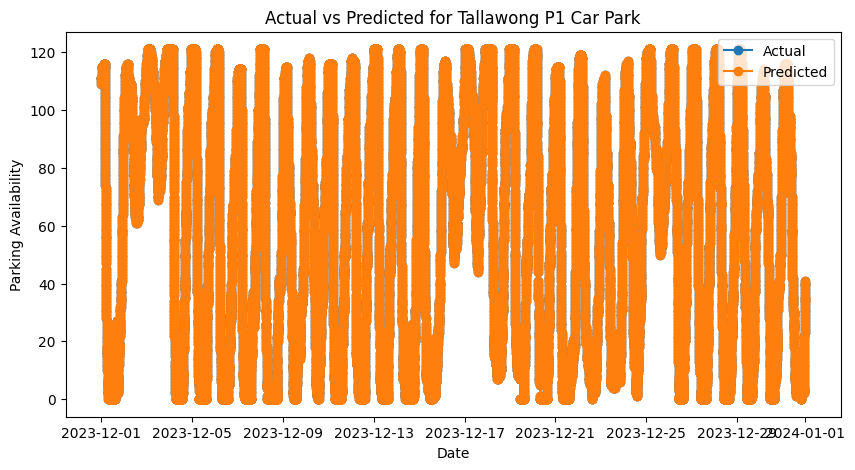

Mean Squared Error for Tallawong P2 Car Park: 0.2205997255347865
Root Mean Squared Error for Tallawong P2 Car Park: 0.4696804504498633
Mean Absolute Error for Tallawong P2 Car Park: 0.37318903364242545


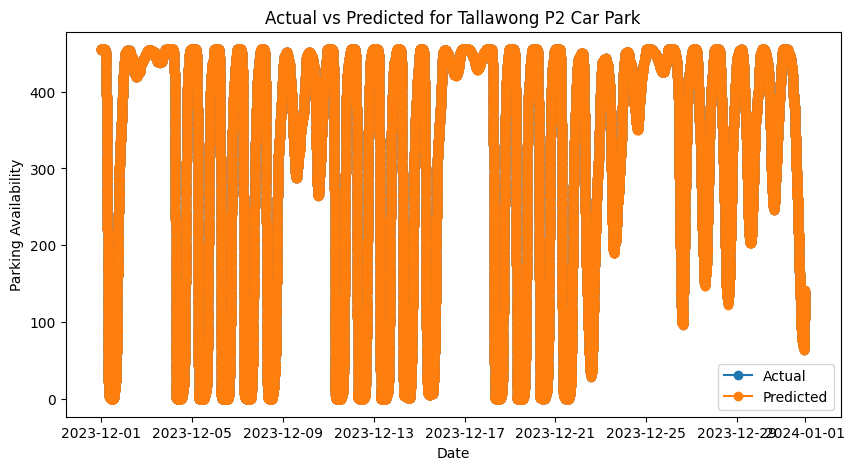

Mean Squared Error for Tallawong P3 Car Park: 0.17337407395503604
Root Mean Squared Error for Tallawong P3 Car Park: 0.4163821249225716
Mean Absolute Error for Tallawong P3 Car Park: 0.31726246076447134


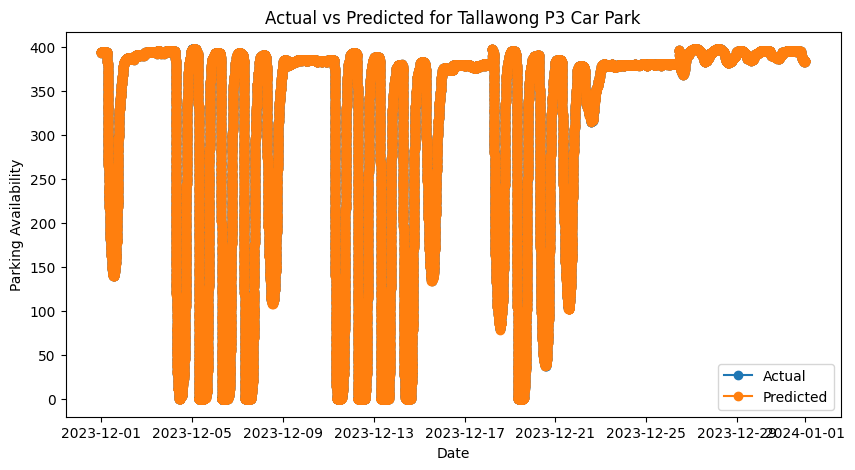

Mean Squared Error for Warriewood Car Park: 0.023972919600095993
Root Mean Squared Error for Warriewood Car Park: 0.15483190756461018
Mean Absolute Error for Warriewood Car Park: 0.06388608210913989


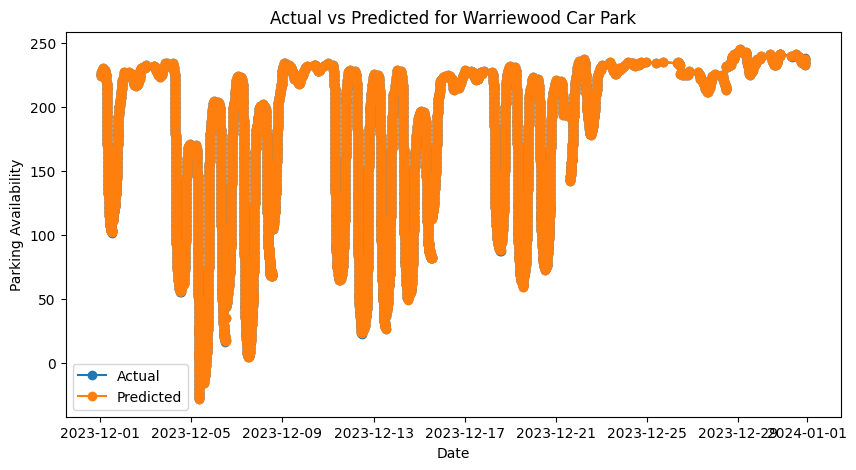

Mean Squared Error for Warwick Farm Car Park: 0.3297295979415849
Root Mean Squared Error for Warwick Farm Car Park: 0.57422086163913
Mean Absolute Error for Warwick Farm Car Park: 0.44997401678032356


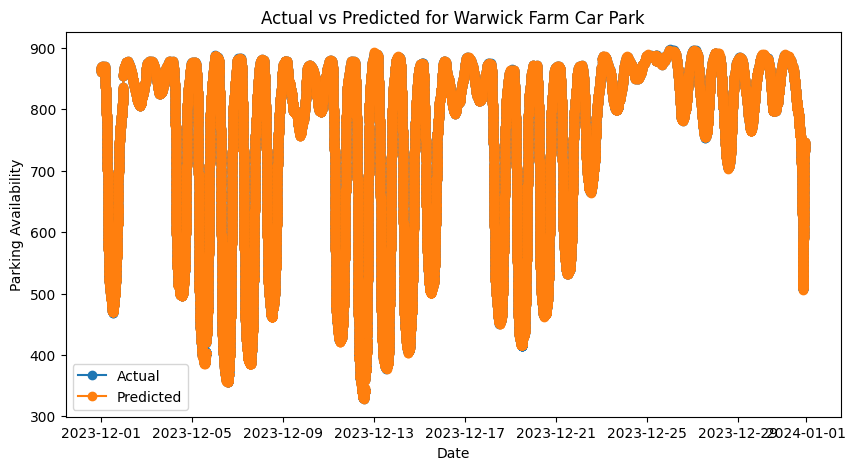

Mean Squared Error for West Ryde Car Park: 1.7946348311400227e-08
Root Mean Squared Error for West Ryde Car Park: 0.00013396398139574767
Mean Absolute Error for West Ryde Car Park: 9.849439603403362e-05


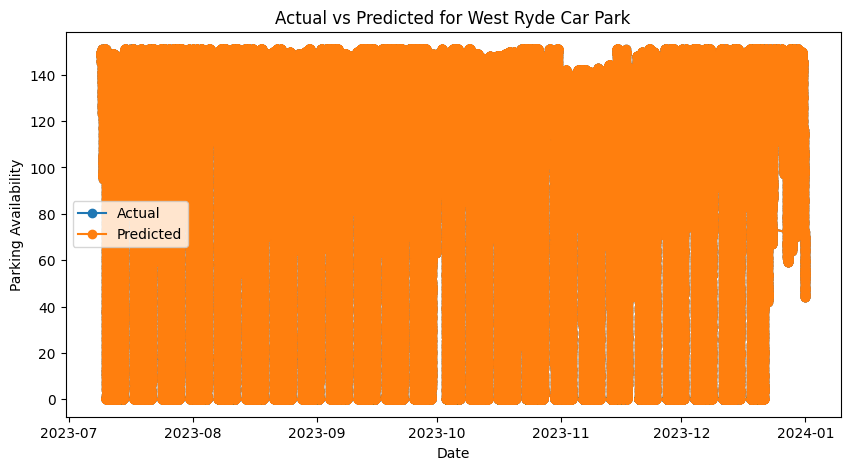

In [71]:
vanilla_data =  xgboost_data.drop(["day_of_week", "time_category", "z_score"], axis= 1)
vanilla_data = vanilla_data.set_index("timestamp")

xg_grouped = vanilla_data.groupby("facility_name")

import xgboost as xgb
from datetime import timedelta

# Dictionary to store XGBoost models for each parking lot
xg_models = {}

# Train a model for each parking lot
for facility_name, group_data in xg_grouped:
    # Split the data into features and target variable
    X = group_data.drop(columns=["parking_availability", "facility_name"], axis=1)
    y = group_data["parking_availability"]

    # Create an XGBoost model
    xg_model = xgb.XGBRegressor(objective='reg:squarederror')

    # Train the model
    xg_model.fit(X, y)

    # Make predictions on the entire dataset
    group_data["prediction"] = xg_model.predict(X)

    # Evaluate the model
    mse = mean_squared_error(y, group_data["prediction"])
    rmse = sqrt(mse)
    mae = mean_absolute_error(y,group_data["prediction"])
    print(f'Mean Squared Error for {facility_name}: {mse}')
    print(f'Root Mean Squared Error for {facility_name}: {rmse}')
    print(f'Mean Absolute Error for {facility_name}: {mae}')
    # Store the trained model in the dictionary
    xg_models[facility_name] = xg_model

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 5))
    plt.plot(group_data.index, y, label='Actual', marker='o')
    plt.plot(group_data.index, group_data["prediction"], label='Predicted', marker='o')
    plt.title(f'Actual vs Predicted for {facility_name}')
    plt.xlabel('Date')
    plt.ylabel('Parking Availability')
    plt.legend()
    plt.show()

    
    # #prediction_function
    # def generate_features_for_next_31_days(future_dates):
    #     future_X = pd.DataFrame(index=future_dates)

    #     # Example: Generating random values for demonstration purposes
    #     future_X["total_parking_spots"] = [10, 12, 15, 18, 20, 22, 25, 28, 30, 32, 35, 38, 40, 42, 45, 48, 50, 52, 55, 58, 60, 62, 65, 68, 70, 72, 75, 78, 80, 82, 85]
    #     future_X["occupancy_total"] = [5, 8, 10, 12, 15, 18, 20, 22, 25, 28, 30, 32, 35, 38, 40, 42, 45, 48, 50, 52, 55, 58, 60, 62, 65, 68, 70, 72, 75, 78, 80, 82]
    #     future_X["year"] = [date.year for date in future_dates]
    #     future_X["month"] = [date.month for date in future_dates]
    #     future_X["hour"] = [date.hour for date in future_dates]
    #     future_X["minute"] = [date.minute for date in future_dates]
    #     future_X["day"] = [date.day for date in future_dates]

    #     return future_X

    # # Make predictions for the next 31 days
    
    # future_dates = group_data.index + timedelta(days=31)
    # future_X = generate_features_for_next_31_days(future_dates)  # You need to implement this function
    # future_predictions = xg_model.predict(future_X)

    # # Plot future predictions
    # plt.figure(figsize=(15, 6))
    # plt.plot(future_dates, future_predictions, label='Future Predictions', marker='o')
    # plt.title(f'Future Predictions for {facility_name}')
    # plt.xlabel('Date')
    # plt.ylabel('Parking Availability')
    # plt.legend()
    # plt.show()


Our model is learning too perfectly from the training data such that we cannot see the plot of actual data points because they have been covered by the predicted values.

We will add some few other columns and penalties to see if it will improve

Best Hyperparameters for Bella Vista Car Park: {'alpha': 0.1, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 40}
Mean Squared Error for Bella Vista Car Park: 0.9935310684230438
Root Mean Squared Error for Bella Vista Car Park: 0.99676028633922
Mean Absolute Error for Bella Vista Car Park: 0.7471525436412444


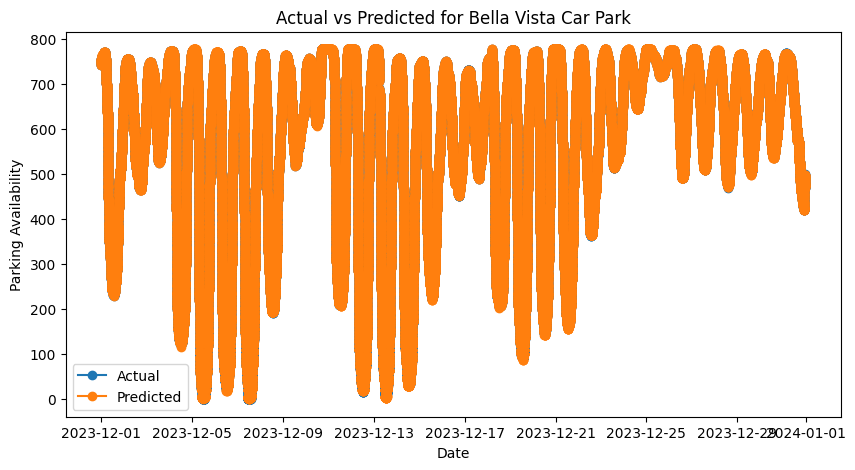

Best Hyperparameters for Campbelltown Farrow Rd North Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Campbelltown Farrow Rd North Car Park: 6.757174144054377e-08
Root Mean Squared Error for Campbelltown Farrow Rd North Car Park: 0.0002599456509360058
Mean Absolute Error for Campbelltown Farrow Rd North Car Park: 0.0002242130613702759


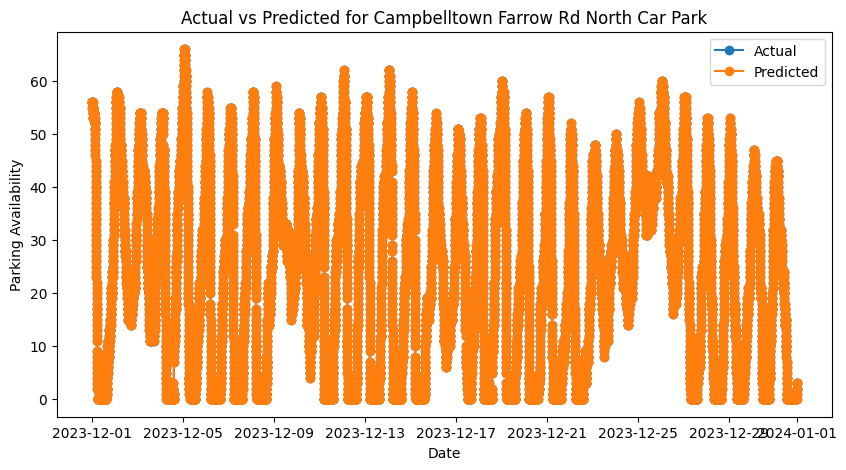

Best Hyperparameters for Campbelltown Hurley Street South Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Campbelltown Hurley Street South Car Park: 2.517579069693559e-07
Root Mean Squared Error for Campbelltown Hurley Street South Car Park: 0.000501754827549627
Mean Absolute Error for Campbelltown Hurley Street South Car Park: 0.00043498482938124757


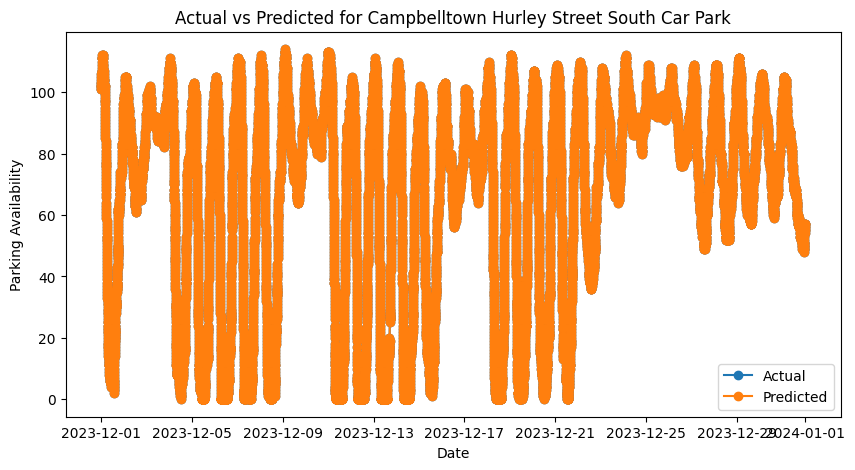

Best Hyperparameters for Cherrybrook Car Park: {'alpha': 0.2, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Cherrybrook Car Park: 0.14398974414461974
Root Mean Squared Error for Cherrybrook Car Park: 0.3794598057036077
Mean Absolute Error for Cherrybrook Car Park: 0.28068296098859685


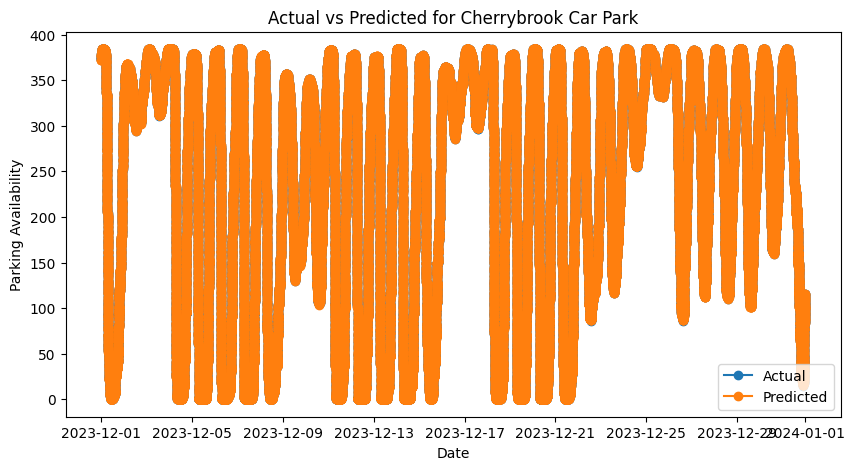

Best Hyperparameters for Dee Why Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Dee Why Car Park: 1.264806554508021e-07
Root Mean Squared Error for Dee Why Car Park: 0.0003556411891932684
Mean Absolute Error for Dee Why Car Park: 0.0002894719767273439


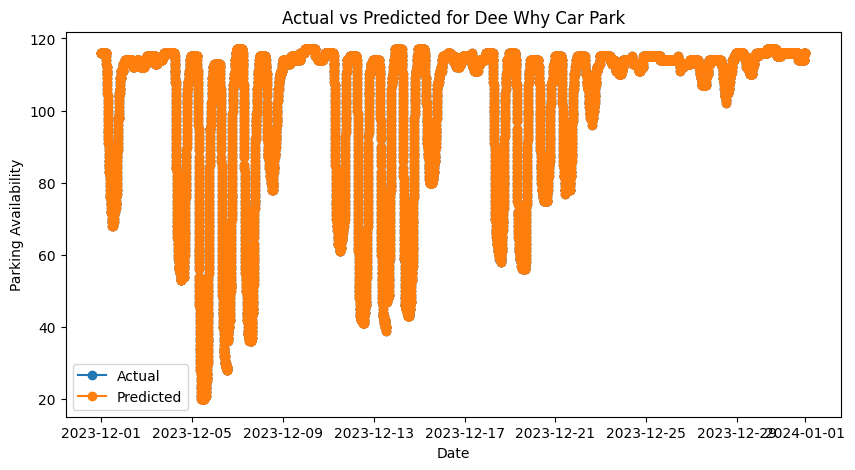

Best Hyperparameters for Edmondson Park South Car Park: {'alpha': 0.2, 'gamma': 0, 'lambda': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
Mean Squared Error for Edmondson Park South Car Park: 13.40285342678196
Root Mean Squared Error for Edmondson Park South Car Park: 3.660990771195956
Mean Absolute Error for Edmondson Park South Car Park: 1.3972030460396097


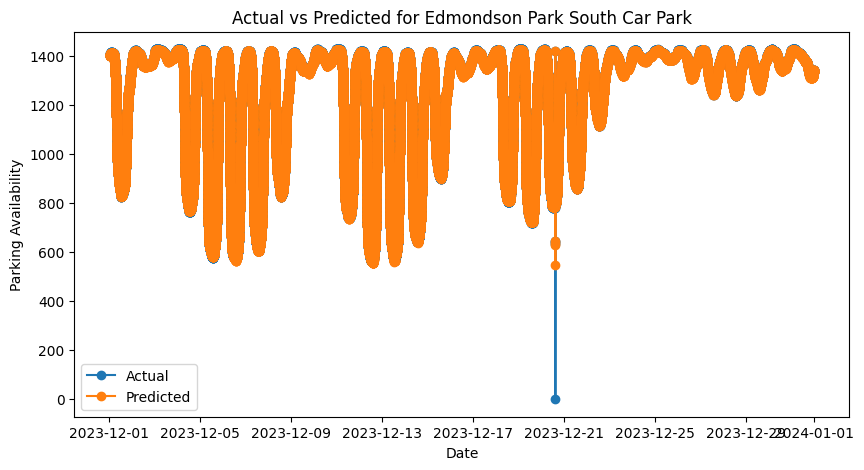

Best Hyperparameters for Gordon Henry St North Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Gordon Henry St North Car Park: 1.6638118969824367e-06
Root Mean Squared Error for Gordon Henry St North Car Park: 0.0012898883273300974
Mean Absolute Error for Gordon Henry St North Car Park: 0.0009106145364326144


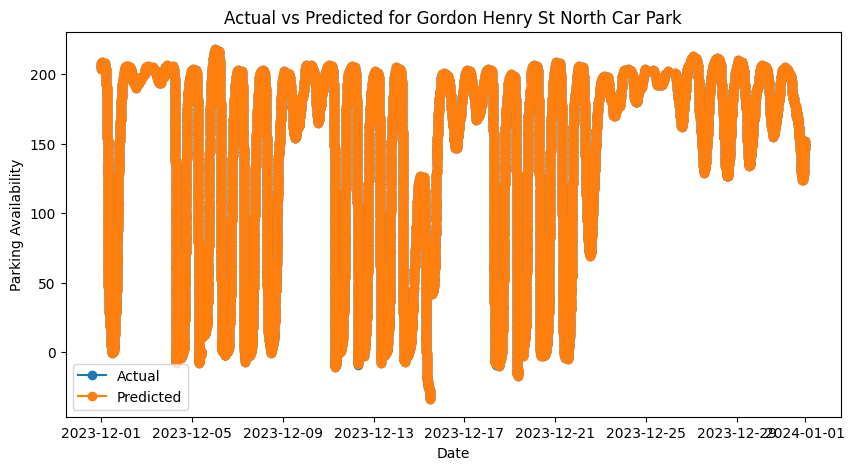

Best Hyperparameters for Gosford Car Park: {'alpha': 0.01, 'gamma': 0.2, 'lambda': 0.1, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 40}
Mean Squared Error for Gosford Car Park: 2.152097490886126
Root Mean Squared Error for Gosford Car Park: 1.467002893959697
Mean Absolute Error for Gosford Car Park: 1.0294731899723355


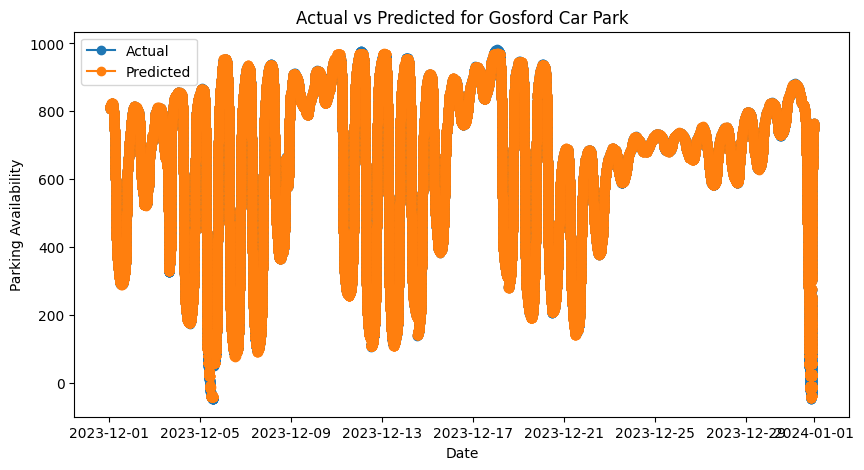

Best Hyperparameters for Hills Showground Car Park: {'alpha': 0, 'gamma': 0.1, 'lambda': 0.1, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 40}
Mean Squared Error for Hills Showground Car Park: 0.4429389960611264
Root Mean Squared Error for Hills Showground Car Park: 0.6655366226295337
Mean Absolute Error for Hills Showground Car Park: 0.5266982327657713


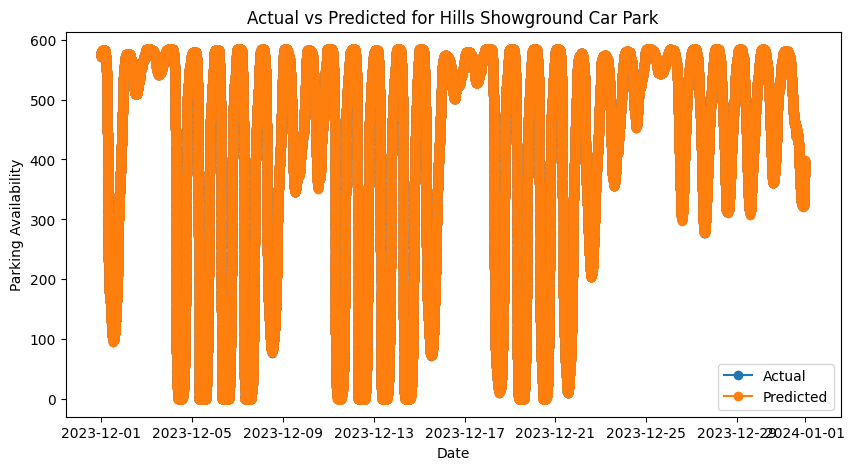

Best Hyperparameters for Hornsby Jersey St Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Hornsby Jersey St Car Park: 4.964290989198528e-07
Root Mean Squared Error for Hornsby Jersey St Car Park: 0.0007045772483694409
Mean Absolute Error for Hornsby Jersey St Car Park: 0.0006193744869206813


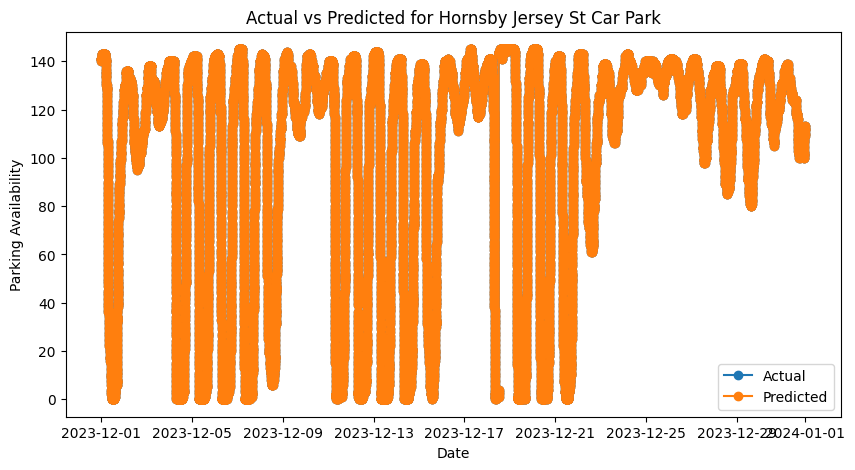

Best Hyperparameters for Kellyville North Car Park: {'alpha': 0.01, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 40}
Mean Squared Error for Kellyville North Car Park: 0.2219067104154018
Root Mean Squared Error for Kellyville North Car Park: 0.4710697511148448
Mean Absolute Error for Kellyville North Car Park: 0.29490317139582406


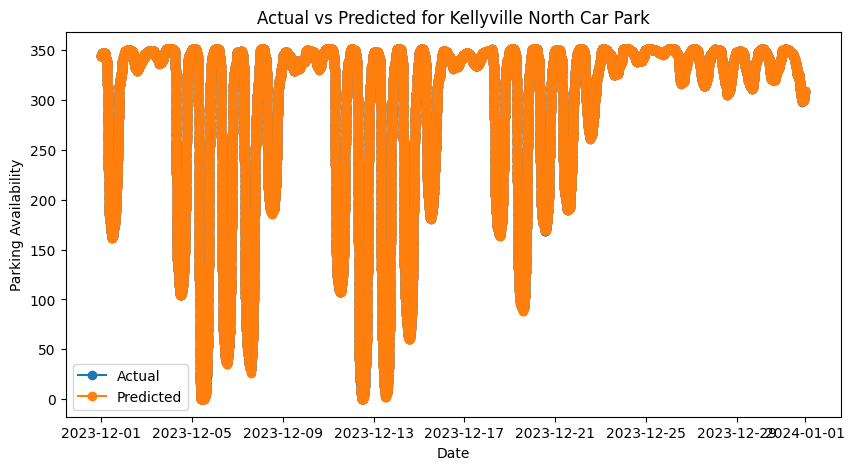

Best Hyperparameters for Kellyville South Car Park: {'alpha': 0.2, 'gamma': 0.1, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 40}
Mean Squared Error for Kellyville South Car Park: 1.340191546938284
Root Mean Squared Error for Kellyville South Car Park: 1.1576664229985614
Mean Absolute Error for Kellyville South Car Park: 0.9111500107416131


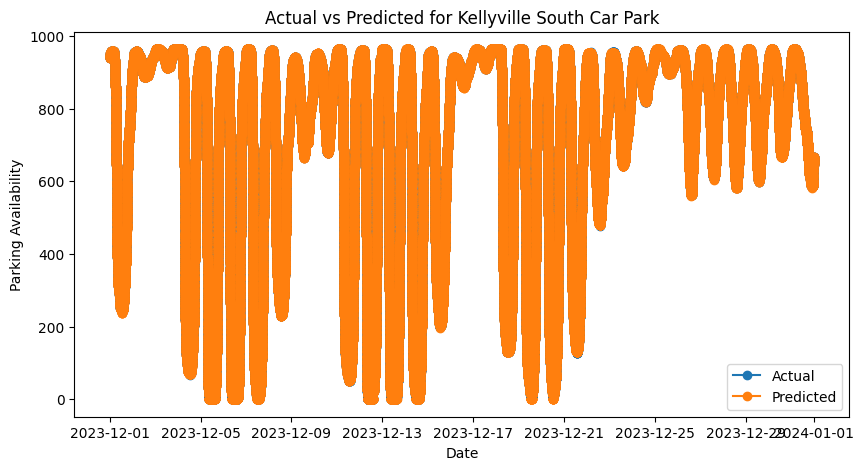

Best Hyperparameters for Kiama Car Park: {'alpha': 0.2, 'gamma': 0, 'lambda': 0.1, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 40}
Mean Squared Error for Kiama Car Park: 0.030695699425820202
Root Mean Squared Error for Kiama Car Park: 0.17520188191289557
Mean Absolute Error for Kiama Car Park: 0.11233175400296284


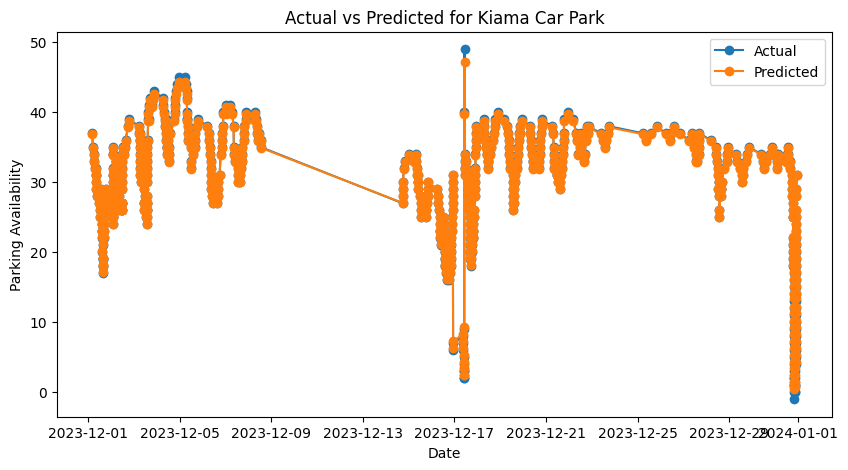

Best Hyperparameters for Leppington Car Park: {'alpha': 0.2, 'gamma': 0, 'lambda': 0.1, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 40}
Mean Squared Error for Leppington Car Park: 45.46786509961604
Root Mean Squared Error for Leppington Car Park: 6.742986363594104
Mean Absolute Error for Leppington Car Park: 5.287244433018284


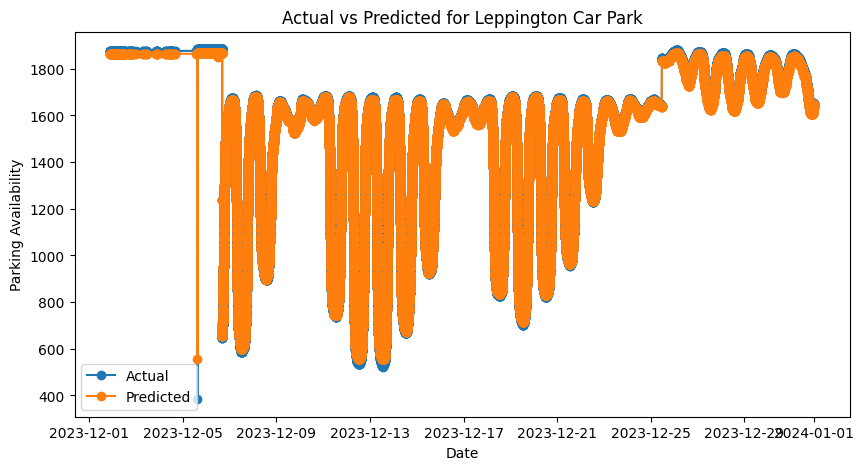

Best Hyperparameters for Mona Vale Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Mona Vale Car Park: 1.0461696643596301e-07
Root Mean Squared Error for Mona Vale Car Park: 0.00032344546130060785
Mean Absolute Error for Mona Vale Car Park: 0.00028496229039872323


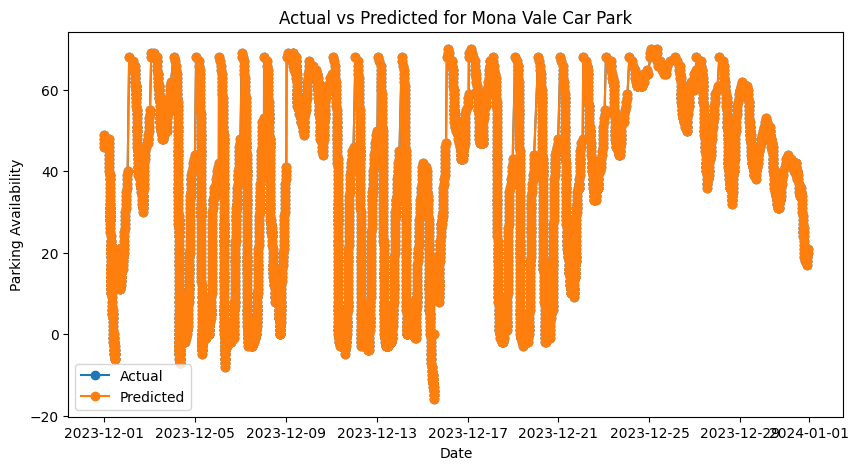

Best Hyperparameters for Narrabeen Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 50}
Mean Squared Error for Narrabeen Car Park: 5.203472649191167e-08
Root Mean Squared Error for Narrabeen Car Park: 0.0002281112151822257
Mean Absolute Error for Narrabeen Car Park: 0.00020143386477723026


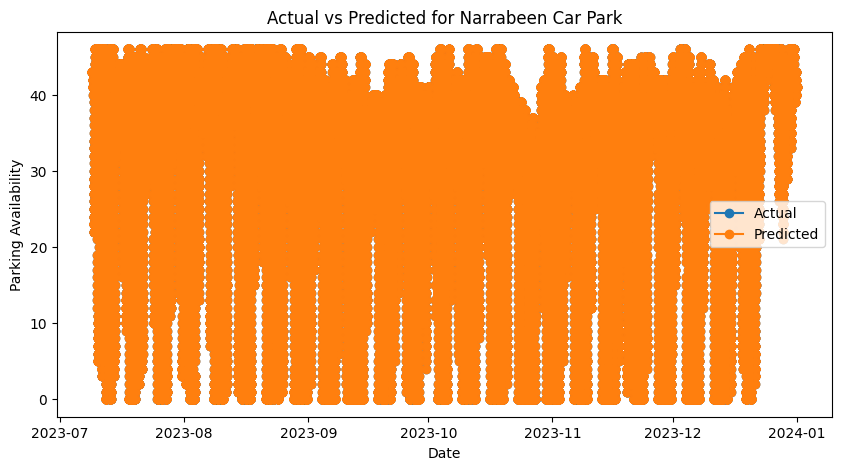

Best Hyperparameters for Penrith Combewood At-Grade Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Penrith Combewood At-Grade Car Park: 2.0340721102186058e-07
Root Mean Squared Error for Penrith Combewood At-Grade Car Park: 0.00045100688578098296
Mean Absolute Error for Penrith Combewood At-Grade Car Park: 0.00038018164696631494


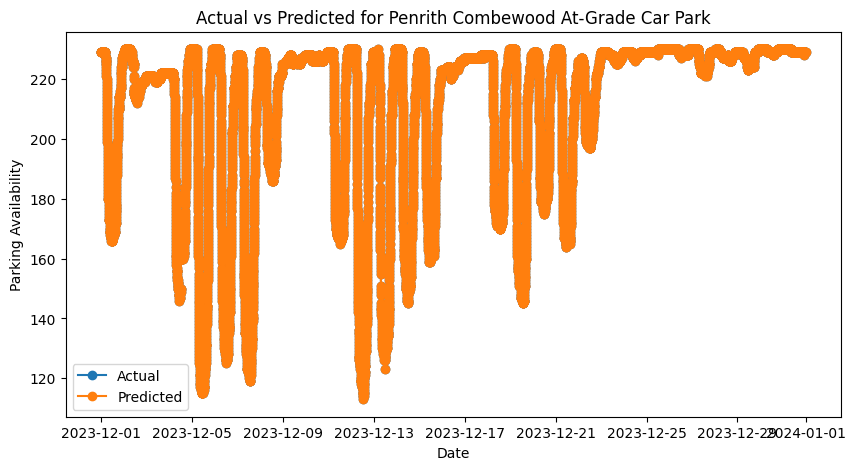

Best Hyperparameters for Penrith Combewood Multi-Level Car Park: {'alpha': 0, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 40}
Mean Squared Error for Penrith Combewood Multi-Level Car Park: 0.9393959920390126
Root Mean Squared Error for Penrith Combewood Multi-Level Car Park: 0.9692244281068305
Mean Absolute Error for Penrith Combewood Multi-Level Car Park: 0.6694620632583588


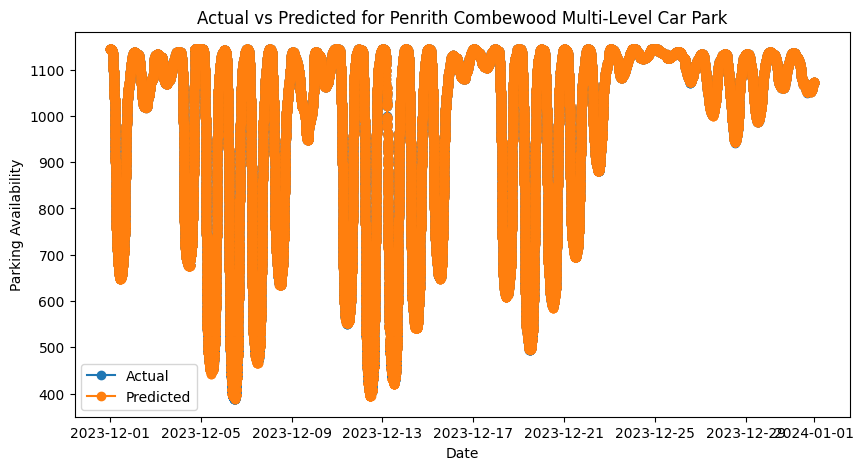

Best Hyperparameters for Revesby Car Park: {'alpha': 0, 'gamma': 0.2, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 40}
Mean Squared Error for Revesby Car Park: 0.6305147778864788
Root Mean Squared Error for Revesby Car Park: 0.7940496066912185
Mean Absolute Error for Revesby Car Park: 0.5326281207540761


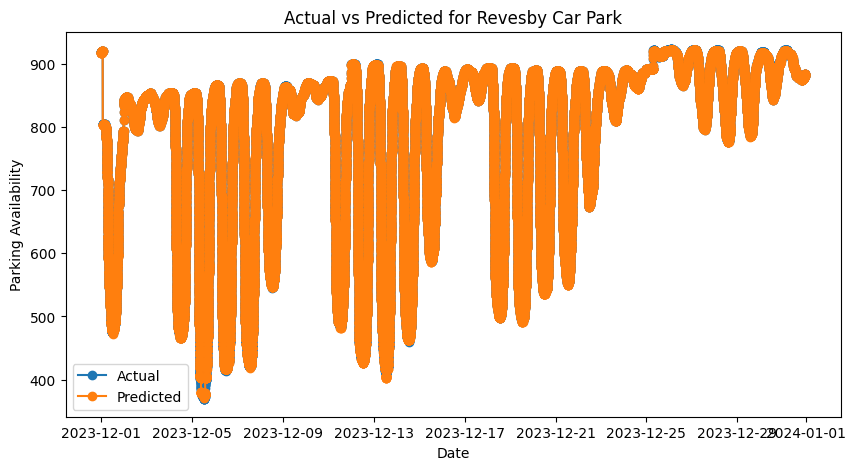

Best Hyperparameters for Schofields Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 40}
Mean Squared Error for Schofields Car Park: 0.7354026423881329
Root Mean Squared Error for Schofields Car Park: 0.857556203632236
Mean Absolute Error for Schofields Car Park: 0.6003361504601074


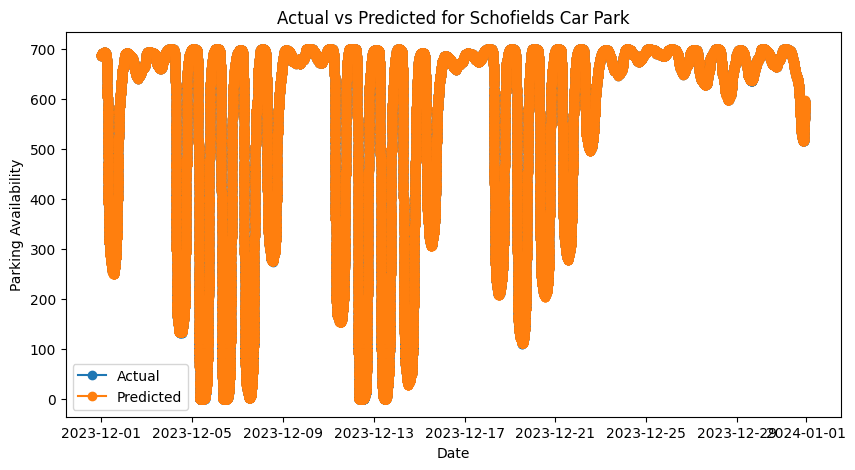

Best Hyperparameters for St Marys Car Park: {'alpha': 0.01, 'gamma': 0.1, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50}
Mean Squared Error for St Marys Car Park: 0.38504719016208877
Root Mean Squared Error for St Marys Car Park: 0.6205217080506441
Mean Absolute Error for St Marys Car Park: 0.45462815426292175


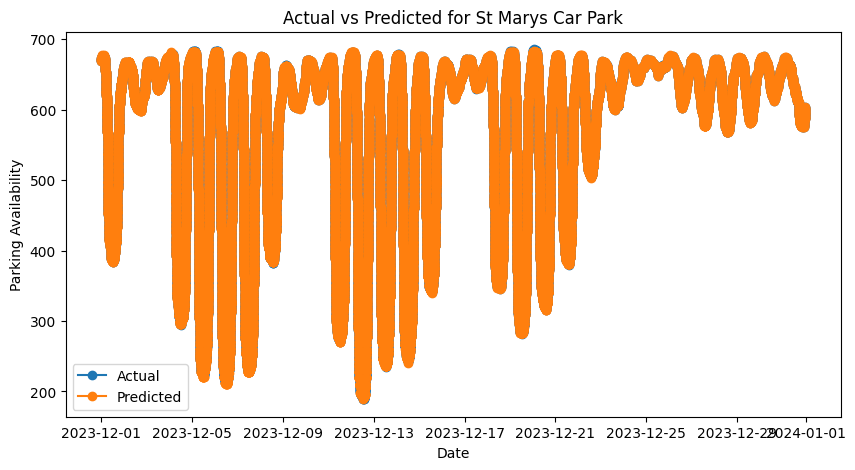

Best Hyperparameters for Sutherland East Parade Car Park: {'alpha': 0.1, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50}
Mean Squared Error for Sutherland East Parade Car Park: 0.23261513020831856
Root Mean Squared Error for Sutherland East Parade Car Park: 0.48230190773862647
Mean Absolute Error for Sutherland East Parade Car Park: 0.3501736229730717


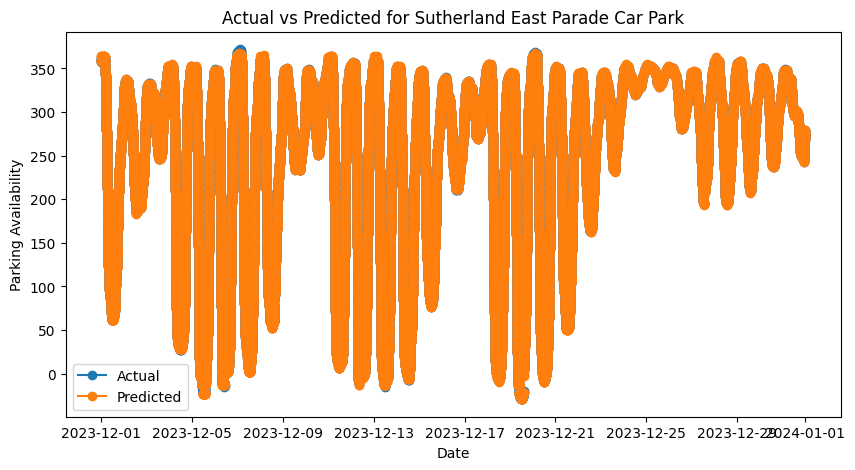

Best Hyperparameters for Tallawong P1 Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Tallawong P1 Car Park: 3.1999849487220274e-07
Root Mean Squared Error for Tallawong P1 Car Park: 0.0005656840945900837
Mean Absolute Error for Tallawong P1 Car Park: 0.0005008013444508728


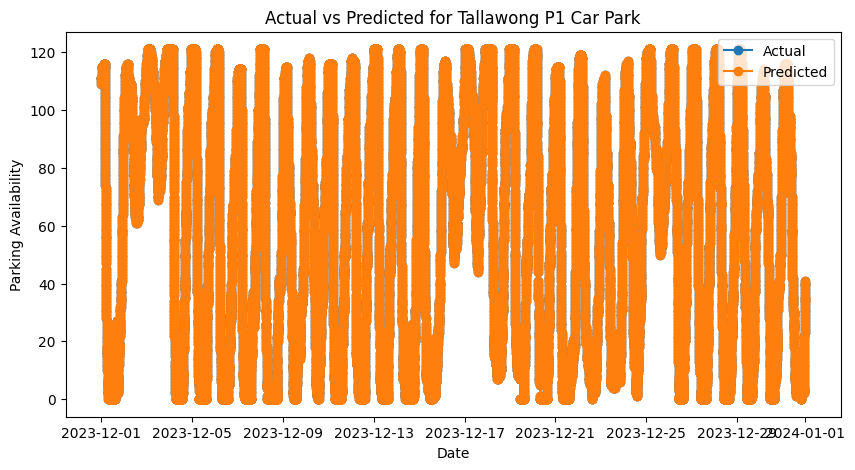

Best Hyperparameters for Tallawong P2 Car Park: {'alpha': 0.01, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 50}
Mean Squared Error for Tallawong P2 Car Park: 0.23464551769179506
Root Mean Squared Error for Tallawong P2 Car Park: 0.48440222717468495
Mean Absolute Error for Tallawong P2 Car Park: 0.3823457071166884


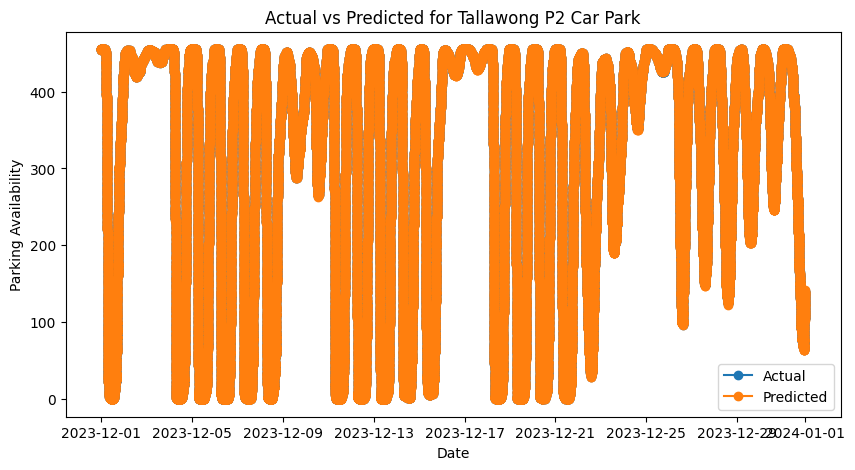

Best Hyperparameters for Tallawong P3 Car Park: {'alpha': 0.2, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 50}
Mean Squared Error for Tallawong P3 Car Park: 0.19720621591062745
Root Mean Squared Error for Tallawong P3 Car Park: 0.4440790649317162
Mean Absolute Error for Tallawong P3 Car Park: 0.336202087839784


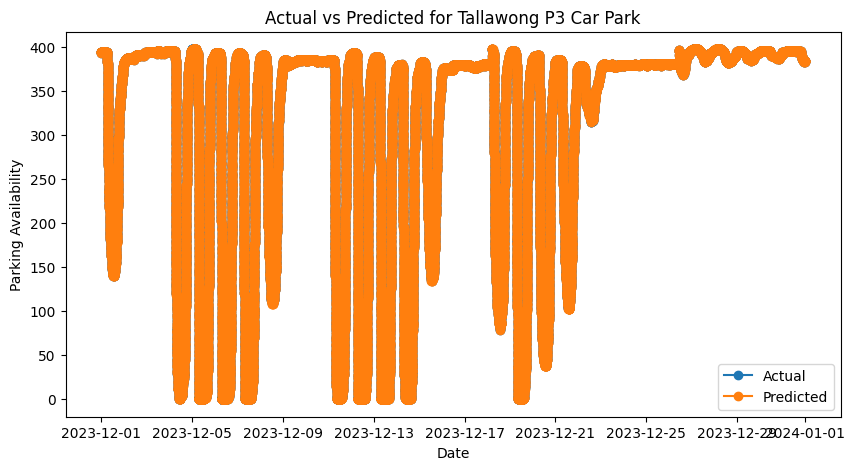

Best Hyperparameters for Warriewood Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for Warriewood Car Park: 0.02839503829334266
Root Mean Squared Error for Warriewood Car Park: 0.16850827366435947
Mean Absolute Error for Warriewood Car Park: 0.05243427213843988


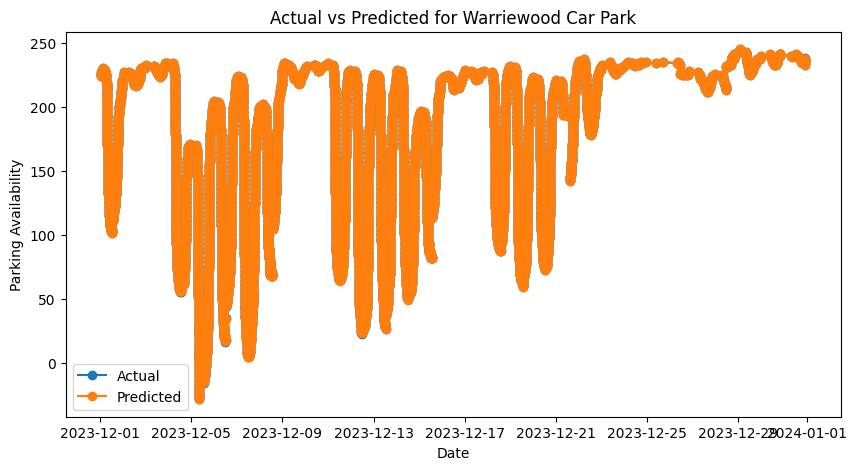

Best Hyperparameters for Warwick Farm Car Park: {'alpha': 0.2, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50}
Mean Squared Error for Warwick Farm Car Park: 0.5579637870082182
Root Mean Squared Error for Warwick Farm Car Park: 0.7469697363402471
Mean Absolute Error for Warwick Farm Car Park: 0.547515260986846


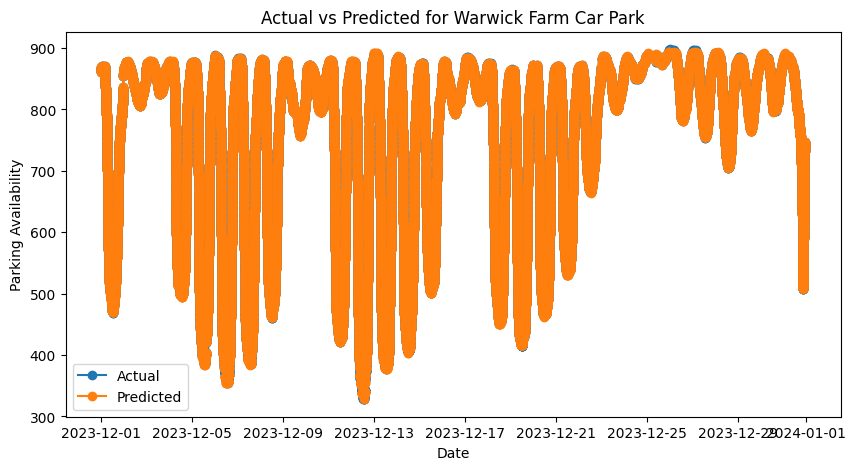

Best Hyperparameters for West Ryde Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Mean Squared Error for West Ryde Car Park: 5.261063279624136e-07
Root Mean Squared Error for West Ryde Car Park: 0.0007253318743598778
Mean Absolute Error for West Ryde Car Park: 0.0006348708946703349


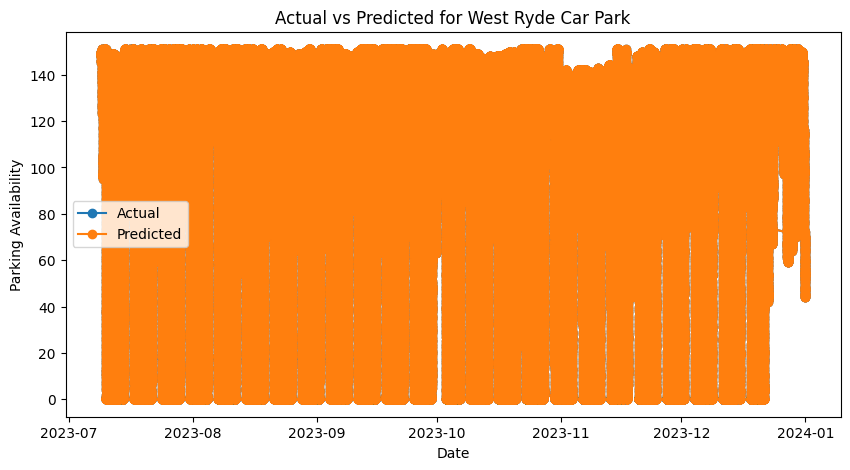

In [75]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for GridSearchCV
param_grid = { 
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 6, 7],
    "gamma": [0, 0.1, 0.2],
    "lambda": [0, 0.01,  0.1],
    "alpha": [0, 0.01, 0.1, 0.2],
    "n_estimators": [20, 40, 50]
}

# # Dictionary to store XGBoost models for each parking lot
# xg_models = {}

# # Train a model for each parking lot
# for facility_name, group_data in xg_grouped:
#     # Split the data into features and target variable
#     X = group_data.drop(columns=["parking_availability", "facility_name"], axis=1)
#     y = group_data["parking_availability"]

#     # Create an XGBoost model
#     xg_model = xgb.XGBRegressor(objective='reg:squarederror')

#     # Perform GridSearchCV
#     grid_search = GridSearchCV(xg_model, param_grid=param_grid, cv=3, n_jobs=-1)
#     grid_search.fit(X, y)

#     # Get the best hyperparameters
#     best_params = grid_search.best_params_
#     print(f'Best Hyperparameters for {facility_name}: {best_params}')

#     # Use the best model from GridSearchCV
#     best_model = grid_search.best_estimator_

#     # Train the model
#     best_model.fit(X, y)

#     # Make predictions on the entire dataset
#     group_data["prediction"] = best_model.predict(X)

#     # Evaluate the model
#     mse = mean_squared_error(y, group_data["prediction"])
#     rmse = sqrt(mse)
#     mae = mean_absolute_error(y, group_data["prediction"])
#     print(f'Mean Squared Error for {facility_name}: {mse}')
#     print(f'Root Mean Squared Error for {facility_name}: {rmse}')
#     print(f'Mean Absolute Error for {facility_name}: {mae}')

#     # Store the trained model in the dictionary
#     xg_models[facility_name] = best_model

#     # Plot actual vs predicted values
#     plt.figure(figsize=(10, 5))
#     plt.plot(group_data.index, y, label='Actual', marker='o')
#     plt.plot(group_data.index, group_data["prediction"], label='Predicted', marker='o')
#     plt.title(f'Actual vs Predicted for {facility_name}')
#     plt.xlabel('Date')
#     plt.ylabel('Parking Availability')
#     plt.legend()
#     plt.show()

Now that we have our best parameters for the Xgboost model. We are going to build final models for each time series and make predictions with it.


In [99]:
# Define the parameter grid for GridSearchCV
param_grid = { 
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 6, 7],
    "gamma": [0, 0.1, 0.2],
    "lambda": [0, 0.01,  0.1],
    "alpha": [0, 0.01, 0.1, 0.2],
    "n_estimators": [20, 40, 50]
}
#class XGBOOST
class XGBoostTimeSeriesModel:
    def __init__(self, param_grid, target_variable='parking_availability', cv=3, n_jobs=-1):
        self.param_grid = param_grid
        self.target_variable = target_variable
        self.cv = cv
        self.n_jobs = n_jobs
        self.models = {}

    def _get_features_target(self, group_data):
        X = group_data.drop(columns=[self.target_variable, "facility_name"], axis=1)
        y = group_data[self.target_variable]
        return X, y

    def train_models(self, xg_grouped):
        for facility_name, group_data in xg_grouped:
            X, y = self._get_features_target(group_data)

            # Create an XGBoost model
            xg_model = xgb.XGBRegressor(objective='reg:squarederror')

            # Perform GridSearchCV
            grid_search = GridSearchCV(xg_model, param_grid=self.param_grid, cv=self.cv, n_jobs=self.n_jobs)
            grid_search.fit(X, y)

            # Get the best hyperparameters
            best_params = grid_search.best_params_
            # print(f'Best Hyperparameters for {facility_name}: {best_params}')

            # Use the best model from GridSearchCV
            best_model = grid_search.best_estimator_

            # Train the model
            best_model.fit(X, y)

            # Store the trained model in the dictionary
            self.models[facility_name] = best_model

    def predict_and_plot(self, xg_grouped):
        for facility_name, model in self.models.items():
            # Get the last available data for each facility
            last_data = xg_grouped.get_group(facility_name).tail(1).drop(columns=["parking_availability", "facility_name"])

            # Make predictions for the next time period
            facility_predictions = model.predict(last_data)

            # Plot actual vs predicted values
            group_data = xg_grouped.get_group(facility_name)
            plt.figure(figsize=(10, 5))
            plt.plot(group_data.index, group_data[self.target_variable], label='Actual', marker='o')
            plt.plot(group_data.index, group_data["prediction"], label='Predicted', marker='o')
            plt.title(f'Actual vs Predicted for {facility_name}')
            plt.xlabel('Date')
            plt.ylabel('Parking Availability')
            plt.legend()
            plt.show()

# Example usage:
xg_model = XGBoostTimeSeriesModel(param_grid)
xg_model.train_models(xg_grouped)
xg_model.predict_and_plot(xg_grouped)


Best Hyperparameters for Bella Vista Car Park: {'alpha': 0.1, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 40}
Best Hyperparameters for Campbelltown Farrow Rd North Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Best Hyperparameters for Campbelltown Hurley Street South Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Best Hyperparameters for Cherrybrook Car Park: {'alpha': 0.2, 'gamma': 0.2, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Best Hyperparameters for Dee Why Car Park: {'alpha': 0, 'gamma': 0, 'lambda': 0.01, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
Best Hyperparameters for Edmondson Park South Car Park: {'alpha': 0.2, 'gamma': 0, 'lambda': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
Best Hyperparameters for Gordon Henry St North Car Park: {'alpha': 0, 'gamma': 0, '

### LSTM 
Long Short-Term Memory (LSTM) is a type of recurrent neural network (RNN) architecture designed to address the vanishing gradient problem in traditional RNNs. LSTMs have a unique memory cell, input gate, forget gate, and output gate, allowing them to capture and remember long-term dependencies in sequential data. They are widely used for tasks involving time series prediction, natural language processing, and other sequential data applications.


In [91]:

from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

class CarParkLSTM:
    def __init__(self, df, facility_name, target_variable = "availability", sequence_length =10, epochs = 50, batch_size = 32):
        self.df = df[df["facility_name"] == facility_name].copy()
        self.target_variable = target_variable
        self.sequence_length = sequence_length
        self.epochs = epochs
        self.batch_size = batch_size
        self.scaler = MinMaxScaler(feature_range=(0, 1))
        self.model = self.build_model()

    def build_model(self):
        model = Sequential()
        model.add(LSTM(units=50, activation='relu', input_shape=(self.sequence_length, 1)))
        model.add(LSTM(units=30, activation='relu', input_shape=(self.sequence_length, 1)))
        model.add(Dense(units=1))
        model.compile(optimizer='adam', loss='mean_squared_error')
        return model

    def prepare_data(self):
        # Scale the target variable values between 0 and 1
        self.df['scaled_target'] = self.scaler.fit_transform(self.df[self.target_variable].values.reshape(-1, 1))

        # Create sequences of data for training
        data = self.df['scaled_target'].values
        sequences = []
        for i in range(len(data) - self.sequence_length):
            sequences.append(data[i:i + self.sequence_length])
        sequences = np.array(sequences)

        # Split data into input (X) and output (y)
        X = sequences[:, :-1]
        y = sequences[:, -1]

        # Reshape for LSTM input shape (samples, time steps, features)
        X = X.reshape(X.shape[0], X.shape[1], 1)

        return X, y

    def train_model(self):
        X, y = self.prepare_data()
        self.model.fit(X, y, epochs=self.epochs, batch_size=self.batch_size, verbose=0)

    def predict(self, future_periods=7):
        last_sequence = self.df['scaled_target'].values[-self.sequence_length:]
        last_sequence = last_sequence.reshape(1, -1, 1)
        predictions_scaled = []

        for _ in range(future_periods):
            prediction_scaled = self.model.predict(last_sequence)
            predictions_scaled.append(prediction_scaled[0, 0])
            last_sequence = np.append(last_sequence[:, 1:, :], [[prediction_scaled[0, 0]]], axis=1)

        predictions_scaled = np.array(predictions_scaled)
        predictions = self.scaler.inverse_transform(predictions_scaled.reshape(-1, 1))

        return predictions

    def provide_forecast(self, start_datetime, forecast_period=7):
        self.train_model()

        # Find the last available datetime in the dataset
        last_datetime = self.df['timestamp'].max()

        # Generate a sequence of datetimes for forecasting
        forecast_datetimes = pd.date_range(start=last_datetime + pd.Timedelta(minutes=15), periods=forecast_period*96, freq='15T')

        # Make predictions for the specified period
        predictions = self.predict(forecast_period*96)

        # Create a DataFrame with forecast datetimes and predictions
        forecast_df = pd.DataFrame({'timestamp': forecast_datetimes, 'predicted_availability': predictions.flatten()})

        # Filter forecast for the specified start datetime and period
        forecast_result = forecast_df[forecast_df['timestamp'] >= start_datetime].head(forecast_period)

        return forecast_result

    def plot_predictions(self, future_periods=7):
        self.train_model()
        predictions = self.predict(future_periods)

        plt.figure(figsize=(12, 6))
        plt.plot(self.df['timestamp'], self.df[self.target_variable], label='Actual Availability', marker='o')
        plt.plot(pd.date_range(start=self.df['timestamp'].iloc[-1], periods=future_periods*96 + 1, freq='15T')[1:],
                predictions, label='Predicted Availability', marker='o')
        plt.title(f"Car Park Facility {self.df['facility_name'].iloc[0]} Availability Prediction")
        plt.xlabel('Date')
        plt.ylabel('Availability')
        plt.legend()
        plt.show()

# Example usage:
# Assuming your DataFrame is named 'car_park_data' with columns 'timestamp', 'facility_name', and 'availability'
for facility_name in xg_grouped['facility_name'].unique():
    lstm_model = CarParkLSTM(df= xg_grouped, facility_name=facility_name, target_variable='y')
    lstm_model.plot_predictions(future_periods=7)

# For providing forecasts for a specific period
forecast_start_datetime = pd.to_datetime('2024-02-11 12:00:00') # Enter the desired start datetime
forecast_period = 7 # Enter the desired forecast period (in days)
forecast_result = lstm_model.provide_forecast(start)
print(forecast_result)


TypeError: list indices must be integers or slices, not str